# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_8"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: eqgc7afb
Name: stellar-tie-fighter-189
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/eqgc7afb
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_221505-eqgc7afb/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "



Training:   0%|          | 0/600 [00:00<?, ?it/s]


Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `training` set. Number of elements in each group: 4822,7582,5831,6754,15178,18791
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `validation` set. Number of elements in each group: 1191,1862,1488,1590,3787,4821
  possible_indices = CachedPossibleGroupDefinitionIndices.get(



Epoch 1/600:   0%|          | 1/600 [00:55<9:18:56, 55.99s/it]


Epoch 1/600:   0%|          | 1/600 [00:55<9:18:56, 55.99s/it, v_num=fb_1, total_loss_train=632, kl_local_train=28.5]


Epoch 2/600:   0%|          | 1/600 [00:56<9:18:56, 55.99s/it, v_num=fb_1, total_loss_train=632, kl_local_train=28.5]


Epoch 2/600:   0%|          | 2/600 [01:47<8:49:28, 53.12s/it, v_num=fb_1, total_loss_train=632, kl_local_train=28.5]


Epoch 2/600:   0%|          | 2/600 [01:47<8:49:28, 53.12s/it, v_num=fb_1, total_loss_train=484, kl_local_train=51.6]


Epoch 3/600:   0%|          | 2/600 [01:47<8:49:28, 53.12s/it, v_num=fb_1, total_loss_train=484, kl_local_train=51.6]


Epoch 3/600:   0%|          | 3/600 [02:37<8:38:25, 52.10s/it, v_num=fb_1, total_loss_train=484, kl_local_train=51.6]


Epoch 3/600:   0%|          | 3/600 [02:37<8:38:25, 52.10s/it, v_num=fb_1, total_loss_train=453, kl_local_train=60.7]


Epoch 4/600:   0%|          | 3/600 [02:38<8:38:25, 52.10s/it, v_num=fb_1, total_loss_train=453, kl_local_train=60.7]


Epoch 4/600:   1%|          | 4/600 [03:28<8:32:39, 51.61s/it, v_num=fb_1, total_loss_train=453, kl_local_train=60.7]


Epoch 4/600:   1%|          | 4/600 [03:28<8:32:39, 51.61s/it, v_num=fb_1, total_loss_train=443, kl_local_train=64.6]


Epoch 5/600:   1%|          | 4/600 [03:28<8:32:39, 51.61s/it, v_num=fb_1, total_loss_train=443, kl_local_train=64.6]


Epoch 5/600:   1%|          | 5/600 [04:20<8:31:45, 51.61s/it, v_num=fb_1, total_loss_train=443, kl_local_train=64.6]


Epoch 5/600:   1%|          | 5/600 [04:20<8:31:45, 51.61s/it, v_num=fb_1, total_loss_train=438, kl_local_train=65.7]


Epoch 6/600:   1%|          | 5/600 [04:21<8:31:45, 51.61s/it, v_num=fb_1, total_loss_train=438, kl_local_train=65.7]


Epoch 6/600:   1%|          | 6/600 [05:08<8:17:54, 50.29s/it, v_num=fb_1, total_loss_train=438, kl_local_train=65.7]


Epoch 6/600:   1%|          | 6/600 [05:08<8:17:54, 50.29s/it, v_num=fb_1, total_loss_train=434, kl_local_train=65.8, metric_mi|age_categorical_train=0.07]


Epoch 7/600:   1%|          | 6/600 [05:08<8:17:54, 50.29s/it, v_num=fb_1, total_loss_train=434, kl_local_train=65.8, metric_mi|age_categorical_train=0.07]


Epoch 7/600:   1%|          | 7/600 [05:54<8:03:42, 48.94s/it, v_num=fb_1, total_loss_train=434, kl_local_train=65.8, metric_mi|age_categorical_train=0.07]


Epoch 7/600:   1%|          | 7/600 [05:54<8:03:42, 48.94s/it, v_num=fb_1, total_loss_train=432, kl_local_train=65.4, metric_mi|age_categorical_train=0.07]


Epoch 8/600:   1%|          | 7/600 [05:54<8:03:42, 48.94s/it, v_num=fb_1, total_loss_train=432, kl_local_train=65.4, metric_mi|age_categorical_train=0.07]


Epoch 8/600:   1%|▏         | 8/600 [06:40<7:54:22, 48.08s/it, v_num=fb_1, total_loss_train=432, kl_local_train=65.4, metric_mi|age_categorical_train=0.07]


Epoch 8/600:   1%|▏         | 8/600 [06:40<7:54:22, 48.08s/it, v_num=fb_1, total_loss_train=443, kl_local_train=80.6, metric_mi|age_categorical_train=0.07]


Epoch 9/600:   1%|▏         | 8/600 [06:40<7:54:22, 48.08s/it, v_num=fb_1, total_loss_train=443, kl_local_train=80.6, metric_mi|age_categorical_train=0.07]


Epoch 9/600:   2%|▏         | 9/600 [07:27<7:48:53, 47.60s/it, v_num=fb_1, total_loss_train=443, kl_local_train=80.6, metric_mi|age_categorical_train=0.07]


Epoch 9/600:   2%|▏         | 9/600 [07:27<7:48:53, 47.60s/it, v_num=fb_1, total_loss_train=452, kl_local_train=71.1, metric_mi|age_categorical_train=0.07]


Epoch 10/600:   2%|▏         | 9/600 [07:27<7:48:53, 47.60s/it, v_num=fb_1, total_loss_train=452, kl_local_train=71.1, metric_mi|age_categorical_train=0.07]


Epoch 10/600:   2%|▏         | 10/600 [08:14<7:46:23, 47.43s/it, v_num=fb_1, total_loss_train=452, kl_local_train=71.1, metric_mi|age_categorical_train=0.07]


Epoch 10/600:   2%|▏         | 10/600 [08:14<7:46:23, 47.43s/it, v_num=fb_1, total_loss_train=460, kl_local_train=64.5, metric_mi|age_categorical_train=0.07]


Epoch 11/600:   2%|▏         | 10/600 [08:14<7:46:23, 47.43s/it, v_num=fb_1, total_loss_train=460, kl_local_train=64.5, metric_mi|age_categorical_train=0.07]


Epoch 11/600:   2%|▏         | 11/600 [09:00<7:41:22, 47.00s/it, v_num=fb_1, total_loss_train=460, kl_local_train=64.5, metric_mi|age_categorical_train=0.07]


Epoch 11/600:   2%|▏         | 11/600 [09:00<7:41:22, 47.00s/it, v_num=fb_1, total_loss_train=469, kl_local_train=62.9, metric_mi|age_categorical_train=0.0682]


Epoch 12/600:   2%|▏         | 11/600 [09:00<7:41:22, 47.00s/it, v_num=fb_1, total_loss_train=469, kl_local_train=62.9, metric_mi|age_categorical_train=0.0682]


Epoch 12/600:   2%|▏         | 12/600 [09:45<7:35:56, 46.52s/it, v_num=fb_1, total_loss_train=469, kl_local_train=62.9, metric_mi|age_categorical_train=0.0682]


Epoch 12/600:   2%|▏         | 12/600 [09:45<7:35:56, 46.52s/it, v_num=fb_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.0682]


Epoch 13/600:   2%|▏         | 12/600 [09:45<7:35:56, 46.52s/it, v_num=fb_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.0682]


Epoch 13/600:   2%|▏         | 13/600 [10:31<7:34:07, 46.42s/it, v_num=fb_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.0682]


Epoch 13/600:   2%|▏         | 13/600 [10:31<7:34:07, 46.42s/it, v_num=fb_1, total_loss_train=487, kl_local_train=61.2, metric_mi|age_categorical_train=0.0682]


Epoch 14/600:   2%|▏         | 13/600 [10:31<7:34:07, 46.42s/it, v_num=fb_1, total_loss_train=487, kl_local_train=61.2, metric_mi|age_categorical_train=0.0682]


Epoch 14/600:   2%|▏         | 14/600 [11:17<7:31:31, 46.23s/it, v_num=fb_1, total_loss_train=487, kl_local_train=61.2, metric_mi|age_categorical_train=0.0682]


Epoch 14/600:   2%|▏         | 14/600 [11:17<7:31:31, 46.23s/it, v_num=fb_1, total_loss_train=496, kl_local_train=61.9, metric_mi|age_categorical_train=0.0682]


Epoch 15/600:   2%|▏         | 14/600 [11:17<7:31:31, 46.23s/it, v_num=fb_1, total_loss_train=496, kl_local_train=61.9, metric_mi|age_categorical_train=0.0682]


Epoch 15/600:   2%|▎         | 15/600 [12:08<7:43:19, 47.52s/it, v_num=fb_1, total_loss_train=496, kl_local_train=61.9, metric_mi|age_categorical_train=0.0682]


Epoch 15/600:   2%|▎         | 15/600 [12:08<7:43:19, 47.52s/it, v_num=fb_1, total_loss_train=505, kl_local_train=62, metric_mi|age_categorical_train=0.0682]  


Epoch 16/600:   2%|▎         | 15/600 [12:08<7:43:19, 47.52s/it, v_num=fb_1, total_loss_train=505, kl_local_train=62, metric_mi|age_categorical_train=0.0682]


Epoch 16/600:   3%|▎         | 16/600 [12:56<7:44:35, 47.73s/it, v_num=fb_1, total_loss_train=505, kl_local_train=62, metric_mi|age_categorical_train=0.0682]


Epoch 16/600:   3%|▎         | 16/600 [12:56<7:44:35, 47.73s/it, v_num=fb_1, total_loss_train=514, kl_local_train=63.3, metric_mi|age_categorical_train=0.068]


Epoch 17/600:   3%|▎         | 16/600 [12:56<7:44:35, 47.73s/it, v_num=fb_1, total_loss_train=514, kl_local_train=63.3, metric_mi|age_categorical_train=0.068]


Epoch 17/600:   3%|▎         | 17/600 [13:43<7:42:25, 47.59s/it, v_num=fb_1, total_loss_train=514, kl_local_train=63.3, metric_mi|age_categorical_train=0.068]


Epoch 17/600:   3%|▎         | 17/600 [13:43<7:42:25, 47.59s/it, v_num=fb_1, total_loss_train=522, kl_local_train=67.6, metric_mi|age_categorical_train=0.068]


Epoch 18/600:   3%|▎         | 17/600 [13:43<7:42:25, 47.59s/it, v_num=fb_1, total_loss_train=522, kl_local_train=67.6, metric_mi|age_categorical_train=0.068]


Epoch 18/600:   3%|▎         | 18/600 [14:29<7:37:19, 47.15s/it, v_num=fb_1, total_loss_train=522, kl_local_train=67.6, metric_mi|age_categorical_train=0.068]


Epoch 18/600:   3%|▎         | 18/600 [14:29<7:37:19, 47.15s/it, v_num=fb_1, total_loss_train=525, kl_local_train=84.4, metric_mi|age_categorical_train=0.068]


Epoch 19/600:   3%|▎         | 18/600 [14:29<7:37:19, 47.15s/it, v_num=fb_1, total_loss_train=525, kl_local_train=84.4, metric_mi|age_categorical_train=0.068]


Epoch 19/600:   3%|▎         | 19/600 [15:15<7:33:07, 46.80s/it, v_num=fb_1, total_loss_train=525, kl_local_train=84.4, metric_mi|age_categorical_train=0.068]


Epoch 19/600:   3%|▎         | 19/600 [15:15<7:33:07, 46.80s/it, v_num=fb_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.068] 


Epoch 20/600:   3%|▎         | 19/600 [15:15<7:33:07, 46.80s/it, v_num=fb_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.068]


Epoch 20/600:   3%|▎         | 20/600 [16:03<7:34:04, 46.97s/it, v_num=fb_1, total_loss_train=492, kl_local_train=164, metric_mi|age_categorical_train=0.068]


Epoch 20/600:   3%|▎         | 20/600 [16:03<7:34:04, 46.97s/it, v_num=fb_1, total_loss_train=478, kl_local_train=234, metric_mi|age_categorical_train=0.068]


Epoch 21/600:   3%|▎         | 20/600 [16:03<7:34:04, 46.97s/it, v_num=fb_1, total_loss_train=478, kl_local_train=234, metric_mi|age_categorical_train=0.068]


Epoch 21/600:   4%|▎         | 21/600 [16:49<7:32:36, 46.90s/it, v_num=fb_1, total_loss_train=478, kl_local_train=234, metric_mi|age_categorical_train=0.068]


Epoch 21/600:   4%|▎         | 21/600 [16:49<7:32:36, 46.90s/it, v_num=fb_1, total_loss_train=476, kl_local_train=272, metric_mi|age_categorical_train=0.162]


Epoch 22/600:   4%|▎         | 21/600 [16:49<7:32:36, 46.90s/it, v_num=fb_1, total_loss_train=476, kl_local_train=272, metric_mi|age_categorical_train=0.162]


Epoch 22/600:   4%|▎         | 22/600 [17:36<7:30:00, 46.71s/it, v_num=fb_1, total_loss_train=476, kl_local_train=272, metric_mi|age_categorical_train=0.162]


Epoch 22/600:   4%|▎         | 22/600 [17:36<7:30:00, 46.71s/it, v_num=fb_1, total_loss_train=476, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 23/600:   4%|▎         | 22/600 [17:36<7:30:00, 46.71s/it, v_num=fb_1, total_loss_train=476, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 23/600:   4%|▍         | 23/600 [18:22<7:27:30, 46.53s/it, v_num=fb_1, total_loss_train=476, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 23/600:   4%|▍         | 23/600 [18:22<7:27:30, 46.53s/it, v_num=fb_1, total_loss_train=477, kl_local_train=301, metric_mi|age_categorical_train=0.162]


Epoch 24/600:   4%|▍         | 23/600 [18:22<7:27:30, 46.53s/it, v_num=fb_1, total_loss_train=477, kl_local_train=301, metric_mi|age_categorical_train=0.162]


Epoch 24/600:   4%|▍         | 24/600 [19:08<7:25:33, 46.41s/it, v_num=fb_1, total_loss_train=477, kl_local_train=301, metric_mi|age_categorical_train=0.162]


Epoch 24/600:   4%|▍         | 24/600 [19:08<7:25:33, 46.41s/it, v_num=fb_1, total_loss_train=477, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 25/600:   4%|▍         | 24/600 [19:08<7:25:33, 46.41s/it, v_num=fb_1, total_loss_train=477, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 25/600:   4%|▍         | 25/600 [19:55<7:27:32, 46.70s/it, v_num=fb_1, total_loss_train=477, kl_local_train=295, metric_mi|age_categorical_train=0.162]


Epoch 25/600:   4%|▍         | 25/600 [19:55<7:27:32, 46.70s/it, v_num=fb_1, total_loss_train=479, kl_local_train=288, metric_mi|age_categorical_train=0.162]


Epoch 26/600:   4%|▍         | 25/600 [19:56<7:27:32, 46.70s/it, v_num=fb_1, total_loss_train=479, kl_local_train=288, metric_mi|age_categorical_train=0.162]


Epoch 26/600:   4%|▍         | 26/600 [20:42<7:27:00, 46.73s/it, v_num=fb_1, total_loss_train=479, kl_local_train=288, metric_mi|age_categorical_train=0.162]


Epoch 26/600:   4%|▍         | 26/600 [20:42<7:27:00, 46.73s/it, v_num=fb_1, total_loss_train=481, kl_local_train=277, metric_mi|age_categorical_train=0.205]


Epoch 27/600:   4%|▍         | 26/600 [20:42<7:27:00, 46.73s/it, v_num=fb_1, total_loss_train=481, kl_local_train=277, metric_mi|age_categorical_train=0.205]


Epoch 27/600:   4%|▍         | 27/600 [21:28<7:24:31, 46.55s/it, v_num=fb_1, total_loss_train=481, kl_local_train=277, metric_mi|age_categorical_train=0.205]


Epoch 27/600:   4%|▍         | 27/600 [21:28<7:24:31, 46.55s/it, v_num=fb_1, total_loss_train=482, kl_local_train=275, metric_mi|age_categorical_train=0.205]


Epoch 28/600:   4%|▍         | 27/600 [21:28<7:24:31, 46.55s/it, v_num=fb_1, total_loss_train=482, kl_local_train=275, metric_mi|age_categorical_train=0.205]


Epoch 28/600:   5%|▍         | 28/600 [22:14<7:23:01, 46.47s/it, v_num=fb_1, total_loss_train=482, kl_local_train=275, metric_mi|age_categorical_train=0.205]


Epoch 28/600:   5%|▍         | 28/600 [22:14<7:23:01, 46.47s/it, v_num=fb_1, total_loss_train=484, kl_local_train=271, metric_mi|age_categorical_train=0.205]


Epoch 29/600:   5%|▍         | 28/600 [22:14<7:23:01, 46.47s/it, v_num=fb_1, total_loss_train=484, kl_local_train=271, metric_mi|age_categorical_train=0.205]


Epoch 29/600:   5%|▍         | 29/600 [23:00<7:20:28, 46.28s/it, v_num=fb_1, total_loss_train=484, kl_local_train=271, metric_mi|age_categorical_train=0.205]


Epoch 29/600:   5%|▍         | 29/600 [23:00<7:20:28, 46.28s/it, v_num=fb_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.205]


Epoch 30/600:   5%|▍         | 29/600 [23:00<7:20:28, 46.28s/it, v_num=fb_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.205]


Epoch 30/600:   5%|▌         | 30/600 [23:47<7:21:25, 46.47s/it, v_num=fb_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.205]


Epoch 30/600:   5%|▌         | 30/600 [23:47<7:21:25, 46.47s/it, v_num=fb_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.205]


Epoch 31/600:   5%|▌         | 30/600 [23:48<7:21:25, 46.47s/it, v_num=fb_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.205]


Epoch 31/600:   5%|▌         | 31/600 [24:34<7:20:20, 46.43s/it, v_num=fb_1, total_loss_train=487, kl_local_train=256, metric_mi|age_categorical_train=0.205]


Epoch 31/600:   5%|▌         | 31/600 [24:34<7:20:20, 46.43s/it, v_num=fb_1, total_loss_train=490, kl_local_train=254, metric_mi|age_categorical_train=0.232]


Epoch 32/600:   5%|▌         | 31/600 [24:34<7:20:20, 46.43s/it, v_num=fb_1, total_loss_train=490, kl_local_train=254, metric_mi|age_categorical_train=0.232]


Epoch 32/600:   5%|▌         | 32/600 [25:19<7:16:58, 46.16s/it, v_num=fb_1, total_loss_train=490, kl_local_train=254, metric_mi|age_categorical_train=0.232]


Epoch 32/600:   5%|▌         | 32/600 [25:19<7:16:58, 46.16s/it, v_num=fb_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.232]


Epoch 33/600:   5%|▌         | 32/600 [25:19<7:16:58, 46.16s/it, v_num=fb_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.232]


Epoch 33/600:   6%|▌         | 33/600 [26:05<7:14:33, 45.98s/it, v_num=fb_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.232]


Epoch 33/600:   6%|▌         | 33/600 [26:05<7:14:33, 45.98s/it, v_num=fb_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.232]


Epoch 34/600:   6%|▌         | 33/600 [26:05<7:14:33, 45.98s/it, v_num=fb_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.232]


Epoch 34/600:   6%|▌         | 34/600 [26:50<7:12:49, 45.88s/it, v_num=fb_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.232]


Epoch 34/600:   6%|▌         | 34/600 [26:50<7:12:49, 45.88s/it, v_num=fb_1, total_loss_train=495, kl_local_train=249, metric_mi|age_categorical_train=0.232]


Epoch 35/600:   6%|▌         | 34/600 [26:50<7:12:49, 45.88s/it, v_num=fb_1, total_loss_train=495, kl_local_train=249, metric_mi|age_categorical_train=0.232]


Epoch 35/600:   6%|▌         | 35/600 [27:37<7:15:27, 46.24s/it, v_num=fb_1, total_loss_train=495, kl_local_train=249, metric_mi|age_categorical_train=0.232]


Epoch 35/600:   6%|▌         | 35/600 [27:37<7:15:27, 46.24s/it, v_num=fb_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.232]


Epoch 36/600:   6%|▌         | 35/600 [27:38<7:15:27, 46.24s/it, v_num=fb_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.232]


Epoch 36/600:   6%|▌         | 36/600 [28:24<7:16:05, 46.39s/it, v_num=fb_1, total_loss_train=495, kl_local_train=239, metric_mi|age_categorical_train=0.232]


Epoch 36/600:   6%|▌         | 36/600 [28:24<7:16:05, 46.39s/it, v_num=fb_1, total_loss_train=494, kl_local_train=242, metric_mi|age_categorical_train=0.273]


Epoch 37/600:   6%|▌         | 36/600 [28:24<7:16:05, 46.39s/it, v_num=fb_1, total_loss_train=494, kl_local_train=242, metric_mi|age_categorical_train=0.273]


Epoch 37/600:   6%|▌         | 37/600 [29:10<7:13:44, 46.23s/it, v_num=fb_1, total_loss_train=494, kl_local_train=242, metric_mi|age_categorical_train=0.273]


Epoch 37/600:   6%|▌         | 37/600 [29:10<7:13:44, 46.23s/it, v_num=fb_1, total_loss_train=495, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 38/600:   6%|▌         | 37/600 [29:10<7:13:44, 46.23s/it, v_num=fb_1, total_loss_train=495, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 38/600:   6%|▋         | 38/600 [29:55<7:11:02, 46.02s/it, v_num=fb_1, total_loss_train=495, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 38/600:   6%|▋         | 38/600 [29:55<7:11:02, 46.02s/it, v_num=fb_1, total_loss_train=496, kl_local_train=247, metric_mi|age_categorical_train=0.273]


Epoch 39/600:   6%|▋         | 38/600 [29:55<7:11:02, 46.02s/it, v_num=fb_1, total_loss_train=496, kl_local_train=247, metric_mi|age_categorical_train=0.273]


Epoch 39/600:   6%|▋         | 39/600 [30:41<7:09:45, 45.96s/it, v_num=fb_1, total_loss_train=496, kl_local_train=247, metric_mi|age_categorical_train=0.273]


Epoch 39/600:   6%|▋         | 39/600 [30:41<7:09:45, 45.96s/it, v_num=fb_1, total_loss_train=497, kl_local_train=243, metric_mi|age_categorical_train=0.273]


Epoch 40/600:   6%|▋         | 39/600 [30:41<7:09:45, 45.96s/it, v_num=fb_1, total_loss_train=497, kl_local_train=243, metric_mi|age_categorical_train=0.273]


Epoch 40/600:   7%|▋         | 40/600 [31:28<7:11:57, 46.28s/it, v_num=fb_1, total_loss_train=497, kl_local_train=243, metric_mi|age_categorical_train=0.273]


Epoch 40/600:   7%|▋         | 40/600 [31:28<7:11:57, 46.28s/it, v_num=fb_1, total_loss_train=498, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 41/600:   7%|▋         | 40/600 [31:29<7:11:57, 46.28s/it, v_num=fb_1, total_loss_train=498, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 41/600:   7%|▋         | 41/600 [32:15<7:12:53, 46.46s/it, v_num=fb_1, total_loss_train=498, kl_local_train=245, metric_mi|age_categorical_train=0.273]


Epoch 41/600:   7%|▋         | 41/600 [32:15<7:12:53, 46.46s/it, v_num=fb_1, total_loss_train=500, kl_local_train=249, metric_mi|age_categorical_train=0.325]


Epoch 42/600:   7%|▋         | 41/600 [32:15<7:12:53, 46.46s/it, v_num=fb_1, total_loss_train=500, kl_local_train=249, metric_mi|age_categorical_train=0.325]


Epoch 42/600:   7%|▋         | 42/600 [33:01<7:11:24, 46.39s/it, v_num=fb_1, total_loss_train=500, kl_local_train=249, metric_mi|age_categorical_train=0.325]


Epoch 42/600:   7%|▋         | 42/600 [33:01<7:11:24, 46.39s/it, v_num=fb_1, total_loss_train=501, kl_local_train=248, metric_mi|age_categorical_train=0.325]


Epoch 43/600:   7%|▋         | 42/600 [33:01<7:11:24, 46.39s/it, v_num=fb_1, total_loss_train=501, kl_local_train=248, metric_mi|age_categorical_train=0.325]


Epoch 43/600:   7%|▋         | 43/600 [33:47<7:09:18, 46.25s/it, v_num=fb_1, total_loss_train=501, kl_local_train=248, metric_mi|age_categorical_train=0.325]


Epoch 43/600:   7%|▋         | 43/600 [33:47<7:09:18, 46.25s/it, v_num=fb_1, total_loss_train=503, kl_local_train=244, metric_mi|age_categorical_train=0.325]


Epoch 44/600:   7%|▋         | 43/600 [33:47<7:09:18, 46.25s/it, v_num=fb_1, total_loss_train=503, kl_local_train=244, metric_mi|age_categorical_train=0.325]


Epoch 44/600:   7%|▋         | 44/600 [34:33<7:08:02, 46.19s/it, v_num=fb_1, total_loss_train=503, kl_local_train=244, metric_mi|age_categorical_train=0.325]


Epoch 44/600:   7%|▋         | 44/600 [34:33<7:08:02, 46.19s/it, v_num=fb_1, total_loss_train=505, kl_local_train=247, metric_mi|age_categorical_train=0.325]


Epoch 45/600:   7%|▋         | 44/600 [34:33<7:08:02, 46.19s/it, v_num=fb_1, total_loss_train=505, kl_local_train=247, metric_mi|age_categorical_train=0.325]


Epoch 45/600:   8%|▊         | 45/600 [35:21<7:11:16, 46.62s/it, v_num=fb_1, total_loss_train=505, kl_local_train=247, metric_mi|age_categorical_train=0.325]


Epoch 45/600:   8%|▊         | 45/600 [35:21<7:11:16, 46.62s/it, v_num=fb_1, total_loss_train=507, kl_local_train=251, metric_mi|age_categorical_train=0.325]


Epoch 46/600:   8%|▊         | 45/600 [35:22<7:11:16, 46.62s/it, v_num=fb_1, total_loss_train=507, kl_local_train=251, metric_mi|age_categorical_train=0.325]


Epoch 46/600:   8%|▊         | 46/600 [36:08<7:11:26, 46.73s/it, v_num=fb_1, total_loss_train=507, kl_local_train=251, metric_mi|age_categorical_train=0.325]


Epoch 46/600:   8%|▊         | 46/600 [36:08<7:11:26, 46.73s/it, v_num=fb_1, total_loss_train=509, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 47/600:   8%|▊         | 46/600 [36:08<7:11:26, 46.73s/it, v_num=fb_1, total_loss_train=509, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 47/600:   8%|▊         | 47/600 [36:54<7:09:25, 46.59s/it, v_num=fb_1, total_loss_train=509, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 47/600:   8%|▊         | 47/600 [36:54<7:09:25, 46.59s/it, v_num=fb_1, total_loss_train=511, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 48/600:   8%|▊         | 47/600 [36:54<7:09:25, 46.59s/it, v_num=fb_1, total_loss_train=511, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 48/600:   8%|▊         | 48/600 [37:41<7:08:52, 46.62s/it, v_num=fb_1, total_loss_train=511, kl_local_train=253, metric_mi|age_categorical_train=0.351]


Epoch 48/600:   8%|▊         | 48/600 [37:41<7:08:52, 46.62s/it, v_num=fb_1, total_loss_train=512, kl_local_train=254, metric_mi|age_categorical_train=0.351]


Epoch 49/600:   8%|▊         | 48/600 [37:41<7:08:52, 46.62s/it, v_num=fb_1, total_loss_train=512, kl_local_train=254, metric_mi|age_categorical_train=0.351]


Epoch 49/600:   8%|▊         | 49/600 [38:27<7:06:56, 46.49s/it, v_num=fb_1, total_loss_train=512, kl_local_train=254, metric_mi|age_categorical_train=0.351]


Epoch 49/600:   8%|▊         | 49/600 [38:27<7:06:56, 46.49s/it, v_num=fb_1, total_loss_train=515, kl_local_train=256, metric_mi|age_categorical_train=0.351]


Epoch 50/600:   8%|▊         | 49/600 [38:27<7:06:56, 46.49s/it, v_num=fb_1, total_loss_train=515, kl_local_train=256, metric_mi|age_categorical_train=0.351]


Epoch 50/600:   8%|▊         | 50/600 [39:15<7:09:10, 46.82s/it, v_num=fb_1, total_loss_train=515, kl_local_train=256, metric_mi|age_categorical_train=0.351]


Epoch 50/600:   8%|▊         | 50/600 [39:15<7:09:10, 46.82s/it, v_num=fb_1, total_loss_train=517, kl_local_train=261, metric_mi|age_categorical_train=0.351]


Epoch 51/600:   8%|▊         | 50/600 [39:15<7:09:10, 46.82s/it, v_num=fb_1, total_loss_train=517, kl_local_train=261, metric_mi|age_categorical_train=0.351]


Epoch 51/600:   8%|▊         | 51/600 [40:02<7:10:18, 47.03s/it, v_num=fb_1, total_loss_train=517, kl_local_train=261, metric_mi|age_categorical_train=0.351]


Epoch 51/600:   8%|▊         | 51/600 [40:02<7:10:18, 47.03s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36] 


Epoch 52/600:   8%|▊         | 51/600 [40:02<7:10:18, 47.03s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36]


Epoch 52/600:   9%|▊         | 52/600 [40:49<7:08:03, 46.87s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36]


Epoch 52/600:   9%|▊         | 52/600 [40:49<7:08:03, 46.87s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 53/600:   9%|▊         | 52/600 [40:49<7:08:03, 46.87s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 53/600:   9%|▉         | 53/600 [41:35<7:05:17, 46.65s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 53/600:   9%|▉         | 53/600 [41:35<7:05:17, 46.65s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 54/600:   9%|▉         | 53/600 [41:35<7:05:17, 46.65s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 54/600:   9%|▉         | 54/600 [42:22<7:04:42, 46.67s/it, v_num=fb_1, total_loss_train=517, kl_local_train=255, metric_mi|age_categorical_train=0.36]


Epoch 54/600:   9%|▉         | 54/600 [42:22<7:04:42, 46.67s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36]


Epoch 55/600:   9%|▉         | 54/600 [42:22<7:04:42, 46.67s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36]


Epoch 55/600:   9%|▉         | 55/600 [43:09<7:06:07, 46.91s/it, v_num=fb_1, total_loss_train=517, kl_local_train=256, metric_mi|age_categorical_train=0.36]


Epoch 55/600:   9%|▉         | 55/600 [43:09<7:06:07, 46.91s/it, v_num=fb_1, total_loss_train=517, kl_local_train=260, metric_mi|age_categorical_train=0.36]


Epoch 56/600:   9%|▉         | 55/600 [43:10<7:06:07, 46.91s/it, v_num=fb_1, total_loss_train=517, kl_local_train=260, metric_mi|age_categorical_train=0.36]


Epoch 56/600:   9%|▉         | 56/600 [43:56<7:05:36, 46.94s/it, v_num=fb_1, total_loss_train=517, kl_local_train=260, metric_mi|age_categorical_train=0.36]


Epoch 56/600:   9%|▉         | 56/600 [43:56<7:05:36, 46.94s/it, v_num=fb_1, total_loss_train=518, kl_local_train=266, metric_mi|age_categorical_train=0.317]


Epoch 57/600:   9%|▉         | 56/600 [43:56<7:05:36, 46.94s/it, v_num=fb_1, total_loss_train=518, kl_local_train=266, metric_mi|age_categorical_train=0.317]


Epoch 57/600:  10%|▉         | 57/600 [44:42<7:03:15, 46.77s/it, v_num=fb_1, total_loss_train=518, kl_local_train=266, metric_mi|age_categorical_train=0.317]


Epoch 57/600:  10%|▉         | 57/600 [44:42<7:03:15, 46.77s/it, v_num=fb_1, total_loss_train=518, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 58/600:  10%|▉         | 57/600 [44:42<7:03:15, 46.77s/it, v_num=fb_1, total_loss_train=518, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 58/600:  10%|▉         | 58/600 [45:29<7:01:32, 46.67s/it, v_num=fb_1, total_loss_train=518, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 58/600:  10%|▉         | 58/600 [45:29<7:01:32, 46.67s/it, v_num=fb_1, total_loss_train=518, kl_local_train=271, metric_mi|age_categorical_train=0.317]


Epoch 59/600:  10%|▉         | 58/600 [45:29<7:01:32, 46.67s/it, v_num=fb_1, total_loss_train=518, kl_local_train=271, metric_mi|age_categorical_train=0.317]


Epoch 59/600:  10%|▉         | 59/600 [46:19<7:11:00, 47.80s/it, v_num=fb_1, total_loss_train=518, kl_local_train=271, metric_mi|age_categorical_train=0.317]


Epoch 59/600:  10%|▉         | 59/600 [46:19<7:11:00, 47.80s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 60/600:  10%|▉         | 59/600 [46:19<7:11:00, 47.80s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 60/600:  10%|█         | 60/600 [47:10<7:18:38, 48.74s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 60/600:  10%|█         | 60/600 [47:10<7:18:38, 48.74s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 61/600:  10%|█         | 60/600 [47:11<7:18:38, 48.74s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 61/600:  10%|█         | 61/600 [48:01<7:22:18, 49.24s/it, v_num=fb_1, total_loss_train=517, kl_local_train=270, metric_mi|age_categorical_train=0.317]


Epoch 61/600:  10%|█         | 61/600 [48:01<7:22:18, 49.24s/it, v_num=fb_1, total_loss_train=517, kl_local_train=267, metric_mi|age_categorical_train=0.352]


Epoch 62/600:  10%|█         | 61/600 [48:01<7:22:18, 49.24s/it, v_num=fb_1, total_loss_train=517, kl_local_train=267, metric_mi|age_categorical_train=0.352]


Epoch 62/600:  10%|█         | 62/600 [48:50<7:20:54, 49.17s/it, v_num=fb_1, total_loss_train=517, kl_local_train=267, metric_mi|age_categorical_train=0.352]


Epoch 62/600:  10%|█         | 62/600 [48:50<7:20:54, 49.17s/it, v_num=fb_1, total_loss_train=517, kl_local_train=264, metric_mi|age_categorical_train=0.352]


Epoch 63/600:  10%|█         | 62/600 [48:50<7:20:54, 49.17s/it, v_num=fb_1, total_loss_train=517, kl_local_train=264, metric_mi|age_categorical_train=0.352]


Epoch 63/600:  10%|█         | 63/600 [49:39<7:19:10, 49.07s/it, v_num=fb_1, total_loss_train=517, kl_local_train=264, metric_mi|age_categorical_train=0.352]


Epoch 63/600:  10%|█         | 63/600 [49:39<7:19:10, 49.07s/it, v_num=fb_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.352]


Epoch 64/600:  10%|█         | 63/600 [49:39<7:19:10, 49.07s/it, v_num=fb_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.352]


Epoch 64/600:  11%|█         | 64/600 [50:28<7:19:01, 49.14s/it, v_num=fb_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.352]


Epoch 64/600:  11%|█         | 64/600 [50:28<7:19:01, 49.14s/it, v_num=fb_1, total_loss_train=516, kl_local_train=261, metric_mi|age_categorical_train=0.352]


Epoch 65/600:  11%|█         | 64/600 [50:28<7:19:01, 49.14s/it, v_num=fb_1, total_loss_train=516, kl_local_train=261, metric_mi|age_categorical_train=0.352]


Epoch 65/600:  11%|█         | 65/600 [51:16<7:14:24, 48.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=261, metric_mi|age_categorical_train=0.352]


Epoch 65/600:  11%|█         | 65/600 [51:16<7:14:24, 48.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=257, metric_mi|age_categorical_train=0.352]


Epoch 66/600:  11%|█         | 65/600 [51:16<7:14:24, 48.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=257, metric_mi|age_categorical_train=0.352]


Epoch 66/600:  11%|█         | 66/600 [52:02<7:08:36, 48.16s/it, v_num=fb_1, total_loss_train=516, kl_local_train=257, metric_mi|age_categorical_train=0.352]


Epoch 66/600:  11%|█         | 66/600 [52:02<7:08:36, 48.16s/it, v_num=fb_1, total_loss_train=515, kl_local_train=255, metric_mi|age_categorical_train=0.336]


Epoch 67/600:  11%|█         | 66/600 [52:02<7:08:36, 48.16s/it, v_num=fb_1, total_loss_train=515, kl_local_train=255, metric_mi|age_categorical_train=0.336]


Epoch 67/600:  11%|█         | 67/600 [52:48<7:02:11, 47.53s/it, v_num=fb_1, total_loss_train=515, kl_local_train=255, metric_mi|age_categorical_train=0.336]


Epoch 67/600:  11%|█         | 67/600 [52:48<7:02:11, 47.53s/it, v_num=fb_1, total_loss_train=515, kl_local_train=247, metric_mi|age_categorical_train=0.336]


Epoch 68/600:  11%|█         | 67/600 [52:48<7:02:11, 47.53s/it, v_num=fb_1, total_loss_train=515, kl_local_train=247, metric_mi|age_categorical_train=0.336]


Epoch 68/600:  11%|█▏        | 68/600 [53:35<6:57:44, 47.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=247, metric_mi|age_categorical_train=0.336]


Epoch 68/600:  11%|█▏        | 68/600 [53:35<6:57:44, 47.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=246, metric_mi|age_categorical_train=0.336]


Epoch 69/600:  11%|█▏        | 68/600 [53:35<6:57:44, 47.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=246, metric_mi|age_categorical_train=0.336]


Epoch 69/600:  12%|█▏        | 69/600 [54:21<6:55:23, 46.94s/it, v_num=fb_1, total_loss_train=515, kl_local_train=246, metric_mi|age_categorical_train=0.336]


Epoch 69/600:  12%|█▏        | 69/600 [54:21<6:55:23, 46.94s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 70/600:  12%|█▏        | 69/600 [54:21<6:55:23, 46.94s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 70/600:  12%|█▏        | 70/600 [55:08<6:53:13, 46.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 70/600:  12%|█▏        | 70/600 [55:08<6:53:13, 46.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 71/600:  12%|█▏        | 70/600 [55:08<6:53:13, 46.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 71/600:  12%|█▏        | 71/600 [55:55<6:53:42, 46.92s/it, v_num=fb_1, total_loss_train=515, kl_local_train=242, metric_mi|age_categorical_train=0.336]


Epoch 71/600:  12%|█▏        | 71/600 [55:55<6:53:42, 46.92s/it, v_num=fb_1, total_loss_train=514, kl_local_train=240, metric_mi|age_categorical_train=0.341]


Epoch 72/600:  12%|█▏        | 71/600 [55:55<6:53:42, 46.92s/it, v_num=fb_1, total_loss_train=514, kl_local_train=240, metric_mi|age_categorical_train=0.341]


Epoch 72/600:  12%|█▏        | 72/600 [56:41<6:50:17, 46.62s/it, v_num=fb_1, total_loss_train=514, kl_local_train=240, metric_mi|age_categorical_train=0.341]


Epoch 72/600:  12%|█▏        | 72/600 [56:41<6:50:17, 46.62s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 73/600:  12%|█▏        | 72/600 [56:41<6:50:17, 46.62s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 73/600:  12%|█▏        | 73/600 [57:26<6:46:43, 46.31s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 73/600:  12%|█▏        | 73/600 [57:26<6:46:43, 46.31s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 74/600:  12%|█▏        | 73/600 [57:26<6:46:43, 46.31s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 74/600:  12%|█▏        | 74/600 [58:12<6:44:23, 46.13s/it, v_num=fb_1, total_loss_train=514, kl_local_train=235, metric_mi|age_categorical_train=0.341]


Epoch 74/600:  12%|█▏        | 74/600 [58:12<6:44:23, 46.13s/it, v_num=fb_1, total_loss_train=515, kl_local_train=229, metric_mi|age_categorical_train=0.341]


Epoch 75/600:  12%|█▏        | 74/600 [58:12<6:44:23, 46.13s/it, v_num=fb_1, total_loss_train=515, kl_local_train=229, metric_mi|age_categorical_train=0.341]


Epoch 75/600:  12%|█▎        | 75/600 [58:58<6:44:18, 46.21s/it, v_num=fb_1, total_loss_train=515, kl_local_train=229, metric_mi|age_categorical_train=0.341]


Epoch 75/600:  12%|█▎        | 75/600 [58:58<6:44:18, 46.21s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.341]


Epoch 76/600:  12%|█▎        | 75/600 [58:59<6:44:18, 46.21s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.341]


Epoch 76/600:  13%|█▎        | 76/600 [59:45<6:45:43, 46.46s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.341]


Epoch 76/600:  13%|█▎        | 76/600 [59:45<6:45:43, 46.46s/it, v_num=fb_1, total_loss_train=515, kl_local_train=230, metric_mi|age_categorical_train=0.383]


Epoch 77/600:  13%|█▎        | 76/600 [59:45<6:45:43, 46.46s/it, v_num=fb_1, total_loss_train=515, kl_local_train=230, metric_mi|age_categorical_train=0.383]


Epoch 77/600:  13%|█▎        | 77/600 [1:00:31<6:43:24, 46.28s/it, v_num=fb_1, total_loss_train=515, kl_local_train=230, metric_mi|age_categorical_train=0.383]


Epoch 77/600:  13%|█▎        | 77/600 [1:00:31<6:43:24, 46.28s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.383]


Epoch 78/600:  13%|█▎        | 77/600 [1:00:31<6:43:24, 46.28s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.383]


Epoch 78/600:  13%|█▎        | 78/600 [1:01:17<6:41:43, 46.18s/it, v_num=fb_1, total_loss_train=514, kl_local_train=226, metric_mi|age_categorical_train=0.383]


Epoch 78/600:  13%|█▎        | 78/600 [1:01:17<6:41:43, 46.18s/it, v_num=fb_1, total_loss_train=515, kl_local_train=223, metric_mi|age_categorical_train=0.383]


Epoch 79/600:  13%|█▎        | 78/600 [1:01:17<6:41:43, 46.18s/it, v_num=fb_1, total_loss_train=515, kl_local_train=223, metric_mi|age_categorical_train=0.383]


Epoch 79/600:  13%|█▎        | 79/600 [1:02:03<6:39:42, 46.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=223, metric_mi|age_categorical_train=0.383]


Epoch 79/600:  13%|█▎        | 79/600 [1:02:03<6:39:42, 46.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=222, metric_mi|age_categorical_train=0.383]


Epoch 80/600:  13%|█▎        | 79/600 [1:02:03<6:39:42, 46.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=222, metric_mi|age_categorical_train=0.383]


Epoch 80/600:  13%|█▎        | 80/600 [1:02:49<6:38:27, 45.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=222, metric_mi|age_categorical_train=0.383]


Epoch 80/600:  13%|█▎        | 80/600 [1:02:49<6:38:27, 45.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=219, metric_mi|age_categorical_train=0.383]


Epoch 81/600:  13%|█▎        | 80/600 [1:02:49<6:38:27, 45.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=219, metric_mi|age_categorical_train=0.383]


Epoch 81/600:  14%|█▎        | 81/600 [1:03:35<6:38:35, 46.08s/it, v_num=fb_1, total_loss_train=515, kl_local_train=219, metric_mi|age_categorical_train=0.383]


Epoch 81/600:  14%|█▎        | 81/600 [1:03:35<6:38:35, 46.08s/it, v_num=fb_1, total_loss_train=514, kl_local_train=211, metric_mi|age_categorical_train=0.321]


Epoch 82/600:  14%|█▎        | 81/600 [1:03:35<6:38:35, 46.08s/it, v_num=fb_1, total_loss_train=514, kl_local_train=211, metric_mi|age_categorical_train=0.321]


Epoch 82/600:  14%|█▎        | 82/600 [1:04:21<6:36:18, 45.90s/it, v_num=fb_1, total_loss_train=514, kl_local_train=211, metric_mi|age_categorical_train=0.321]


Epoch 82/600:  14%|█▎        | 82/600 [1:04:21<6:36:18, 45.90s/it, v_num=fb_1, total_loss_train=514, kl_local_train=214, metric_mi|age_categorical_train=0.321]


Epoch 83/600:  14%|█▎        | 82/600 [1:04:21<6:36:18, 45.90s/it, v_num=fb_1, total_loss_train=514, kl_local_train=214, metric_mi|age_categorical_train=0.321]


Epoch 83/600:  14%|█▍        | 83/600 [1:05:06<6:34:09, 45.74s/it, v_num=fb_1, total_loss_train=514, kl_local_train=214, metric_mi|age_categorical_train=0.321]


Epoch 83/600:  14%|█▍        | 83/600 [1:05:06<6:34:09, 45.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=215, metric_mi|age_categorical_train=0.321]


Epoch 84/600:  14%|█▍        | 83/600 [1:05:06<6:34:09, 45.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=215, metric_mi|age_categorical_train=0.321]


Epoch 84/600:  14%|█▍        | 84/600 [1:05:51<6:32:18, 45.62s/it, v_num=fb_1, total_loss_train=515, kl_local_train=215, metric_mi|age_categorical_train=0.321]


Epoch 84/600:  14%|█▍        | 84/600 [1:05:51<6:32:18, 45.62s/it, v_num=fb_1, total_loss_train=514, kl_local_train=213, metric_mi|age_categorical_train=0.321]


Epoch 85/600:  14%|█▍        | 84/600 [1:05:51<6:32:18, 45.62s/it, v_num=fb_1, total_loss_train=514, kl_local_train=213, metric_mi|age_categorical_train=0.321]


Epoch 85/600:  14%|█▍        | 85/600 [1:06:37<6:31:31, 45.61s/it, v_num=fb_1, total_loss_train=514, kl_local_train=213, metric_mi|age_categorical_train=0.321]


Epoch 85/600:  14%|█▍        | 85/600 [1:06:37<6:31:31, 45.61s/it, v_num=fb_1, total_loss_train=514, kl_local_train=207, metric_mi|age_categorical_train=0.321]


Epoch 86/600:  14%|█▍        | 85/600 [1:06:38<6:31:31, 45.61s/it, v_num=fb_1, total_loss_train=514, kl_local_train=207, metric_mi|age_categorical_train=0.321]


Epoch 86/600:  14%|█▍        | 86/600 [1:07:23<6:32:29, 45.82s/it, v_num=fb_1, total_loss_train=514, kl_local_train=207, metric_mi|age_categorical_train=0.321]


Epoch 86/600:  14%|█▍        | 86/600 [1:07:23<6:32:29, 45.82s/it, v_num=fb_1, total_loss_train=514, kl_local_train=204, metric_mi|age_categorical_train=0.33] 


Epoch 87/600:  14%|█▍        | 86/600 [1:07:23<6:32:29, 45.82s/it, v_num=fb_1, total_loss_train=514, kl_local_train=204, metric_mi|age_categorical_train=0.33]


Epoch 87/600:  14%|█▍        | 87/600 [1:08:08<6:29:33, 45.56s/it, v_num=fb_1, total_loss_train=514, kl_local_train=204, metric_mi|age_categorical_train=0.33]


Epoch 87/600:  14%|█▍        | 87/600 [1:08:08<6:29:33, 45.56s/it, v_num=fb_1, total_loss_train=514, kl_local_train=205, metric_mi|age_categorical_train=0.33]


Epoch 88/600:  14%|█▍        | 87/600 [1:08:08<6:29:33, 45.56s/it, v_num=fb_1, total_loss_train=514, kl_local_train=205, metric_mi|age_categorical_train=0.33]


Epoch 88/600:  15%|█▍        | 88/600 [1:08:53<6:27:59, 45.47s/it, v_num=fb_1, total_loss_train=514, kl_local_train=205, metric_mi|age_categorical_train=0.33]


Epoch 88/600:  15%|█▍        | 88/600 [1:08:53<6:27:59, 45.47s/it, v_num=fb_1, total_loss_train=514, kl_local_train=203, metric_mi|age_categorical_train=0.33]


Epoch 89/600:  15%|█▍        | 88/600 [1:08:53<6:27:59, 45.47s/it, v_num=fb_1, total_loss_train=514, kl_local_train=203, metric_mi|age_categorical_train=0.33]


Epoch 89/600:  15%|█▍        | 89/600 [1:09:38<6:25:40, 45.29s/it, v_num=fb_1, total_loss_train=514, kl_local_train=203, metric_mi|age_categorical_train=0.33]


Epoch 89/600:  15%|█▍        | 89/600 [1:09:38<6:25:40, 45.29s/it, v_num=fb_1, total_loss_train=514, kl_local_train=198, metric_mi|age_categorical_train=0.33]


Epoch 90/600:  15%|█▍        | 89/600 [1:09:38<6:25:40, 45.29s/it, v_num=fb_1, total_loss_train=514, kl_local_train=198, metric_mi|age_categorical_train=0.33]


Epoch 90/600:  15%|█▌        | 90/600 [1:10:24<6:25:44, 45.38s/it, v_num=fb_1, total_loss_train=514, kl_local_train=198, metric_mi|age_categorical_train=0.33]


Epoch 90/600:  15%|█▌        | 90/600 [1:10:24<6:25:44, 45.38s/it, v_num=fb_1, total_loss_train=514, kl_local_train=197, metric_mi|age_categorical_train=0.33]


Epoch 91/600:  15%|█▌        | 90/600 [1:10:25<6:25:44, 45.38s/it, v_num=fb_1, total_loss_train=514, kl_local_train=197, metric_mi|age_categorical_train=0.33]


Epoch 91/600:  15%|█▌        | 91/600 [1:11:10<6:26:12, 45.53s/it, v_num=fb_1, total_loss_train=514, kl_local_train=197, metric_mi|age_categorical_train=0.33]


Epoch 91/600:  15%|█▌        | 91/600 [1:11:10<6:26:12, 45.53s/it, v_num=fb_1, total_loss_train=515, kl_local_train=200, metric_mi|age_categorical_train=0.351]


Epoch 92/600:  15%|█▌        | 91/600 [1:11:10<6:26:12, 45.53s/it, v_num=fb_1, total_loss_train=515, kl_local_train=200, metric_mi|age_categorical_train=0.351]


Epoch 92/600:  15%|█▌        | 92/600 [1:11:55<6:24:30, 45.41s/it, v_num=fb_1, total_loss_train=515, kl_local_train=200, metric_mi|age_categorical_train=0.351]


Epoch 92/600:  15%|█▌        | 92/600 [1:11:55<6:24:30, 45.41s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 93/600:  15%|█▌        | 92/600 [1:11:55<6:24:30, 45.41s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 93/600:  16%|█▌        | 93/600 [1:12:58<7:09:05, 50.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 93/600:  16%|█▌        | 93/600 [1:12:58<7:09:05, 50.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 94/600:  16%|█▌        | 93/600 [1:12:58<7:09:05, 50.78s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 94/600:  16%|█▌        | 94/600 [1:13:46<7:01:51, 50.02s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 94/600:  16%|█▌        | 94/600 [1:13:46<7:01:51, 50.02s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 95/600:  16%|█▌        | 94/600 [1:13:46<7:01:51, 50.02s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 95/600:  16%|█▌        | 95/600 [1:14:35<6:57:39, 49.62s/it, v_num=fb_1, total_loss_train=515, kl_local_train=196, metric_mi|age_categorical_train=0.351]


Epoch 95/600:  16%|█▌        | 95/600 [1:14:35<6:57:39, 49.62s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 96/600:  16%|█▌        | 95/600 [1:14:36<6:57:39, 49.62s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 96/600:  16%|█▌        | 96/600 [1:15:24<6:54:50, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=193, metric_mi|age_categorical_train=0.351]


Epoch 96/600:  16%|█▌        | 96/600 [1:15:24<6:54:50, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 97/600:  16%|█▌        | 96/600 [1:15:24<6:54:50, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 97/600:  16%|█▌        | 97/600 [1:16:12<6:50:34, 48.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 97/600:  16%|█▌        | 97/600 [1:16:12<6:50:34, 48.98s/it, v_num=fb_1, total_loss_train=514, kl_local_train=188, metric_mi|age_categorical_train=0.322]


Epoch 98/600:  16%|█▌        | 97/600 [1:16:12<6:50:34, 48.98s/it, v_num=fb_1, total_loss_train=514, kl_local_train=188, metric_mi|age_categorical_train=0.322]


Epoch 98/600:  16%|█▋        | 98/600 [1:17:01<6:49:04, 48.89s/it, v_num=fb_1, total_loss_train=514, kl_local_train=188, metric_mi|age_categorical_train=0.322]


Epoch 98/600:  16%|█▋        | 98/600 [1:17:01<6:49:04, 48.89s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 99/600:  16%|█▋        | 98/600 [1:17:01<6:49:04, 48.89s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 99/600:  16%|█▋        | 99/600 [1:17:49<6:48:04, 48.87s/it, v_num=fb_1, total_loss_train=515, kl_local_train=189, metric_mi|age_categorical_train=0.322]


Epoch 99/600:  16%|█▋        | 99/600 [1:17:49<6:48:04, 48.87s/it, v_num=fb_1, total_loss_train=515, kl_local_train=184, metric_mi|age_categorical_train=0.322]


Epoch 100/600:  16%|█▋        | 99/600 [1:17:50<6:48:04, 48.87s/it, v_num=fb_1, total_loss_train=515, kl_local_train=184, metric_mi|age_categorical_train=0.322]


Epoch 100/600:  17%|█▋        | 100/600 [1:18:38<6:47:06, 48.85s/it, v_num=fb_1, total_loss_train=515, kl_local_train=184, metric_mi|age_categorical_train=0.322]


Epoch 100/600:  17%|█▋        | 100/600 [1:18:38<6:47:06, 48.85s/it, v_num=fb_1, total_loss_train=515, kl_local_train=182, metric_mi|age_categorical_train=0.322]


Epoch 101/600:  17%|█▋        | 100/600 [1:18:39<6:47:06, 48.85s/it, v_num=fb_1, total_loss_train=515, kl_local_train=182, metric_mi|age_categorical_train=0.322]


Epoch 101/600:  17%|█▋        | 101/600 [1:19:27<6:44:59, 48.70s/it, v_num=fb_1, total_loss_train=515, kl_local_train=182, metric_mi|age_categorical_train=0.322]


Epoch 101/600:  17%|█▋        | 101/600 [1:19:27<6:44:59, 48.70s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 102/600:  17%|█▋        | 101/600 [1:19:27<6:44:59, 48.70s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 102/600:  17%|█▋        | 102/600 [1:20:13<6:39:19, 48.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 102/600:  17%|█▋        | 102/600 [1:20:13<6:39:19, 48.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 103/600:  17%|█▋        | 102/600 [1:20:13<6:39:19, 48.11s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 103/600:  17%|█▋        | 103/600 [1:21:00<6:34:01, 47.57s/it, v_num=fb_1, total_loss_train=515, kl_local_train=181, metric_mi|age_categorical_train=0.354]


Epoch 103/600:  17%|█▋        | 103/600 [1:21:00<6:34:01, 47.57s/it, v_num=fb_1, total_loss_train=515, kl_local_train=178, metric_mi|age_categorical_train=0.354]


Epoch 104/600:  17%|█▋        | 103/600 [1:21:00<6:34:01, 47.57s/it, v_num=fb_1, total_loss_train=515, kl_local_train=178, metric_mi|age_categorical_train=0.354]


Epoch 104/600:  17%|█▋        | 104/600 [1:21:46<6:29:20, 47.10s/it, v_num=fb_1, total_loss_train=515, kl_local_train=178, metric_mi|age_categorical_train=0.354]


Epoch 104/600:  17%|█▋        | 104/600 [1:21:46<6:29:20, 47.10s/it, v_num=fb_1, total_loss_train=515, kl_local_train=179, metric_mi|age_categorical_train=0.354]


Epoch 105/600:  17%|█▋        | 104/600 [1:21:46<6:29:20, 47.10s/it, v_num=fb_1, total_loss_train=515, kl_local_train=179, metric_mi|age_categorical_train=0.354]


Epoch 105/600:  18%|█▊        | 105/600 [1:22:34<6:30:21, 47.32s/it, v_num=fb_1, total_loss_train=515, kl_local_train=179, metric_mi|age_categorical_train=0.354]


Epoch 105/600:  18%|█▊        | 105/600 [1:22:34<6:30:21, 47.32s/it, v_num=fb_1, total_loss_train=515, kl_local_train=176, metric_mi|age_categorical_train=0.354]


Epoch 106/600:  18%|█▊        | 105/600 [1:22:34<6:30:21, 47.32s/it, v_num=fb_1, total_loss_train=515, kl_local_train=176, metric_mi|age_categorical_train=0.354]


Epoch 106/600:  18%|█▊        | 106/600 [1:23:21<6:30:02, 47.37s/it, v_num=fb_1, total_loss_train=515, kl_local_train=176, metric_mi|age_categorical_train=0.354]


Epoch 106/600:  18%|█▊        | 106/600 [1:23:21<6:30:02, 47.37s/it, v_num=fb_1, total_loss_train=515, kl_local_train=173, metric_mi|age_categorical_train=0.319]


Epoch 107/600:  18%|█▊        | 106/600 [1:23:21<6:30:02, 47.37s/it, v_num=fb_1, total_loss_train=515, kl_local_train=173, metric_mi|age_categorical_train=0.319]


Epoch 107/600:  18%|█▊        | 107/600 [1:24:09<6:29:59, 47.46s/it, v_num=fb_1, total_loss_train=515, kl_local_train=173, metric_mi|age_categorical_train=0.319]


Epoch 107/600:  18%|█▊        | 107/600 [1:24:09<6:29:59, 47.46s/it, v_num=fb_1, total_loss_train=515, kl_local_train=171, metric_mi|age_categorical_train=0.319]


Epoch 108/600:  18%|█▊        | 107/600 [1:24:09<6:29:59, 47.46s/it, v_num=fb_1, total_loss_train=515, kl_local_train=171, metric_mi|age_categorical_train=0.319]


Epoch 108/600:  18%|█▊        | 108/600 [1:24:56<6:27:49, 47.29s/it, v_num=fb_1, total_loss_train=515, kl_local_train=171, metric_mi|age_categorical_train=0.319]


Epoch 108/600:  18%|█▊        | 108/600 [1:24:56<6:27:49, 47.29s/it, v_num=fb_1, total_loss_train=515, kl_local_train=169, metric_mi|age_categorical_train=0.319]


Epoch 109/600:  18%|█▊        | 108/600 [1:24:56<6:27:49, 47.29s/it, v_num=fb_1, total_loss_train=515, kl_local_train=169, metric_mi|age_categorical_train=0.319]


Epoch 109/600:  18%|█▊        | 109/600 [1:25:43<6:27:50, 47.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=169, metric_mi|age_categorical_train=0.319]


Epoch 109/600:  18%|█▊        | 109/600 [1:25:43<6:27:50, 47.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 110/600:  18%|█▊        | 109/600 [1:25:43<6:27:50, 47.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 110/600:  18%|█▊        | 110/600 [1:26:33<6:34:06, 48.26s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 110/600:  18%|█▊        | 110/600 [1:26:33<6:34:06, 48.26s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 111/600:  18%|█▊        | 110/600 [1:26:34<6:34:06, 48.26s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 111/600:  18%|█▊        | 111/600 [1:27:21<6:32:34, 48.17s/it, v_num=fb_1, total_loss_train=515, kl_local_train=167, metric_mi|age_categorical_train=0.319]


Epoch 111/600:  18%|█▊        | 111/600 [1:27:21<6:32:34, 48.17s/it, v_num=fb_1, total_loss_train=515, kl_local_train=165, metric_mi|age_categorical_train=0.347]


Epoch 112/600:  18%|█▊        | 111/600 [1:27:21<6:32:34, 48.17s/it, v_num=fb_1, total_loss_train=515, kl_local_train=165, metric_mi|age_categorical_train=0.347]


Epoch 112/600:  19%|█▊        | 112/600 [1:28:08<6:28:46, 47.80s/it, v_num=fb_1, total_loss_train=515, kl_local_train=165, metric_mi|age_categorical_train=0.347]


Epoch 112/600:  19%|█▊        | 112/600 [1:28:08<6:28:46, 47.80s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 113/600:  19%|█▊        | 112/600 [1:28:08<6:28:46, 47.80s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 113/600:  19%|█▉        | 113/600 [1:28:57<6:30:04, 48.06s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 113/600:  19%|█▉        | 113/600 [1:28:57<6:30:04, 48.06s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 114/600:  19%|█▉        | 113/600 [1:28:57<6:30:04, 48.06s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 114/600:  19%|█▉        | 114/600 [1:29:47<6:34:17, 48.68s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 114/600:  19%|█▉        | 114/600 [1:29:47<6:34:17, 48.68s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 115/600:  19%|█▉        | 114/600 [1:29:47<6:34:17, 48.68s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 115/600:  19%|█▉        | 115/600 [1:30:38<6:38:03, 49.25s/it, v_num=fb_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.347]


Epoch 115/600:  19%|█▉        | 115/600 [1:30:38<6:38:03, 49.25s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 116/600:  19%|█▉        | 115/600 [1:30:39<6:38:03, 49.25s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 116/600:  19%|█▉        | 116/600 [1:31:28<6:40:20, 49.63s/it, v_num=fb_1, total_loss_train=515, kl_local_train=162, metric_mi|age_categorical_train=0.347]


Epoch 116/600:  19%|█▉        | 116/600 [1:31:28<6:40:20, 49.63s/it, v_num=fb_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.336]


Epoch 117/600:  19%|█▉        | 116/600 [1:31:28<6:40:20, 49.63s/it, v_num=fb_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.336]


Epoch 117/600:  20%|█▉        | 117/600 [1:32:18<6:38:35, 49.51s/it, v_num=fb_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.336]


Epoch 117/600:  20%|█▉        | 117/600 [1:32:18<6:38:35, 49.51s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 118/600:  20%|█▉        | 117/600 [1:32:18<6:38:35, 49.51s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 118/600:  20%|█▉        | 118/600 [1:33:07<6:36:45, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 118/600:  20%|█▉        | 118/600 [1:33:07<6:36:45, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 119/600:  20%|█▉        | 118/600 [1:33:07<6:36:45, 49.39s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 119/600:  20%|█▉        | 119/600 [1:33:54<6:30:44, 48.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.336]


Epoch 119/600:  20%|█▉        | 119/600 [1:33:54<6:30:44, 48.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.336]


Epoch 120/600:  20%|█▉        | 119/600 [1:33:54<6:30:44, 48.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.336]


Epoch 120/600:  20%|██        | 120/600 [1:34:43<6:31:48, 48.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.336]


Epoch 120/600:  20%|██        | 120/600 [1:34:43<6:31:48, 48.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=156, metric_mi|age_categorical_train=0.336]


Epoch 121/600:  20%|██        | 120/600 [1:34:44<6:31:48, 48.98s/it, v_num=fb_1, total_loss_train=515, kl_local_train=156, metric_mi|age_categorical_train=0.336]


Epoch 121/600:  20%|██        | 121/600 [1:35:31<6:27:08, 48.49s/it, v_num=fb_1, total_loss_train=515, kl_local_train=156, metric_mi|age_categorical_train=0.336]


Epoch 121/600:  20%|██        | 121/600 [1:35:31<6:27:08, 48.49s/it, v_num=fb_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.339]


Epoch 122/600:  20%|██        | 121/600 [1:35:31<6:27:08, 48.49s/it, v_num=fb_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.339]


Epoch 122/600:  20%|██        | 122/600 [1:36:17<6:20:20, 47.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.339]


Epoch 122/600:  20%|██        | 122/600 [1:36:17<6:20:20, 47.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 123/600:  20%|██        | 122/600 [1:36:17<6:20:20, 47.74s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 123/600:  20%|██        | 123/600 [1:37:03<6:15:26, 47.23s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 123/600:  20%|██        | 123/600 [1:37:03<6:15:26, 47.23s/it, v_num=fb_1, total_loss_train=515, kl_local_train=154, metric_mi|age_categorical_train=0.339]


Epoch 124/600:  20%|██        | 123/600 [1:37:03<6:15:26, 47.23s/it, v_num=fb_1, total_loss_train=515, kl_local_train=154, metric_mi|age_categorical_train=0.339]


Epoch 124/600:  21%|██        | 124/600 [1:37:49<6:13:05, 47.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=154, metric_mi|age_categorical_train=0.339]


Epoch 124/600:  21%|██        | 124/600 [1:37:49<6:13:05, 47.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 125/600:  21%|██        | 124/600 [1:37:49<6:13:05, 47.03s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 125/600:  21%|██        | 125/600 [1:38:36<6:10:38, 46.82s/it, v_num=fb_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.339]


Epoch 125/600:  21%|██        | 125/600 [1:38:36<6:10:38, 46.82s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.339]


Epoch 126/600:  21%|██        | 125/600 [1:38:36<6:10:38, 46.82s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.339]


Epoch 126/600:  21%|██        | 126/600 [1:39:23<6:10:22, 46.88s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.339]


Epoch 126/600:  21%|██        | 126/600 [1:39:23<6:10:22, 46.88s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.325]


Epoch 127/600:  21%|██        | 126/600 [1:39:23<6:10:22, 46.88s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.325]


Epoch 127/600:  21%|██        | 127/600 [1:40:09<6:07:22, 46.60s/it, v_num=fb_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.325]


Epoch 127/600:  21%|██        | 127/600 [1:40:09<6:07:22, 46.60s/it, v_num=fb_1, total_loss_train=515, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 128/600:  21%|██        | 127/600 [1:40:09<6:07:22, 46.60s/it, v_num=fb_1, total_loss_train=515, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 128/600:  21%|██▏       | 128/600 [1:40:54<6:04:28, 46.33s/it, v_num=fb_1, total_loss_train=515, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 128/600:  21%|██▏       | 128/600 [1:40:54<6:04:28, 46.33s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 129/600:  21%|██▏       | 128/600 [1:40:54<6:04:28, 46.33s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 129/600:  22%|██▏       | 129/600 [1:41:40<6:02:19, 46.16s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 129/600:  22%|██▏       | 129/600 [1:41:40<6:02:19, 46.16s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 130/600:  22%|██▏       | 129/600 [1:41:40<6:02:19, 46.16s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 130/600:  22%|██▏       | 130/600 [1:42:27<6:03:37, 46.42s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 130/600:  22%|██▏       | 130/600 [1:42:27<6:03:37, 46.42s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 131/600:  22%|██▏       | 130/600 [1:42:28<6:03:37, 46.42s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 131/600:  22%|██▏       | 131/600 [1:43:15<6:05:09, 46.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.325]


Epoch 131/600:  22%|██▏       | 131/600 [1:43:15<6:05:09, 46.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.354]


Epoch 132/600:  22%|██▏       | 131/600 [1:43:15<6:05:09, 46.72s/it, v_num=fb_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.354]


Epoch 132/600:  22%|██▏       | 132/600 [1:44:01<6:04:00, 46.67s/it, v_num=fb_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.354]


Epoch 132/600:  22%|██▏       | 132/600 [1:44:01<6:04:00, 46.67s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.354]


Epoch 133/600:  22%|██▏       | 132/600 [1:44:01<6:04:00, 46.67s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.354]


Epoch 133/600:  22%|██▏       | 133/600 [1:44:48<6:03:21, 46.68s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.354]


Epoch 133/600:  22%|██▏       | 133/600 [1:44:48<6:03:21, 46.68s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 134/600:  22%|██▏       | 133/600 [1:44:48<6:03:21, 46.68s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 134/600:  22%|██▏       | 134/600 [1:45:34<6:02:19, 46.65s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 134/600:  22%|██▏       | 134/600 [1:45:34<6:02:19, 46.65s/it, v_num=fb_1, total_loss_train=516, kl_local_train=146, metric_mi|age_categorical_train=0.354]


Epoch 135/600:  22%|██▏       | 134/600 [1:45:34<6:02:19, 46.65s/it, v_num=fb_1, total_loss_train=516, kl_local_train=146, metric_mi|age_categorical_train=0.354]


Epoch 135/600:  22%|██▎       | 135/600 [1:46:22<6:03:25, 46.89s/it, v_num=fb_1, total_loss_train=516, kl_local_train=146, metric_mi|age_categorical_train=0.354]


Epoch 135/600:  22%|██▎       | 135/600 [1:46:22<6:03:25, 46.89s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 136/600:  22%|██▎       | 135/600 [1:46:23<6:03:25, 46.89s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 136/600:  23%|██▎       | 136/600 [1:47:09<6:03:35, 47.02s/it, v_num=fb_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.354]


Epoch 136/600:  23%|██▎       | 136/600 [1:47:09<6:03:35, 47.02s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.346]


Epoch 137/600:  23%|██▎       | 136/600 [1:47:09<6:03:35, 47.02s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.346]


Epoch 137/600:  23%|██▎       | 137/600 [1:47:56<6:01:21, 46.83s/it, v_num=fb_1, total_loss_train=516, kl_local_train=148, metric_mi|age_categorical_train=0.346]


Epoch 137/600:  23%|██▎       | 137/600 [1:47:56<6:01:21, 46.83s/it, v_num=fb_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.346]


Epoch 138/600:  23%|██▎       | 137/600 [1:47:56<6:01:21, 46.83s/it, v_num=fb_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.346]


Epoch 138/600:  23%|██▎       | 138/600 [1:48:42<5:59:25, 46.68s/it, v_num=fb_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.346]


Epoch 138/600:  23%|██▎       | 138/600 [1:48:42<5:59:25, 46.68s/it, v_num=fb_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.346]


Epoch 139/600:  23%|██▎       | 138/600 [1:48:42<5:59:25, 46.68s/it, v_num=fb_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.346]


Epoch 139/600:  23%|██▎       | 139/600 [1:49:28<5:57:46, 46.56s/it, v_num=fb_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.346]


Epoch 139/600:  23%|██▎       | 139/600 [1:49:28<5:57:46, 46.56s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 140/600:  23%|██▎       | 139/600 [1:49:28<5:57:46, 46.56s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 140/600:  23%|██▎       | 140/600 [1:50:15<5:58:00, 46.70s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 140/600:  23%|██▎       | 140/600 [1:50:15<5:58:00, 46.70s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 141/600:  23%|██▎       | 140/600 [1:50:16<5:58:00, 46.70s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 141/600:  24%|██▎       | 141/600 [1:51:02<5:57:58, 46.79s/it, v_num=fb_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.346]


Epoch 141/600:  24%|██▎       | 141/600 [1:51:02<5:57:58, 46.79s/it, v_num=fb_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.326]


Epoch 142/600:  24%|██▎       | 141/600 [1:51:02<5:57:58, 46.79s/it, v_num=fb_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.326]


Epoch 142/600:  24%|██▎       | 142/600 [1:51:49<5:56:25, 46.69s/it, v_num=fb_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.326]


Epoch 142/600:  24%|██▎       | 142/600 [1:51:49<5:56:25, 46.69s/it, v_num=fb_1, total_loss_train=517, kl_local_train=144, metric_mi|age_categorical_train=0.326]


Epoch 143/600:  24%|██▎       | 142/600 [1:51:49<5:56:25, 46.69s/it, v_num=fb_1, total_loss_train=517, kl_local_train=144, metric_mi|age_categorical_train=0.326]


Epoch 143/600:  24%|██▍       | 143/600 [1:52:35<5:54:11, 46.50s/it, v_num=fb_1, total_loss_train=517, kl_local_train=144, metric_mi|age_categorical_train=0.326]


Epoch 143/600:  24%|██▍       | 143/600 [1:52:35<5:54:11, 46.50s/it, v_num=fb_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 144/600:  24%|██▍       | 143/600 [1:52:35<5:54:11, 46.50s/it, v_num=fb_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 144/600:  24%|██▍       | 144/600 [1:53:21<5:53:30, 46.51s/it, v_num=fb_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 144/600:  24%|██▍       | 144/600 [1:53:21<5:53:30, 46.51s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 145/600:  24%|██▍       | 144/600 [1:53:21<5:53:30, 46.51s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 145/600:  24%|██▍       | 145/600 [1:54:10<5:57:51, 47.19s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 145/600:  24%|██▍       | 145/600 [1:54:10<5:57:51, 47.19s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 146/600:  24%|██▍       | 145/600 [1:54:11<5:57:51, 47.19s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 146/600:  24%|██▍       | 146/600 [1:54:59<6:01:18, 47.75s/it, v_num=fb_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.326]


Epoch 146/600:  24%|██▍       | 146/600 [1:54:59<6:01:18, 47.75s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 147/600:  24%|██▍       | 146/600 [1:54:59<6:01:18, 47.75s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 147/600:  24%|██▍       | 147/600 [1:55:47<6:00:59, 47.81s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 147/600:  24%|██▍       | 147/600 [1:55:47<6:00:59, 47.81s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 148/600:  24%|██▍       | 147/600 [1:55:47<6:00:59, 47.81s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 148/600:  25%|██▍       | 148/600 [1:56:35<6:00:13, 47.82s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 148/600:  25%|██▍       | 148/600 [1:56:35<6:00:13, 47.82s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 149/600:  25%|██▍       | 148/600 [1:56:35<6:00:13, 47.82s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 149/600:  25%|██▍       | 149/600 [1:57:21<5:55:11, 47.25s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 149/600:  25%|██▍       | 149/600 [1:57:21<5:55:11, 47.25s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 150/600:  25%|██▍       | 149/600 [1:57:21<5:55:11, 47.25s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 150/600:  25%|██▌       | 150/600 [1:58:09<5:57:24, 47.66s/it, v_num=fb_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.352]


Epoch 150/600:  25%|██▌       | 150/600 [1:58:09<5:57:24, 47.66s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 151/600:  25%|██▌       | 150/600 [1:58:10<5:57:24, 47.66s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 151/600:  25%|██▌       | 151/600 [1:58:56<5:54:26, 47.36s/it, v_num=fb_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.352]


Epoch 151/600:  25%|██▌       | 151/600 [1:58:56<5:54:26, 47.36s/it, v_num=fb_1, total_loss_train=518, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 152/600:  25%|██▌       | 151/600 [1:58:56<5:54:26, 47.36s/it, v_num=fb_1, total_loss_train=518, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 152/600:  25%|██▌       | 152/600 [1:59:43<5:52:19, 47.19s/it, v_num=fb_1, total_loss_train=518, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 152/600:  25%|██▌       | 152/600 [1:59:43<5:52:19, 47.19s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 153/600:  25%|██▌       | 152/600 [1:59:43<5:52:19, 47.19s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 153/600:  26%|██▌       | 153/600 [2:00:32<5:55:51, 47.77s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 153/600:  26%|██▌       | 153/600 [2:00:32<5:55:51, 47.77s/it, v_num=fb_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.344]


Epoch 154/600:  26%|██▌       | 153/600 [2:00:32<5:55:51, 47.77s/it, v_num=fb_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.344]


Epoch 154/600:  26%|██▌       | 154/600 [2:01:22<6:01:06, 48.58s/it, v_num=fb_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.344]


Epoch 154/600:  26%|██▌       | 154/600 [2:01:22<6:01:06, 48.58s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 155/600:  26%|██▌       | 154/600 [2:01:22<6:01:06, 48.58s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 155/600:  26%|██▌       | 155/600 [2:02:13<6:05:35, 49.29s/it, v_num=fb_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.344]


Epoch 155/600:  26%|██▌       | 155/600 [2:02:13<6:05:35, 49.29s/it, v_num=fb_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.344]


Epoch 156/600:  26%|██▌       | 155/600 [2:02:14<6:05:35, 49.29s/it, v_num=fb_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.344]


Epoch 156/600:  26%|██▌       | 156/600 [2:03:03<6:06:04, 49.47s/it, v_num=fb_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.344]


Epoch 156/600:  26%|██▌       | 156/600 [2:03:03<6:06:04, 49.47s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 157/600:  26%|██▌       | 156/600 [2:03:03<6:06:04, 49.47s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 157/600:  26%|██▌       | 157/600 [2:03:50<5:59:26, 48.68s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 157/600:  26%|██▌       | 157/600 [2:03:50<5:59:26, 48.68s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 158/600:  26%|██▌       | 157/600 [2:03:50<5:59:26, 48.68s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 158/600:  26%|██▋       | 158/600 [2:04:37<5:53:46, 48.02s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 158/600:  26%|██▋       | 158/600 [2:04:37<5:53:46, 48.02s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 159/600:  26%|██▋       | 158/600 [2:04:37<5:53:46, 48.02s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 159/600:  26%|██▋       | 159/600 [2:05:22<5:47:44, 47.31s/it, v_num=fb_1, total_loss_train=519, kl_local_train=136, metric_mi|age_categorical_train=0.328]


Epoch 159/600:  26%|██▋       | 159/600 [2:05:22<5:47:44, 47.31s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 160/600:  26%|██▋       | 159/600 [2:05:22<5:47:44, 47.31s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 160/600:  27%|██▋       | 160/600 [2:06:10<5:47:23, 47.37s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 160/600:  27%|██▋       | 160/600 [2:06:10<5:47:23, 47.37s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 161/600:  27%|██▋       | 160/600 [2:06:10<5:47:23, 47.37s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 161/600:  27%|██▋       | 161/600 [2:06:56<5:45:06, 47.17s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.328]


Epoch 161/600:  27%|██▋       | 161/600 [2:06:56<5:45:06, 47.17s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 162/600:  27%|██▋       | 161/600 [2:06:56<5:45:06, 47.17s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 162/600:  27%|██▋       | 162/600 [2:07:42<5:41:39, 46.80s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 162/600:  27%|██▋       | 162/600 [2:07:42<5:41:39, 46.80s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 163/600:  27%|██▋       | 162/600 [2:07:42<5:41:39, 46.80s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 163/600:  27%|██▋       | 163/600 [2:08:28<5:38:52, 46.53s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 163/600:  27%|██▋       | 163/600 [2:08:28<5:38:52, 46.53s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 164/600:  27%|██▋       | 163/600 [2:08:28<5:38:52, 46.53s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 164/600:  27%|██▋       | 164/600 [2:09:14<5:36:13, 46.27s/it, v_num=fb_1, total_loss_train=519, kl_local_train=135, metric_mi|age_categorical_train=0.332]


Epoch 164/600:  27%|██▋       | 164/600 [2:09:14<5:36:13, 46.27s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 165/600:  27%|██▋       | 164/600 [2:09:14<5:36:13, 46.27s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 165/600:  28%|██▊       | 165/600 [2:10:04<5:42:35, 47.25s/it, v_num=fb_1, total_loss_train=519, kl_local_train=134, metric_mi|age_categorical_train=0.332]


Epoch 165/600:  28%|██▊       | 165/600 [2:10:04<5:42:35, 47.25s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.332]


Epoch 166/600:  28%|██▊       | 165/600 [2:10:04<5:42:35, 47.25s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.332]


Epoch 166/600:  28%|██▊       | 166/600 [2:10:51<5:41:40, 47.24s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.332]


Epoch 166/600:  28%|██▊       | 166/600 [2:10:51<5:41:40, 47.24s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 167/600:  28%|██▊       | 166/600 [2:10:51<5:41:40, 47.24s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 167/600:  28%|██▊       | 167/600 [2:11:37<5:39:31, 47.05s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 167/600:  28%|██▊       | 167/600 [2:11:37<5:39:31, 47.05s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 168/600:  28%|██▊       | 167/600 [2:11:37<5:39:31, 47.05s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 168/600:  28%|██▊       | 168/600 [2:12:24<5:37:41, 46.90s/it, v_num=fb_1, total_loss_train=520, kl_local_train=133, metric_mi|age_categorical_train=0.339]


Epoch 168/600:  28%|██▊       | 168/600 [2:12:24<5:37:41, 46.90s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 169/600:  28%|██▊       | 168/600 [2:12:24<5:37:41, 46.90s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 169/600:  28%|██▊       | 169/600 [2:13:10<5:35:43, 46.74s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 169/600:  28%|██▊       | 169/600 [2:13:10<5:35:43, 46.74s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 170/600:  28%|██▊       | 169/600 [2:13:10<5:35:43, 46.74s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 170/600:  28%|██▊       | 170/600 [2:14:01<5:43:38, 47.95s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 170/600:  28%|██▊       | 170/600 [2:14:01<5:43:38, 47.95s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 171/600:  28%|██▊       | 170/600 [2:14:02<5:43:38, 47.95s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 171/600:  28%|██▊       | 171/600 [2:14:48<5:41:51, 47.81s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.339]


Epoch 171/600:  28%|██▊       | 171/600 [2:14:48<5:41:51, 47.81s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.338]


Epoch 172/600:  28%|██▊       | 171/600 [2:14:49<5:41:51, 47.81s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.338]


Epoch 172/600:  29%|██▊       | 172/600 [2:15:35<5:38:10, 47.41s/it, v_num=fb_1, total_loss_train=520, kl_local_train=132, metric_mi|age_categorical_train=0.338]


Epoch 172/600:  29%|██▊       | 172/600 [2:15:35<5:38:10, 47.41s/it, v_num=fb_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.338]


Epoch 173/600:  29%|██▊       | 172/600 [2:15:35<5:38:10, 47.41s/it, v_num=fb_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.338]


Epoch 173/600:  29%|██▉       | 173/600 [2:16:22<5:36:15, 47.25s/it, v_num=fb_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.338]


Epoch 173/600:  29%|██▉       | 173/600 [2:16:22<5:36:15, 47.25s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 174/600:  29%|██▉       | 173/600 [2:16:22<5:36:15, 47.25s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 174/600:  29%|██▉       | 174/600 [2:17:09<5:34:38, 47.13s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 174/600:  29%|██▉       | 174/600 [2:17:09<5:34:38, 47.13s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.338]


Epoch 175/600:  29%|██▉       | 174/600 [2:17:09<5:34:38, 47.13s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.338]


Epoch 175/600:  29%|██▉       | 175/600 [2:17:58<5:39:14, 47.89s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.338]


Epoch 175/600:  29%|██▉       | 175/600 [2:17:58<5:39:14, 47.89s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 176/600:  29%|██▉       | 175/600 [2:17:59<5:39:14, 47.89s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 176/600:  29%|██▉       | 176/600 [2:18:45<5:36:43, 47.65s/it, v_num=fb_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.338]


Epoch 176/600:  29%|██▉       | 176/600 [2:18:45<5:36:43, 47.65s/it, v_num=fb_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.345]


Epoch 177/600:  29%|██▉       | 176/600 [2:18:45<5:36:43, 47.65s/it, v_num=fb_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.345]


Epoch 177/600:  30%|██▉       | 177/600 [2:19:32<5:33:56, 47.37s/it, v_num=fb_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.345]


Epoch 177/600:  30%|██▉       | 177/600 [2:19:32<5:33:56, 47.37s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.345]


Epoch 178/600:  30%|██▉       | 177/600 [2:19:32<5:33:56, 47.37s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.345]


Epoch 178/600:  30%|██▉       | 178/600 [2:20:19<5:31:40, 47.16s/it, v_num=fb_1, total_loss_train=521, kl_local_train=130, metric_mi|age_categorical_train=0.345]


Epoch 178/600:  30%|██▉       | 178/600 [2:20:19<5:31:40, 47.16s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 179/600:  30%|██▉       | 178/600 [2:20:19<5:31:40, 47.16s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 179/600:  30%|██▉       | 179/600 [2:21:05<5:29:42, 46.99s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 179/600:  30%|██▉       | 179/600 [2:21:05<5:29:42, 46.99s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 180/600:  30%|██▉       | 179/600 [2:21:05<5:29:42, 46.99s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 180/600:  30%|███       | 180/600 [2:21:55<5:34:34, 47.80s/it, v_num=fb_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.345]


Epoch 180/600:  30%|███       | 180/600 [2:21:55<5:34:34, 47.80s/it, v_num=fb_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.345]


Epoch 181/600:  30%|███       | 180/600 [2:21:56<5:34:34, 47.80s/it, v_num=fb_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.345]


Epoch 181/600:  30%|███       | 181/600 [2:22:43<5:33:08, 47.71s/it, v_num=fb_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.345]


Epoch 181/600:  30%|███       | 181/600 [2:22:43<5:33:08, 47.71s/it, v_num=fb_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.332]


Epoch 182/600:  30%|███       | 181/600 [2:22:43<5:33:08, 47.71s/it, v_num=fb_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.332]


Epoch 182/600:  30%|███       | 182/600 [2:23:29<5:29:39, 47.32s/it, v_num=fb_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.332]


Epoch 182/600:  30%|███       | 182/600 [2:23:29<5:29:39, 47.32s/it, v_num=fb_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.332]


Epoch 183/600:  30%|███       | 182/600 [2:23:29<5:29:39, 47.32s/it, v_num=fb_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.332]


Epoch 183/600:  30%|███       | 183/600 [2:24:16<5:27:24, 47.11s/it, v_num=fb_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.332]


Epoch 183/600:  30%|███       | 183/600 [2:24:16<5:27:24, 47.11s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 184/600:  30%|███       | 183/600 [2:24:16<5:27:24, 47.11s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 184/600:  31%|███       | 184/600 [2:25:02<5:24:48, 46.85s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 184/600:  31%|███       | 184/600 [2:25:02<5:24:48, 46.85s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 185/600:  31%|███       | 184/600 [2:25:02<5:24:48, 46.85s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 185/600:  31%|███       | 185/600 [2:25:51<5:28:52, 47.55s/it, v_num=fb_1, total_loss_train=522, kl_local_train=127, metric_mi|age_categorical_train=0.332]


Epoch 185/600:  31%|███       | 185/600 [2:25:51<5:28:52, 47.55s/it, v_num=fb_1, total_loss_train=521, kl_local_train=126, metric_mi|age_categorical_train=0.332]


Epoch 186/600:  31%|███       | 185/600 [2:25:52<5:28:52, 47.55s/it, v_num=fb_1, total_loss_train=521, kl_local_train=126, metric_mi|age_categorical_train=0.332]


Epoch 186/600:  31%|███       | 186/600 [2:26:39<5:28:23, 47.59s/it, v_num=fb_1, total_loss_train=521, kl_local_train=126, metric_mi|age_categorical_train=0.332]


Epoch 186/600:  31%|███       | 186/600 [2:26:39<5:28:23, 47.59s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 187/600:  31%|███       | 186/600 [2:26:39<5:28:23, 47.59s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 187/600:  31%|███       | 187/600 [2:27:25<5:25:08, 47.24s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 187/600:  31%|███       | 187/600 [2:27:25<5:25:08, 47.24s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 188/600:  31%|███       | 187/600 [2:27:25<5:25:08, 47.24s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 188/600:  31%|███▏      | 188/600 [2:28:12<5:22:52, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=126, metric_mi|age_categorical_train=0.336]


Epoch 188/600:  31%|███▏      | 188/600 [2:28:12<5:22:52, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 189/600:  31%|███▏      | 188/600 [2:28:12<5:22:52, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 189/600:  32%|███▏      | 189/600 [2:28:58<5:20:36, 46.81s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 189/600:  32%|███▏      | 189/600 [2:28:58<5:20:36, 46.81s/it, v_num=fb_1, total_loss_train=522, kl_local_train=125, metric_mi|age_categorical_train=0.336]


Epoch 190/600:  32%|███▏      | 189/600 [2:28:58<5:20:36, 46.81s/it, v_num=fb_1, total_loss_train=522, kl_local_train=125, metric_mi|age_categorical_train=0.336]


Epoch 190/600:  32%|███▏      | 190/600 [2:29:48<5:25:31, 47.64s/it, v_num=fb_1, total_loss_train=522, kl_local_train=125, metric_mi|age_categorical_train=0.336]


Epoch 190/600:  32%|███▏      | 190/600 [2:29:48<5:25:31, 47.64s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 191/600:  32%|███▏      | 190/600 [2:29:48<5:25:31, 47.64s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 191/600:  32%|███▏      | 191/600 [2:30:35<5:24:31, 47.61s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.336]


Epoch 191/600:  32%|███▏      | 191/600 [2:30:35<5:24:31, 47.61s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 192/600:  32%|███▏      | 191/600 [2:30:35<5:24:31, 47.61s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 192/600:  32%|███▏      | 192/600 [2:31:21<5:21:02, 47.21s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 192/600:  32%|███▏      | 192/600 [2:31:21<5:21:02, 47.21s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 193/600:  32%|███▏      | 192/600 [2:31:21<5:21:02, 47.21s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 193/600:  32%|███▏      | 193/600 [2:32:08<5:18:56, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 193/600:  32%|███▏      | 193/600 [2:32:08<5:18:56, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 194/600:  32%|███▏      | 193/600 [2:32:08<5:18:56, 47.02s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 194/600:  32%|███▏      | 194/600 [2:32:54<5:17:05, 46.86s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 194/600:  32%|███▏      | 194/600 [2:32:54<5:17:05, 46.86s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 195/600:  32%|███▏      | 194/600 [2:32:54<5:17:05, 46.86s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 195/600:  32%|███▎      | 195/600 [2:33:45<5:22:48, 47.82s/it, v_num=fb_1, total_loss_train=522, kl_local_train=123, metric_mi|age_categorical_train=0.338]


Epoch 195/600:  32%|███▎      | 195/600 [2:33:45<5:22:48, 47.82s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 196/600:  32%|███▎      | 195/600 [2:33:45<5:22:48, 47.82s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 196/600:  33%|███▎      | 196/600 [2:34:32<5:20:30, 47.60s/it, v_num=fb_1, total_loss_train=522, kl_local_train=124, metric_mi|age_categorical_train=0.338]


Epoch 196/600:  33%|███▎      | 196/600 [2:34:32<5:20:30, 47.60s/it, v_num=fb_1, total_loss_train=523, kl_local_train=123, metric_mi|age_categorical_train=0.312]


Epoch 197/600:  33%|███▎      | 196/600 [2:34:32<5:20:30, 47.60s/it, v_num=fb_1, total_loss_train=523, kl_local_train=123, metric_mi|age_categorical_train=0.312]


Epoch 197/600:  33%|███▎      | 197/600 [2:35:18<5:17:01, 47.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=123, metric_mi|age_categorical_train=0.312]


Epoch 197/600:  33%|███▎      | 197/600 [2:35:18<5:17:01, 47.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 198/600:  33%|███▎      | 197/600 [2:35:18<5:17:01, 47.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 198/600:  33%|███▎      | 198/600 [2:36:04<5:14:18, 46.91s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 198/600:  33%|███▎      | 198/600 [2:36:04<5:14:18, 46.91s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 199/600:  33%|███▎      | 198/600 [2:36:04<5:14:18, 46.91s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 199/600:  33%|███▎      | 199/600 [2:36:51<5:12:41, 46.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=122, metric_mi|age_categorical_train=0.312]


Epoch 199/600:  33%|███▎      | 199/600 [2:36:51<5:12:41, 46.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=121, metric_mi|age_categorical_train=0.312]


Epoch 200/600:  33%|███▎      | 199/600 [2:36:51<5:12:41, 46.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=121, metric_mi|age_categorical_train=0.312]


Epoch 200/600:  33%|███▎      | 200/600 [2:37:40<5:17:33, 47.63s/it, v_num=fb_1, total_loss_train=523, kl_local_train=121, metric_mi|age_categorical_train=0.312]


Epoch 200/600:  33%|███▎      | 200/600 [2:37:40<5:17:33, 47.63s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.312]


Epoch 201/600:  33%|███▎      | 200/600 [2:37:41<5:17:33, 47.63s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.312]


Epoch 201/600:  34%|███▎      | 201/600 [2:38:27<5:15:16, 47.41s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.312]


Epoch 201/600:  34%|███▎      | 201/600 [2:38:27<5:15:16, 47.41s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 202/600:  34%|███▎      | 201/600 [2:38:27<5:15:16, 47.41s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 202/600:  34%|███▎      | 202/600 [2:39:13<5:11:41, 46.99s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 202/600:  34%|███▎      | 202/600 [2:39:13<5:11:41, 46.99s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 203/600:  34%|███▎      | 202/600 [2:39:13<5:11:41, 46.99s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 203/600:  34%|███▍      | 203/600 [2:40:01<5:12:00, 47.16s/it, v_num=fb_1, total_loss_train=523, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 203/600:  34%|███▍      | 203/600 [2:40:01<5:12:00, 47.16s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 204/600:  34%|███▍      | 203/600 [2:40:01<5:12:00, 47.16s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 204/600:  34%|███▍      | 204/600 [2:40:47<5:09:49, 46.94s/it, v_num=fb_1, total_loss_train=522, kl_local_train=120, metric_mi|age_categorical_train=0.329]


Epoch 204/600:  34%|███▍      | 204/600 [2:40:47<5:09:49, 46.94s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 205/600:  34%|███▍      | 204/600 [2:40:47<5:09:49, 46.94s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 205/600:  34%|███▍      | 205/600 [2:41:39<5:18:47, 48.42s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 205/600:  34%|███▍      | 205/600 [2:41:39<5:18:47, 48.42s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 206/600:  34%|███▍      | 205/600 [2:41:40<5:18:47, 48.42s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 206/600:  34%|███▍      | 206/600 [2:42:29<5:21:47, 49.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 206/600:  34%|███▍      | 206/600 [2:42:29<5:21:47, 49.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 207/600:  34%|███▍      | 206/600 [2:42:29<5:21:47, 49.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 207/600:  34%|███▍      | 207/600 [2:43:20<5:24:42, 49.57s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 207/600:  34%|███▍      | 207/600 [2:43:20<5:24:42, 49.57s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 208/600:  34%|███▍      | 207/600 [2:43:20<5:24:42, 49.57s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 208/600:  35%|███▍      | 208/600 [2:44:16<5:36:59, 51.58s/it, v_num=fb_1, total_loss_train=523, kl_local_train=119, metric_mi|age_categorical_train=0.329]


Epoch 208/600:  35%|███▍      | 208/600 [2:44:16<5:36:59, 51.58s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 209/600:  35%|███▍      | 208/600 [2:44:16<5:36:59, 51.58s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 209/600:  35%|███▍      | 209/600 [2:45:13<5:45:03, 52.95s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 209/600:  35%|███▍      | 209/600 [2:45:13<5:45:03, 52.95s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 210/600:  35%|███▍      | 209/600 [2:45:13<5:45:03, 52.95s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 210/600:  35%|███▌      | 210/600 [2:46:09<5:50:15, 53.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=118, metric_mi|age_categorical_train=0.329]


Epoch 210/600:  35%|███▌      | 210/600 [2:46:09<5:50:15, 53.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.329]


Epoch 211/600:  35%|███▌      | 210/600 [2:46:09<5:50:15, 53.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.329]


Epoch 211/600:  35%|███▌      | 211/600 [2:47:04<5:52:22, 54.35s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.329]


Epoch 211/600:  35%|███▌      | 211/600 [2:47:04<5:52:22, 54.35s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 212/600:  35%|███▌      | 211/600 [2:47:04<5:52:22, 54.35s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 212/600:  35%|███▌      | 212/600 [2:47:58<5:51:01, 54.28s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 212/600:  35%|███▌      | 212/600 [2:47:58<5:51:01, 54.28s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.328]


Epoch 213/600:  35%|███▌      | 212/600 [2:47:58<5:51:01, 54.28s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.328]


Epoch 213/600:  36%|███▌      | 213/600 [2:48:52<5:49:57, 54.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.328]


Epoch 213/600:  36%|███▌      | 213/600 [2:48:52<5:49:57, 54.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 214/600:  36%|███▌      | 213/600 [2:48:52<5:49:57, 54.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 214/600:  36%|███▌      | 214/600 [2:49:53<6:01:45, 56.23s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 214/600:  36%|███▌      | 214/600 [2:49:53<6:01:45, 56.23s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 215/600:  36%|███▌      | 214/600 [2:49:53<6:01:45, 56.23s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 215/600:  36%|███▌      | 215/600 [2:50:50<6:01:43, 56.37s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 215/600:  36%|███▌      | 215/600 [2:50:50<6:01:43, 56.37s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 216/600:  36%|███▌      | 215/600 [2:50:51<6:01:43, 56.37s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 216/600:  36%|███▌      | 216/600 [2:51:44<5:56:05, 55.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.328]


Epoch 216/600:  36%|███▌      | 216/600 [2:51:44<5:56:05, 55.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 217/600:  36%|███▌      | 216/600 [2:51:44<5:56:05, 55.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 217/600:  36%|███▌      | 217/600 [2:52:35<5:46:00, 54.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 217/600:  36%|███▌      | 217/600 [2:52:35<5:46:00, 54.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 218/600:  36%|███▌      | 217/600 [2:52:35<5:46:00, 54.20s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 218/600:  36%|███▋      | 218/600 [2:53:27<5:41:30, 53.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 218/600:  36%|███▋      | 218/600 [2:53:27<5:41:30, 53.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 219/600:  36%|███▋      | 218/600 [2:53:27<5:41:30, 53.64s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 219/600:  36%|███▋      | 219/600 [2:54:19<5:36:58, 53.07s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 219/600:  36%|███▋      | 219/600 [2:54:19<5:36:58, 53.07s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 220/600:  36%|███▋      | 219/600 [2:54:19<5:36:58, 53.07s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 220/600:  37%|███▋      | 220/600 [2:55:42<6:32:38, 62.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.372]


Epoch 220/600:  37%|███▋      | 220/600 [2:55:42<6:32:38, 62.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 221/600:  37%|███▋      | 220/600 [2:55:42<6:32:38, 62.00s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 221/600:  37%|███▋      | 221/600 [2:56:47<6:37:15, 62.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=117, metric_mi|age_categorical_train=0.372]


Epoch 221/600:  37%|███▋      | 221/600 [2:56:47<6:37:15, 62.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.367]


Epoch 222/600:  37%|███▋      | 221/600 [2:56:47<6:37:15, 62.89s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.367]


Epoch 222/600:  37%|███▋      | 222/600 [2:57:46<6:29:16, 61.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=116, metric_mi|age_categorical_train=0.367]


Epoch 222/600:  37%|███▋      | 222/600 [2:57:46<6:29:16, 61.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 223/600:  37%|███▋      | 222/600 [2:57:46<6:29:16, 61.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 223/600:  37%|███▋      | 223/600 [2:58:41<6:15:27, 59.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 223/600:  37%|███▋      | 223/600 [2:58:41<6:15:27, 59.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 224/600:  37%|███▋      | 223/600 [2:58:41<6:15:27, 59.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 224/600:  37%|███▋      | 224/600 [2:59:36<6:05:07, 58.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 224/600:  37%|███▋      | 224/600 [2:59:36<6:05:07, 58.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 225/600:  37%|███▋      | 224/600 [2:59:36<6:05:07, 58.26s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 225/600:  38%|███▊      | 225/600 [3:00:35<6:05:25, 58.47s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 225/600:  38%|███▊      | 225/600 [3:00:35<6:05:25, 58.47s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 226/600:  38%|███▊      | 225/600 [3:00:35<6:05:25, 58.47s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 226/600:  38%|███▊      | 226/600 [3:01:31<6:00:01, 57.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.367]


Epoch 226/600:  38%|███▊      | 226/600 [3:01:31<6:00:01, 57.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 227/600:  38%|███▊      | 226/600 [3:01:31<6:00:01, 57.76s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 227/600:  38%|███▊      | 227/600 [3:02:25<5:53:01, 56.79s/it, v_num=fb_1, total_loss_train=523, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 227/600:  38%|███▊      | 227/600 [3:02:25<5:53:01, 56.79s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 228/600:  38%|███▊      | 227/600 [3:02:25<5:53:01, 56.79s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 228/600:  38%|███▊      | 228/600 [3:03:20<5:48:33, 56.22s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 228/600:  38%|███▊      | 228/600 [3:03:20<5:48:33, 56.22s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 229/600:  38%|███▊      | 228/600 [3:03:20<5:48:33, 56.22s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 229/600:  38%|███▊      | 229/600 [3:04:15<5:45:05, 55.81s/it, v_num=fb_1, total_loss_train=524, kl_local_train=115, metric_mi|age_categorical_train=0.352]


Epoch 229/600:  38%|███▊      | 229/600 [3:04:15<5:45:05, 55.81s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 230/600:  38%|███▊      | 229/600 [3:04:15<5:45:05, 55.81s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 230/600:  38%|███▊      | 230/600 [3:05:13<5:48:33, 56.52s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 230/600:  38%|███▊      | 230/600 [3:05:13<5:48:33, 56.52s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 231/600:  38%|███▊      | 230/600 [3:05:14<5:48:33, 56.52s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 231/600:  38%|███▊      | 231/600 [3:06:06<5:40:16, 55.33s/it, v_num=fb_1, total_loss_train=524, kl_local_train=114, metric_mi|age_categorical_train=0.352]


Epoch 231/600:  38%|███▊      | 231/600 [3:06:06<5:40:16, 55.33s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 232/600:  38%|███▊      | 231/600 [3:06:06<5:40:16, 55.33s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 232/600:  39%|███▊      | 232/600 [3:06:53<5:24:45, 52.95s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 232/600:  39%|███▊      | 232/600 [3:06:53<5:24:45, 52.95s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 233/600:  39%|███▊      | 232/600 [3:06:53<5:24:45, 52.95s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 233/600:  39%|███▉      | 233/600 [3:07:41<5:14:06, 51.35s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 233/600:  39%|███▉      | 233/600 [3:07:41<5:14:06, 51.35s/it, v_num=fb_1, total_loss_train=524, kl_local_train=112, metric_mi|age_categorical_train=0.347]


Epoch 234/600:  39%|███▉      | 233/600 [3:07:41<5:14:06, 51.35s/it, v_num=fb_1, total_loss_train=524, kl_local_train=112, metric_mi|age_categorical_train=0.347]


Epoch 234/600:  39%|███▉      | 234/600 [3:08:33<5:15:26, 51.71s/it, v_num=fb_1, total_loss_train=524, kl_local_train=112, metric_mi|age_categorical_train=0.347]


Epoch 234/600:  39%|███▉      | 234/600 [3:08:33<5:15:26, 51.71s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 235/600:  39%|███▉      | 234/600 [3:08:33<5:15:26, 51.71s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 235/600:  39%|███▉      | 235/600 [3:09:27<5:18:32, 52.36s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 235/600:  39%|███▉      | 235/600 [3:09:27<5:18:32, 52.36s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 236/600:  39%|███▉      | 235/600 [3:09:28<5:18:32, 52.36s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 236/600:  39%|███▉      | 236/600 [3:10:22<5:22:05, 53.09s/it, v_num=fb_1, total_loss_train=524, kl_local_train=113, metric_mi|age_categorical_train=0.347]


Epoch 236/600:  39%|███▉      | 236/600 [3:10:22<5:22:05, 53.09s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 237/600:  39%|███▉      | 236/600 [3:10:22<5:22:05, 53.09s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 237/600:  40%|███▉      | 237/600 [3:11:15<5:21:39, 53.17s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 237/600:  40%|███▉      | 237/600 [3:11:15<5:21:39, 53.17s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 238/600:  40%|███▉      | 237/600 [3:11:15<5:21:39, 53.17s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 238/600:  40%|███▉      | 238/600 [3:12:09<5:21:20, 53.26s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 238/600:  40%|███▉      | 238/600 [3:12:09<5:21:20, 53.26s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 239/600:  40%|███▉      | 238/600 [3:12:09<5:21:20, 53.26s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 239/600:  40%|███▉      | 239/600 [3:13:03<5:22:28, 53.60s/it, v_num=fb_1, total_loss_train=525, kl_local_train=112, metric_mi|age_categorical_train=0.356]


Epoch 239/600:  40%|███▉      | 239/600 [3:13:03<5:22:28, 53.60s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 240/600:  40%|███▉      | 239/600 [3:13:03<5:22:28, 53.60s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 240/600:  40%|████      | 240/600 [3:13:57<5:22:40, 53.78s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 240/600:  40%|████      | 240/600 [3:13:57<5:22:40, 53.78s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 241/600:  40%|████      | 240/600 [3:13:58<5:22:40, 53.78s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 241/600:  40%|████      | 241/600 [3:14:52<5:22:52, 53.96s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.356]


Epoch 241/600:  40%|████      | 241/600 [3:14:52<5:22:52, 53.96s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 242/600:  40%|████      | 241/600 [3:14:52<5:22:52, 53.96s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 242/600:  40%|████      | 242/600 [3:15:45<5:21:25, 53.87s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 242/600:  40%|████      | 242/600 [3:15:45<5:21:25, 53.87s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 243/600:  40%|████      | 242/600 [3:15:45<5:21:25, 53.87s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 243/600:  40%|████      | 243/600 [3:16:39<5:19:25, 53.68s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 243/600:  40%|████      | 243/600 [3:16:39<5:19:25, 53.68s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 244/600:  40%|████      | 243/600 [3:16:39<5:19:25, 53.68s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 244/600:  41%|████      | 244/600 [3:17:32<5:18:35, 53.69s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 244/600:  41%|████      | 244/600 [3:17:32<5:18:35, 53.69s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 245/600:  41%|████      | 244/600 [3:17:32<5:18:35, 53.69s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 245/600:  41%|████      | 245/600 [3:18:32<5:27:48, 55.40s/it, v_num=fb_1, total_loss_train=525, kl_local_train=111, metric_mi|age_categorical_train=0.362]


Epoch 245/600:  41%|████      | 245/600 [3:18:32<5:27:48, 55.40s/it, v_num=fb_1, total_loss_train=525, kl_local_train=110, metric_mi|age_categorical_train=0.362]


Epoch 246/600:  41%|████      | 245/600 [3:18:33<5:27:48, 55.40s/it, v_num=fb_1, total_loss_train=525, kl_local_train=110, metric_mi|age_categorical_train=0.362]


Epoch 246/600:  41%|████      | 246/600 [3:19:26<5:25:04, 55.10s/it, v_num=fb_1, total_loss_train=525, kl_local_train=110, metric_mi|age_categorical_train=0.362]


Epoch 246/600:  41%|████      | 246/600 [3:19:26<5:25:04, 55.10s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 247/600:  41%|████      | 246/600 [3:19:26<5:25:04, 55.10s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 247/600:  41%|████      | 247/600 [3:20:20<5:22:32, 54.82s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 247/600:  41%|████      | 247/600 [3:20:20<5:22:32, 54.82s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 248/600:  41%|████      | 247/600 [3:20:20<5:22:32, 54.82s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 248/600:  41%|████▏     | 248/600 [3:21:14<5:20:06, 54.56s/it, v_num=fb_1, total_loss_train=525, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 248/600:  41%|████▏     | 248/600 [3:21:14<5:20:06, 54.56s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 249/600:  41%|████▏     | 248/600 [3:21:14<5:20:06, 54.56s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 249/600:  42%|████▏     | 249/600 [3:22:09<5:19:24, 54.60s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.356]


Epoch 249/600:  42%|████▏     | 249/600 [3:22:09<5:19:24, 54.60s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 250/600:  42%|████▏     | 249/600 [3:22:09<5:19:24, 54.60s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 250/600:  42%|████▏     | 250/600 [3:23:06<5:22:14, 55.24s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 250/600:  42%|████▏     | 250/600 [3:23:06<5:22:14, 55.24s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 251/600:  42%|████▏     | 250/600 [3:23:06<5:22:14, 55.24s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 251/600:  42%|████▏     | 251/600 [3:24:01<5:21:24, 55.26s/it, v_num=fb_1, total_loss_train=526, kl_local_train=110, metric_mi|age_categorical_train=0.356]


Epoch 251/600:  42%|████▏     | 251/600 [3:24:01<5:21:24, 55.26s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 252/600:  42%|████▏     | 251/600 [3:24:01<5:21:24, 55.26s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 252/600:  42%|████▏     | 252/600 [3:24:55<5:18:42, 54.95s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 252/600:  42%|████▏     | 252/600 [3:24:55<5:18:42, 54.95s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 253/600:  42%|████▏     | 252/600 [3:24:55<5:18:42, 54.95s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 253/600:  42%|████▏     | 253/600 [3:25:49<5:16:07, 54.66s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 253/600:  42%|████▏     | 253/600 [3:25:49<5:16:07, 54.66s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 254/600:  42%|████▏     | 253/600 [3:25:49<5:16:07, 54.66s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 254/600:  42%|████▏     | 254/600 [3:26:43<5:14:06, 54.47s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 254/600:  42%|████▏     | 254/600 [3:26:43<5:14:06, 54.47s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 255/600:  42%|████▏     | 254/600 [3:26:43<5:14:06, 54.47s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 255/600:  42%|████▎     | 255/600 [3:27:37<5:12:32, 54.35s/it, v_num=fb_1, total_loss_train=526, kl_local_train=109, metric_mi|age_categorical_train=0.339]


Epoch 255/600:  42%|████▎     | 255/600 [3:27:37<5:12:32, 54.35s/it, v_num=fb_1, total_loss_train=526, kl_local_train=108, metric_mi|age_categorical_train=0.339]


Epoch 256/600:  42%|████▎     | 255/600 [3:27:38<5:12:32, 54.35s/it, v_num=fb_1, total_loss_train=526, kl_local_train=108, metric_mi|age_categorical_train=0.339]


Epoch 256/600:  43%|████▎     | 256/600 [3:28:33<5:13:31, 54.68s/it, v_num=fb_1, total_loss_train=526, kl_local_train=108, metric_mi|age_categorical_train=0.339]


Epoch 256/600:  43%|████▎     | 256/600 [3:28:33<5:13:31, 54.68s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 257/600:  43%|████▎     | 256/600 [3:28:33<5:13:31, 54.68s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 257/600:  43%|████▎     | 257/600 [3:29:28<5:12:54, 54.74s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 257/600:  43%|████▎     | 257/600 [3:29:28<5:12:54, 54.74s/it, v_num=fb_1, total_loss_train=527, kl_local_train=109, metric_mi|age_categorical_train=0.342]


Epoch 258/600:  43%|████▎     | 257/600 [3:29:28<5:12:54, 54.74s/it, v_num=fb_1, total_loss_train=527, kl_local_train=109, metric_mi|age_categorical_train=0.342]


Epoch 258/600:  43%|████▎     | 258/600 [3:30:22<5:11:40, 54.68s/it, v_num=fb_1, total_loss_train=527, kl_local_train=109, metric_mi|age_categorical_train=0.342]


Epoch 258/600:  43%|████▎     | 258/600 [3:30:22<5:11:40, 54.68s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 259/600:  43%|████▎     | 258/600 [3:30:22<5:11:40, 54.68s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 259/600:  43%|████▎     | 259/600 [3:31:16<5:08:25, 54.27s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 259/600:  43%|████▎     | 259/600 [3:31:16<5:08:25, 54.27s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 260/600:  43%|████▎     | 259/600 [3:31:16<5:08:25, 54.27s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 260/600:  43%|████▎     | 260/600 [3:32:08<5:03:47, 53.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 260/600:  43%|████▎     | 260/600 [3:32:08<5:03:47, 53.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 261/600:  43%|████▎     | 260/600 [3:32:08<5:03:47, 53.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 261/600:  44%|████▎     | 261/600 [3:32:56<4:53:42, 51.99s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.342]


Epoch 261/600:  44%|████▎     | 261/600 [3:32:56<4:53:42, 51.99s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 262/600:  44%|████▎     | 261/600 [3:32:56<4:53:42, 51.99s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 262/600:  44%|████▎     | 262/600 [3:33:43<4:45:07, 50.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 262/600:  44%|████▎     | 262/600 [3:33:43<4:45:07, 50.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 263/600:  44%|████▎     | 262/600 [3:33:43<4:45:07, 50.61s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 263/600:  44%|████▍     | 263/600 [3:34:33<4:43:07, 50.41s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 263/600:  44%|████▍     | 263/600 [3:34:33<4:43:07, 50.41s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 264/600:  44%|████▍     | 263/600 [3:34:33<4:43:07, 50.41s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 264/600:  44%|████▍     | 264/600 [3:35:23<4:41:12, 50.22s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 264/600:  44%|████▍     | 264/600 [3:35:23<4:41:12, 50.22s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 265/600:  44%|████▍     | 264/600 [3:35:23<4:41:12, 50.22s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 265/600:  44%|████▍     | 265/600 [3:36:14<4:42:32, 50.60s/it, v_num=fb_1, total_loss_train=527, kl_local_train=108, metric_mi|age_categorical_train=0.343]


Epoch 265/600:  44%|████▍     | 265/600 [3:36:14<4:42:32, 50.60s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 266/600:  44%|████▍     | 265/600 [3:36:15<4:42:32, 50.60s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 266/600:  44%|████▍     | 266/600 [3:37:04<4:40:48, 50.44s/it, v_num=fb_1, total_loss_train=527, kl_local_train=107, metric_mi|age_categorical_train=0.343]


Epoch 266/600:  44%|████▍     | 266/600 [3:37:04<4:40:48, 50.44s/it, v_num=fb_1, total_loss_train=527, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 267/600:  44%|████▍     | 266/600 [3:37:04<4:40:48, 50.44s/it, v_num=fb_1, total_loss_train=527, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 267/600:  44%|████▍     | 267/600 [3:37:54<4:37:41, 50.03s/it, v_num=fb_1, total_loss_train=527, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 267/600:  44%|████▍     | 267/600 [3:37:54<4:37:41, 50.03s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 268/600:  44%|████▍     | 267/600 [3:37:54<4:37:41, 50.03s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 268/600:  45%|████▍     | 268/600 [3:38:44<4:37:58, 50.24s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 268/600:  45%|████▍     | 268/600 [3:38:44<4:37:58, 50.24s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 269/600:  45%|████▍     | 268/600 [3:38:44<4:37:58, 50.24s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 269/600:  45%|████▍     | 269/600 [3:39:34<4:36:21, 50.10s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 269/600:  45%|████▍     | 269/600 [3:39:34<4:36:21, 50.10s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 270/600:  45%|████▍     | 269/600 [3:39:34<4:36:21, 50.10s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 270/600:  45%|████▌     | 270/600 [3:40:26<4:38:59, 50.72s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 270/600:  45%|████▌     | 270/600 [3:40:26<4:38:59, 50.72s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 271/600:  45%|████▌     | 270/600 [3:40:27<4:38:59, 50.72s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 271/600:  45%|████▌     | 271/600 [3:41:17<4:37:52, 50.68s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.319]


Epoch 271/600:  45%|████▌     | 271/600 [3:41:17<4:37:52, 50.68s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 272/600:  45%|████▌     | 271/600 [3:41:17<4:37:52, 50.68s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 272/600:  45%|████▌     | 272/600 [3:42:09<4:39:46, 51.18s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 272/600:  45%|████▌     | 272/600 [3:42:09<4:39:46, 51.18s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 273/600:  45%|████▌     | 272/600 [3:42:09<4:39:46, 51.18s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 273/600:  46%|████▌     | 273/600 [3:43:06<4:48:33, 52.95s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 273/600:  46%|████▌     | 273/600 [3:43:06<4:48:33, 52.95s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 274/600:  46%|████▌     | 273/600 [3:43:06<4:48:33, 52.95s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 274/600:  46%|████▌     | 274/600 [3:44:02<4:52:03, 53.75s/it, v_num=fb_1, total_loss_train=528, kl_local_train=106, metric_mi|age_categorical_train=0.313]


Epoch 274/600:  46%|████▌     | 274/600 [3:44:02<4:52:03, 53.75s/it, v_num=fb_1, total_loss_train=528, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 275/600:  46%|████▌     | 274/600 [3:44:02<4:52:03, 53.75s/it, v_num=fb_1, total_loss_train=528, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 275/600:  46%|████▌     | 275/600 [3:44:59<4:56:55, 54.82s/it, v_num=fb_1, total_loss_train=528, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 275/600:  46%|████▌     | 275/600 [3:44:59<4:56:55, 54.82s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 276/600:  46%|████▌     | 275/600 [3:45:00<4:56:55, 54.82s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 276/600:  46%|████▌     | 276/600 [3:45:55<4:57:31, 55.10s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.313]


Epoch 276/600:  46%|████▌     | 276/600 [3:45:55<4:57:31, 55.10s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 277/600:  46%|████▌     | 276/600 [3:45:55<4:57:31, 55.10s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 277/600:  46%|████▌     | 277/600 [3:46:50<4:56:26, 55.07s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 277/600:  46%|████▌     | 277/600 [3:46:50<4:56:26, 55.07s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 278/600:  46%|████▌     | 277/600 [3:46:50<4:56:26, 55.07s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 278/600:  46%|████▋     | 278/600 [3:47:44<4:54:32, 54.88s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 278/600:  46%|████▋     | 278/600 [3:47:44<4:54:32, 54.88s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 279/600:  46%|████▋     | 278/600 [3:47:44<4:54:32, 54.88s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 279/600:  46%|████▋     | 279/600 [3:48:38<4:51:35, 54.50s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.322]


Epoch 279/600:  46%|████▋     | 279/600 [3:48:38<4:51:35, 54.50s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 280/600:  46%|████▋     | 279/600 [3:48:38<4:51:35, 54.50s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 280/600:  47%|████▋     | 280/600 [3:49:35<4:55:32, 55.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 280/600:  47%|████▋     | 280/600 [3:49:35<4:55:32, 55.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 281/600:  47%|████▋     | 280/600 [3:49:36<4:55:32, 55.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 281/600:  47%|████▋     | 281/600 [3:50:31<4:54:12, 55.34s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.322]


Epoch 281/600:  47%|████▋     | 281/600 [3:50:31<4:54:12, 55.34s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.33] 


Epoch 282/600:  47%|████▋     | 281/600 [3:50:31<4:54:12, 55.34s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.33]


Epoch 282/600:  47%|████▋     | 282/600 [3:51:25<4:51:13, 54.95s/it, v_num=fb_1, total_loss_train=529, kl_local_train=105, metric_mi|age_categorical_train=0.33]


Epoch 282/600:  47%|████▋     | 282/600 [3:51:25<4:51:13, 54.95s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.33]


Epoch 283/600:  47%|████▋     | 282/600 [3:51:25<4:51:13, 54.95s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.33]


Epoch 283/600:  47%|████▋     | 283/600 [3:52:19<4:50:01, 54.89s/it, v_num=fb_1, total_loss_train=529, kl_local_train=104, metric_mi|age_categorical_train=0.33]


Epoch 283/600:  47%|████▋     | 283/600 [3:52:19<4:50:01, 54.89s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 284/600:  47%|████▋     | 283/600 [3:52:19<4:50:01, 54.89s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 284/600:  47%|████▋     | 284/600 [3:53:14<4:47:50, 54.65s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 284/600:  47%|████▋     | 284/600 [3:53:14<4:47:50, 54.65s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 285/600:  47%|████▋     | 284/600 [3:53:14<4:47:50, 54.65s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 285/600:  48%|████▊     | 285/600 [3:54:07<4:45:38, 54.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 285/600:  48%|████▊     | 285/600 [3:54:07<4:45:38, 54.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 286/600:  48%|████▊     | 285/600 [3:54:08<4:45:38, 54.41s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 286/600:  48%|████▊     | 286/600 [3:55:02<4:45:48, 54.61s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.33]


Epoch 286/600:  48%|████▊     | 286/600 [3:55:02<4:45:48, 54.61s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 287/600:  48%|████▊     | 286/600 [3:55:02<4:45:48, 54.61s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 287/600:  48%|████▊     | 287/600 [3:55:57<4:44:08, 54.47s/it, v_num=fb_1, total_loss_train=529, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 287/600:  48%|████▊     | 287/600 [3:55:57<4:44:08, 54.47s/it, v_num=fb_1, total_loss_train=529, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 288/600:  48%|████▊     | 287/600 [3:55:57<4:44:08, 54.47s/it, v_num=fb_1, total_loss_train=529, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 288/600:  48%|████▊     | 288/600 [3:56:51<4:43:15, 54.47s/it, v_num=fb_1, total_loss_train=529, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 288/600:  48%|████▊     | 288/600 [3:56:51<4:43:15, 54.47s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 289/600:  48%|████▊     | 288/600 [3:56:51<4:43:15, 54.47s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 289/600:  48%|████▊     | 289/600 [3:57:41<4:34:36, 52.98s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 289/600:  48%|████▊     | 289/600 [3:57:41<4:34:36, 52.98s/it, v_num=fb_1, total_loss_train=530, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 290/600:  48%|████▊     | 289/600 [3:57:41<4:34:36, 52.98s/it, v_num=fb_1, total_loss_train=530, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 290/600:  48%|████▊     | 290/600 [3:58:30<4:28:36, 51.99s/it, v_num=fb_1, total_loss_train=530, kl_local_train=103, metric_mi|age_categorical_train=0.326]


Epoch 290/600:  48%|████▊     | 290/600 [3:58:30<4:28:36, 51.99s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 291/600:  48%|████▊     | 290/600 [3:58:31<4:28:36, 51.99s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 291/600:  48%|████▊     | 291/600 [3:59:21<4:26:08, 51.68s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.326]


Epoch 291/600:  48%|████▊     | 291/600 [3:59:21<4:26:08, 51.68s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 292/600:  48%|████▊     | 291/600 [3:59:21<4:26:08, 51.68s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 292/600:  49%|████▊     | 292/600 [4:00:15<4:28:42, 52.35s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 292/600:  49%|████▊     | 292/600 [4:00:15<4:28:42, 52.35s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 293/600:  49%|████▊     | 292/600 [4:00:15<4:28:42, 52.35s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 293/600:  49%|████▉     | 293/600 [4:01:09<4:30:19, 52.83s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 293/600:  49%|████▉     | 293/600 [4:01:09<4:30:19, 52.83s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 294/600:  49%|████▉     | 293/600 [4:01:09<4:30:19, 52.83s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 294/600:  49%|████▉     | 294/600 [4:02:03<4:31:03, 53.15s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 294/600:  49%|████▉     | 294/600 [4:02:03<4:31:03, 53.15s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 295/600:  49%|████▉     | 294/600 [4:02:03<4:31:03, 53.15s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 295/600:  49%|████▉     | 295/600 [4:03:00<4:36:30, 54.39s/it, v_num=fb_1, total_loss_train=530, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 295/600:  49%|████▉     | 295/600 [4:03:00<4:36:30, 54.39s/it, v_num=fb_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 296/600:  49%|████▉     | 295/600 [4:03:01<4:36:30, 54.39s/it, v_num=fb_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 296/600:  49%|████▉     | 296/600 [4:03:56<4:37:15, 54.72s/it, v_num=fb_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.334]


Epoch 296/600:  49%|████▉     | 296/600 [4:03:56<4:37:15, 54.72s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 297/600:  49%|████▉     | 296/600 [4:03:56<4:37:15, 54.72s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 297/600:  50%|████▉     | 297/600 [4:04:50<4:35:44, 54.60s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 297/600:  50%|████▉     | 297/600 [4:04:50<4:35:44, 54.60s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 298/600:  50%|████▉     | 297/600 [4:04:50<4:35:44, 54.60s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 298/600:  50%|████▉     | 298/600 [4:05:44<4:34:15, 54.49s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 298/600:  50%|████▉     | 298/600 [4:05:44<4:34:15, 54.49s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 299/600:  50%|████▉     | 298/600 [4:05:44<4:34:15, 54.49s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 299/600:  50%|████▉     | 299/600 [4:06:39<4:34:18, 54.68s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 299/600:  50%|████▉     | 299/600 [4:06:39<4:34:18, 54.68s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 300/600:  50%|████▉     | 299/600 [4:06:39<4:34:18, 54.68s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 300/600:  50%|█████     | 300/600 [4:07:36<4:36:44, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 300/600:  50%|█████     | 300/600 [4:07:36<4:36:44, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 301/600:  50%|█████     | 300/600 [4:07:37<4:36:44, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 301/600:  50%|█████     | 301/600 [4:08:32<4:35:48, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.331]


Epoch 301/600:  50%|█████     | 301/600 [4:08:32<4:35:48, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 302/600:  50%|█████     | 301/600 [4:08:32<4:35:48, 55.35s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 302/600:  50%|█████     | 302/600 [4:09:29<4:38:30, 56.08s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 302/600:  50%|█████     | 302/600 [4:09:29<4:38:30, 56.08s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 303/600:  50%|█████     | 302/600 [4:09:29<4:38:30, 56.08s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 303/600:  50%|█████     | 303/600 [4:10:24<4:35:31, 55.66s/it, v_num=fb_1, total_loss_train=531, kl_local_train=101, metric_mi|age_categorical_train=0.344]


Epoch 303/600:  50%|█████     | 303/600 [4:10:24<4:35:31, 55.66s/it, v_num=fb_1, total_loss_train=531, kl_local_train=100, metric_mi|age_categorical_train=0.344]


Epoch 304/600:  50%|█████     | 303/600 [4:10:24<4:35:31, 55.66s/it, v_num=fb_1, total_loss_train=531, kl_local_train=100, metric_mi|age_categorical_train=0.344]


Epoch 304/600:  51%|█████     | 304/600 [4:11:19<4:32:55, 55.32s/it, v_num=fb_1, total_loss_train=531, kl_local_train=100, metric_mi|age_categorical_train=0.344]


Epoch 304/600:  51%|█████     | 304/600 [4:11:19<4:32:55, 55.32s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.6, metric_mi|age_categorical_train=0.344]


Epoch 305/600:  51%|█████     | 304/600 [4:11:19<4:32:55, 55.32s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.6, metric_mi|age_categorical_train=0.344]


Epoch 305/600:  51%|█████     | 305/600 [4:12:16<4:35:25, 56.02s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.6, metric_mi|age_categorical_train=0.344]


Epoch 305/600:  51%|█████     | 305/600 [4:12:16<4:35:25, 56.02s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.8, metric_mi|age_categorical_train=0.344]


Epoch 306/600:  51%|█████     | 305/600 [4:12:17<4:35:25, 56.02s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.8, metric_mi|age_categorical_train=0.344]


Epoch 306/600:  51%|█████     | 306/600 [4:13:14<4:36:32, 56.44s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.8, metric_mi|age_categorical_train=0.344]


Epoch 306/600:  51%|█████     | 306/600 [4:13:14<4:36:32, 56.44s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.5, metric_mi|age_categorical_train=0.342]


Epoch 307/600:  51%|█████     | 306/600 [4:13:14<4:36:32, 56.44s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.5, metric_mi|age_categorical_train=0.342]


Epoch 307/600:  51%|█████     | 307/600 [4:14:09<4:33:18, 55.97s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.5, metric_mi|age_categorical_train=0.342]


Epoch 307/600:  51%|█████     | 307/600 [4:14:09<4:33:18, 55.97s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.7, metric_mi|age_categorical_train=0.342]


Epoch 308/600:  51%|█████     | 307/600 [4:14:09<4:33:18, 55.97s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.7, metric_mi|age_categorical_train=0.342]


Epoch 308/600:  51%|█████▏    | 308/600 [4:15:06<4:33:44, 56.25s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.7, metric_mi|age_categorical_train=0.342]


Epoch 308/600:  51%|█████▏    | 308/600 [4:15:06<4:33:44, 56.25s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.4, metric_mi|age_categorical_train=0.342]


Epoch 309/600:  51%|█████▏    | 308/600 [4:15:06<4:33:44, 56.25s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.4, metric_mi|age_categorical_train=0.342]


Epoch 309/600:  52%|█████▏    | 309/600 [4:16:00<4:30:08, 55.70s/it, v_num=fb_1, total_loss_train=531, kl_local_train=99.4, metric_mi|age_categorical_train=0.342]


Epoch 309/600:  52%|█████▏    | 309/600 [4:16:00<4:30:08, 55.70s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.9, metric_mi|age_categorical_train=0.342]


Epoch 310/600:  52%|█████▏    | 309/600 [4:16:00<4:30:08, 55.70s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.9, metric_mi|age_categorical_train=0.342]


Epoch 310/600:  52%|█████▏    | 310/600 [4:16:57<4:31:48, 56.24s/it, v_num=fb_1, total_loss_train=532, kl_local_train=99.9, metric_mi|age_categorical_train=0.342]


Epoch 310/600:  52%|█████▏    | 310/600 [4:16:57<4:31:48, 56.24s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 311/600:  52%|█████▏    | 310/600 [4:16:58<4:31:48, 56.24s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 311/600:  52%|█████▏    | 311/600 [4:17:56<4:34:39, 57.02s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 311/600:  52%|█████▏    | 311/600 [4:17:56<4:34:39, 57.02s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.9, metric_mi|age_categorical_train=0.342]


Epoch 312/600:  52%|█████▏    | 311/600 [4:17:56<4:34:39, 57.02s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.9, metric_mi|age_categorical_train=0.342]


Epoch 312/600:  52%|█████▏    | 312/600 [4:18:51<4:29:58, 56.25s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.9, metric_mi|age_categorical_train=0.342]


Epoch 312/600:  52%|█████▏    | 312/600 [4:18:51<4:29:58, 56.25s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 313/600:  52%|█████▏    | 312/600 [4:18:51<4:29:58, 56.25s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 313/600:  52%|█████▏    | 313/600 [4:19:45<4:25:56, 55.60s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.8, metric_mi|age_categorical_train=0.342]


Epoch 313/600:  52%|█████▏    | 313/600 [4:19:45<4:25:56, 55.60s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.7, metric_mi|age_categorical_train=0.342]


Epoch 314/600:  52%|█████▏    | 313/600 [4:19:45<4:25:56, 55.60s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.7, metric_mi|age_categorical_train=0.342]


Epoch 314/600:  52%|█████▏    | 314/600 [4:20:39<4:22:39, 55.10s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.7, metric_mi|age_categorical_train=0.342]


Epoch 314/600:  52%|█████▏    | 314/600 [4:20:39<4:22:39, 55.10s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.5, metric_mi|age_categorical_train=0.342]


Epoch 315/600:  52%|█████▏    | 314/600 [4:20:39<4:22:39, 55.10s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.5, metric_mi|age_categorical_train=0.342]


Epoch 315/600:  52%|█████▎    | 315/600 [4:21:35<4:22:44, 55.32s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.5, metric_mi|age_categorical_train=0.342]


Epoch 315/600:  52%|█████▎    | 315/600 [4:21:35<4:22:44, 55.32s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.2, metric_mi|age_categorical_train=0.342]


Epoch 316/600:  52%|█████▎    | 315/600 [4:21:35<4:22:44, 55.32s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.2, metric_mi|age_categorical_train=0.342]


Epoch 316/600:  53%|█████▎    | 316/600 [4:22:21<4:09:49, 52.78s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98.2, metric_mi|age_categorical_train=0.342]


Epoch 316/600:  53%|█████▎    | 316/600 [4:22:21<4:09:49, 52.78s/it, v_num=fb_1, total_loss_train=533, kl_local_train=98.3, metric_mi|age_categorical_train=0.335]


Epoch 317/600:  53%|█████▎    | 316/600 [4:22:21<4:09:49, 52.78s/it, v_num=fb_1, total_loss_train=533, kl_local_train=98.3, metric_mi|age_categorical_train=0.335]


Epoch 317/600:  53%|█████▎    | 317/600 [4:23:07<3:58:50, 50.64s/it, v_num=fb_1, total_loss_train=533, kl_local_train=98.3, metric_mi|age_categorical_train=0.335]


Epoch 317/600:  53%|█████▎    | 317/600 [4:23:07<3:58:50, 50.64s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98, metric_mi|age_categorical_train=0.335]  


Epoch 318/600:  53%|█████▎    | 317/600 [4:23:07<3:58:50, 50.64s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98, metric_mi|age_categorical_train=0.335]


Epoch 318/600:  53%|█████▎    | 318/600 [4:23:53<3:51:45, 49.31s/it, v_num=fb_1, total_loss_train=532, kl_local_train=98, metric_mi|age_categorical_train=0.335]


Epoch 318/600:  53%|█████▎    | 318/600 [4:23:53<3:51:45, 49.31s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.5, metric_mi|age_categorical_train=0.335]


Epoch 319/600:  53%|█████▎    | 318/600 [4:23:53<3:51:45, 49.31s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.5, metric_mi|age_categorical_train=0.335]


Epoch 319/600:  53%|█████▎    | 319/600 [4:24:39<3:46:00, 48.26s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.5, metric_mi|age_categorical_train=0.335]


Epoch 319/600:  53%|█████▎    | 319/600 [4:24:39<3:46:00, 48.26s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.9, metric_mi|age_categorical_train=0.335]


Epoch 320/600:  53%|█████▎    | 319/600 [4:24:39<3:46:00, 48.26s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.9, metric_mi|age_categorical_train=0.335]


Epoch 320/600:  53%|█████▎    | 320/600 [4:25:25<3:42:35, 47.70s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.9, metric_mi|age_categorical_train=0.335]


Epoch 320/600:  53%|█████▎    | 320/600 [4:25:25<3:42:35, 47.70s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.8, metric_mi|age_categorical_train=0.335]


Epoch 321/600:  53%|█████▎    | 320/600 [4:25:26<3:42:35, 47.70s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.8, metric_mi|age_categorical_train=0.335]


Epoch 321/600:  54%|█████▎    | 321/600 [4:26:12<3:40:12, 47.36s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.8, metric_mi|age_categorical_train=0.335]


Epoch 321/600:  54%|█████▎    | 321/600 [4:26:12<3:40:12, 47.36s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 322/600:  54%|█████▎    | 321/600 [4:26:12<3:40:12, 47.36s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 322/600:  54%|█████▎    | 322/600 [4:26:58<3:37:26, 46.93s/it, v_num=fb_1, total_loss_train=532, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 322/600:  54%|█████▎    | 322/600 [4:26:58<3:37:26, 46.93s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 323/600:  54%|█████▎    | 322/600 [4:26:58<3:37:26, 46.93s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 323/600:  54%|█████▍    | 323/600 [4:27:45<3:36:14, 46.84s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.7, metric_mi|age_categorical_train=0.336]


Epoch 323/600:  54%|█████▍    | 323/600 [4:27:45<3:36:14, 46.84s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.5, metric_mi|age_categorical_train=0.336]


Epoch 324/600:  54%|█████▍    | 323/600 [4:27:45<3:36:14, 46.84s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.5, metric_mi|age_categorical_train=0.336]


Epoch 324/600:  54%|█████▍    | 324/600 [4:28:32<3:36:30, 47.07s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.5, metric_mi|age_categorical_train=0.336]


Epoch 324/600:  54%|█████▍    | 324/600 [4:28:32<3:36:30, 47.07s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.3, metric_mi|age_categorical_train=0.336]


Epoch 325/600:  54%|█████▍    | 324/600 [4:28:32<3:36:30, 47.07s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.3, metric_mi|age_categorical_train=0.336]


Epoch 325/600:  54%|█████▍    | 325/600 [4:29:25<3:43:31, 48.77s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97.3, metric_mi|age_categorical_train=0.336]


Epoch 325/600:  54%|█████▍    | 325/600 [4:29:25<3:43:31, 48.77s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97, metric_mi|age_categorical_train=0.336]  


Epoch 326/600:  54%|█████▍    | 325/600 [4:29:26<3:43:31, 48.77s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97, metric_mi|age_categorical_train=0.336]


Epoch 326/600:  54%|█████▍    | 326/600 [4:30:15<3:45:05, 49.29s/it, v_num=fb_1, total_loss_train=533, kl_local_train=97, metric_mi|age_categorical_train=0.336]


Epoch 326/600:  54%|█████▍    | 326/600 [4:30:15<3:45:05, 49.29s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.4, metric_mi|age_categorical_train=0.337]


Epoch 327/600:  54%|█████▍    | 326/600 [4:30:15<3:45:05, 49.29s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.4, metric_mi|age_categorical_train=0.337]


Epoch 327/600:  55%|█████▍    | 327/600 [4:31:05<3:44:38, 49.37s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.4, metric_mi|age_categorical_train=0.337]


Epoch 327/600:  55%|█████▍    | 327/600 [4:31:05<3:44:38, 49.37s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 328/600:  55%|█████▍    | 327/600 [4:31:05<3:44:38, 49.37s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 328/600:  55%|█████▍    | 328/600 [4:31:54<3:43:54, 49.39s/it, v_num=fb_1, total_loss_train=533, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 328/600:  55%|█████▍    | 328/600 [4:31:54<3:43:54, 49.39s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 329/600:  55%|█████▍    | 328/600 [4:31:54<3:43:54, 49.39s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 329/600:  55%|█████▍    | 329/600 [4:32:44<3:43:33, 49.50s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 329/600:  55%|█████▍    | 329/600 [4:32:44<3:43:33, 49.50s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 330/600:  55%|█████▍    | 329/600 [4:32:44<3:43:33, 49.50s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 330/600:  55%|█████▌    | 330/600 [4:33:35<3:44:42, 49.93s/it, v_num=fb_1, total_loss_train=533, kl_local_train=95.9, metric_mi|age_categorical_train=0.337]


Epoch 330/600:  55%|█████▌    | 330/600 [4:33:35<3:44:42, 49.93s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 331/600:  55%|█████▌    | 330/600 [4:33:36<3:44:42, 49.93s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 331/600:  55%|█████▌    | 331/600 [4:34:23<3:40:59, 49.29s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.2, metric_mi|age_categorical_train=0.337]


Epoch 331/600:  55%|█████▌    | 331/600 [4:34:23<3:40:59, 49.29s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.1, metric_mi|age_categorical_train=0.33] 


Epoch 332/600:  55%|█████▌    | 331/600 [4:34:23<3:40:59, 49.29s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.1, metric_mi|age_categorical_train=0.33]


Epoch 332/600:  55%|█████▌    | 332/600 [4:35:09<3:36:13, 48.41s/it, v_num=fb_1, total_loss_train=534, kl_local_train=96.1, metric_mi|age_categorical_train=0.33]


Epoch 332/600:  55%|█████▌    | 332/600 [4:35:09<3:36:13, 48.41s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.9, metric_mi|age_categorical_train=0.33]


Epoch 333/600:  55%|█████▌    | 332/600 [4:35:09<3:36:13, 48.41s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.9, metric_mi|age_categorical_train=0.33]


Epoch 333/600:  56%|█████▌    | 333/600 [4:35:56<3:32:44, 47.81s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.9, metric_mi|age_categorical_train=0.33]


Epoch 333/600:  56%|█████▌    | 333/600 [4:35:56<3:32:44, 47.81s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 334/600:  56%|█████▌    | 333/600 [4:35:56<3:32:44, 47.81s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 334/600:  56%|█████▌    | 334/600 [4:36:42<3:30:06, 47.39s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 334/600:  56%|█████▌    | 334/600 [4:36:42<3:30:06, 47.39s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 335/600:  56%|█████▌    | 334/600 [4:36:42<3:30:06, 47.39s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 335/600:  56%|█████▌    | 335/600 [4:37:32<3:32:45, 48.17s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 335/600:  56%|█████▌    | 335/600 [4:37:32<3:32:45, 48.17s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 336/600:  56%|█████▌    | 335/600 [4:37:33<3:32:45, 48.17s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 336/600:  56%|█████▌    | 336/600 [4:38:19<3:30:05, 47.75s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.7, metric_mi|age_categorical_train=0.33]


Epoch 336/600:  56%|█████▌    | 336/600 [4:38:19<3:30:05, 47.75s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 337/600:  56%|█████▌    | 336/600 [4:38:19<3:30:05, 47.75s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 337/600:  56%|█████▌    | 337/600 [4:39:05<3:27:15, 47.28s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 337/600:  56%|█████▌    | 337/600 [4:39:05<3:27:15, 47.28s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 338/600:  56%|█████▌    | 337/600 [4:39:05<3:27:15, 47.28s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 338/600:  56%|█████▋    | 338/600 [4:39:51<3:25:08, 46.98s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.6, metric_mi|age_categorical_train=0.326]


Epoch 338/600:  56%|█████▋    | 338/600 [4:39:51<3:25:08, 46.98s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 339/600:  56%|█████▋    | 338/600 [4:39:51<3:25:08, 46.98s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 339/600:  56%|█████▋    | 339/600 [4:40:38<3:23:36, 46.81s/it, v_num=fb_1, total_loss_train=534, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 339/600:  56%|█████▋    | 339/600 [4:40:38<3:23:36, 46.81s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 340/600:  56%|█████▋    | 339/600 [4:40:38<3:23:36, 46.81s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 340/600:  57%|█████▋    | 340/600 [4:41:27<3:26:32, 47.66s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95.2, metric_mi|age_categorical_train=0.326]


Epoch 340/600:  57%|█████▋    | 340/600 [4:41:27<3:26:32, 47.66s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95, metric_mi|age_categorical_train=0.326]  


Epoch 341/600:  57%|█████▋    | 340/600 [4:41:28<3:26:32, 47.66s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95, metric_mi|age_categorical_train=0.326]


Epoch 341/600:  57%|█████▋    | 341/600 [4:42:15<3:25:16, 47.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=95, metric_mi|age_categorical_train=0.326]


Epoch 341/600:  57%|█████▋    | 341/600 [4:42:15<3:25:16, 47.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.9, metric_mi|age_categorical_train=0.325]


Epoch 342/600:  57%|█████▋    | 341/600 [4:42:15<3:25:16, 47.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.9, metric_mi|age_categorical_train=0.325]


Epoch 342/600:  57%|█████▋    | 342/600 [4:43:02<3:24:30, 47.56s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.9, metric_mi|age_categorical_train=0.325]


Epoch 342/600:  57%|█████▋    | 342/600 [4:43:02<3:24:30, 47.56s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.4, metric_mi|age_categorical_train=0.325]


Epoch 343/600:  57%|█████▋    | 342/600 [4:43:02<3:24:30, 47.56s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.4, metric_mi|age_categorical_train=0.325]


Epoch 343/600:  57%|█████▋    | 343/600 [4:43:49<3:22:19, 47.23s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.4, metric_mi|age_categorical_train=0.325]


Epoch 343/600:  57%|█████▋    | 343/600 [4:43:49<3:22:19, 47.23s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.7, metric_mi|age_categorical_train=0.325]


Epoch 344/600:  57%|█████▋    | 343/600 [4:43:49<3:22:19, 47.23s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.7, metric_mi|age_categorical_train=0.325]


Epoch 344/600:  57%|█████▋    | 344/600 [4:44:35<3:20:25, 46.97s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.7, metric_mi|age_categorical_train=0.325]


Epoch 344/600:  57%|█████▋    | 344/600 [4:44:35<3:20:25, 46.97s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 345/600:  57%|█████▋    | 344/600 [4:44:35<3:20:25, 46.97s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 345/600:  57%|█████▊    | 345/600 [4:45:24<3:22:31, 47.65s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 345/600:  57%|█████▊    | 345/600 [4:45:24<3:22:31, 47.65s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 346/600:  57%|█████▊    | 345/600 [4:45:25<3:22:31, 47.65s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 346/600:  58%|█████▊    | 346/600 [4:46:11<3:20:45, 47.42s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.325]


Epoch 346/600:  58%|█████▊    | 346/600 [4:46:11<3:20:45, 47.42s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.324]


Epoch 347/600:  58%|█████▊    | 346/600 [4:46:11<3:20:45, 47.42s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.324]


Epoch 347/600:  58%|█████▊    | 347/600 [4:47:07<3:30:33, 49.93s/it, v_num=fb_1, total_loss_train=535, kl_local_train=94.3, metric_mi|age_categorical_train=0.324]


Epoch 347/600:  58%|█████▊    | 347/600 [4:47:07<3:30:33, 49.93s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.9, metric_mi|age_categorical_train=0.324]


Epoch 348/600:  58%|█████▊    | 347/600 [4:47:07<3:30:33, 49.93s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.9, metric_mi|age_categorical_train=0.324]


Epoch 348/600:  58%|█████▊    | 348/600 [4:48:09<3:44:54, 53.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.9, metric_mi|age_categorical_train=0.324]


Epoch 348/600:  58%|█████▊    | 348/600 [4:48:09<3:44:54, 53.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.7, metric_mi|age_categorical_train=0.324]


Epoch 349/600:  58%|█████▊    | 348/600 [4:48:09<3:44:54, 53.55s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.7, metric_mi|age_categorical_train=0.324]


Epoch 349/600:  58%|█████▊    | 349/600 [4:49:13<3:57:26, 56.76s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.7, metric_mi|age_categorical_train=0.324]


Epoch 349/600:  58%|█████▊    | 349/600 [4:49:13<3:57:26, 56.76s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.6, metric_mi|age_categorical_train=0.324]


Epoch 350/600:  58%|█████▊    | 349/600 [4:49:13<3:57:26, 56.76s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.6, metric_mi|age_categorical_train=0.324]


Epoch 350/600:  58%|█████▊    | 350/600 [4:50:11<3:57:21, 56.97s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.6, metric_mi|age_categorical_train=0.324]


Epoch 350/600:  58%|█████▊    | 350/600 [4:50:11<3:57:21, 56.97s/it, v_num=fb_1, total_loss_train=536, kl_local_train=94, metric_mi|age_categorical_train=0.324]  


Epoch 351/600:  58%|█████▊    | 350/600 [4:50:11<3:57:21, 56.97s/it, v_num=fb_1, total_loss_train=536, kl_local_train=94, metric_mi|age_categorical_train=0.324]


Epoch 351/600:  58%|█████▊    | 351/600 [4:51:00<3:47:16, 54.77s/it, v_num=fb_1, total_loss_train=536, kl_local_train=94, metric_mi|age_categorical_train=0.324]


Epoch 351/600:  58%|█████▊    | 351/600 [4:51:00<3:47:16, 54.77s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.9, metric_mi|age_categorical_train=0.332]


Epoch 352/600:  58%|█████▊    | 351/600 [4:51:00<3:47:16, 54.77s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.9, metric_mi|age_categorical_train=0.332]


Epoch 352/600:  59%|█████▊    | 352/600 [4:51:49<3:38:55, 52.96s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.9, metric_mi|age_categorical_train=0.332]


Epoch 352/600:  59%|█████▊    | 352/600 [4:51:49<3:38:55, 52.96s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.4, metric_mi|age_categorical_train=0.332]


Epoch 353/600:  59%|█████▊    | 352/600 [4:51:49<3:38:55, 52.96s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.4, metric_mi|age_categorical_train=0.332]


Epoch 353/600:  59%|█████▉    | 353/600 [4:52:38<3:32:40, 51.66s/it, v_num=fb_1, total_loss_train=535, kl_local_train=93.4, metric_mi|age_categorical_train=0.332]


Epoch 353/600:  59%|█████▉    | 353/600 [4:52:38<3:32:40, 51.66s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 354/600:  59%|█████▉    | 353/600 [4:52:38<3:32:40, 51.66s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 354/600:  59%|█████▉    | 354/600 [4:53:26<3:27:58, 50.72s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 354/600:  59%|█████▉    | 354/600 [4:53:26<3:27:58, 50.72s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 355/600:  59%|█████▉    | 354/600 [4:53:26<3:27:58, 50.72s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 355/600:  59%|█████▉    | 355/600 [4:54:16<3:26:15, 50.51s/it, v_num=fb_1, total_loss_train=536, kl_local_train=93.2, metric_mi|age_categorical_train=0.332]


Epoch 355/600:  59%|█████▉    | 355/600 [4:54:16<3:26:15, 50.51s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.332]


Epoch 356/600:  59%|█████▉    | 355/600 [4:54:17<3:26:15, 50.51s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.332]


Epoch 356/600:  59%|█████▉    | 356/600 [4:55:04<3:21:35, 49.57s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.332]


Epoch 356/600:  59%|█████▉    | 356/600 [4:55:04<3:21:35, 49.57s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 357/600:  59%|█████▉    | 356/600 [4:55:04<3:21:35, 49.57s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 357/600:  60%|█████▉    | 357/600 [4:55:51<3:18:30, 49.01s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 357/600:  60%|█████▉    | 357/600 [4:55:51<3:18:30, 49.01s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 358/600:  60%|█████▉    | 357/600 [4:55:51<3:18:30, 49.01s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 358/600:  60%|█████▉    | 358/600 [4:56:38<3:14:53, 48.32s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 358/600:  60%|█████▉    | 358/600 [4:56:38<3:14:53, 48.32s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 359/600:  60%|█████▉    | 358/600 [4:56:38<3:14:53, 48.32s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 359/600:  60%|█████▉    | 359/600 [4:57:25<3:12:31, 47.93s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 359/600:  60%|█████▉    | 359/600 [4:57:25<3:12:31, 47.93s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.5, metric_mi|age_categorical_train=0.339]


Epoch 360/600:  60%|█████▉    | 359/600 [4:57:25<3:12:31, 47.93s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.5, metric_mi|age_categorical_train=0.339]


Epoch 360/600:  60%|██████    | 360/600 [4:58:16<3:15:27, 48.87s/it, v_num=fb_1, total_loss_train=536, kl_local_train=92.5, metric_mi|age_categorical_train=0.339]


Epoch 360/600:  60%|██████    | 360/600 [4:58:16<3:15:27, 48.87s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 361/600:  60%|██████    | 360/600 [4:58:17<3:15:27, 48.87s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 361/600:  60%|██████    | 361/600 [4:59:04<3:13:20, 48.54s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.8, metric_mi|age_categorical_train=0.339]


Epoch 361/600:  60%|██████    | 361/600 [4:59:04<3:13:20, 48.54s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 362/600:  60%|██████    | 361/600 [4:59:04<3:13:20, 48.54s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 362/600:  60%|██████    | 362/600 [4:59:50<3:10:07, 47.93s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 362/600:  60%|██████    | 362/600 [4:59:50<3:10:07, 47.93s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 363/600:  60%|██████    | 362/600 [4:59:50<3:10:07, 47.93s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 363/600:  60%|██████    | 363/600 [5:00:37<3:08:05, 47.62s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.3, metric_mi|age_categorical_train=0.343]


Epoch 363/600:  60%|██████    | 363/600 [5:00:37<3:08:05, 47.62s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.1, metric_mi|age_categorical_train=0.343]


Epoch 364/600:  60%|██████    | 363/600 [5:00:37<3:08:05, 47.62s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.1, metric_mi|age_categorical_train=0.343]


Epoch 364/600:  61%|██████    | 364/600 [5:01:25<3:07:45, 47.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=92.1, metric_mi|age_categorical_train=0.343]


Epoch 364/600:  61%|██████    | 364/600 [5:01:25<3:07:45, 47.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.8, metric_mi|age_categorical_train=0.343]


Epoch 365/600:  61%|██████    | 364/600 [5:01:25<3:07:45, 47.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.8, metric_mi|age_categorical_train=0.343]


Epoch 365/600:  61%|██████    | 365/600 [5:02:16<3:10:52, 48.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.8, metric_mi|age_categorical_train=0.343]


Epoch 365/600:  61%|██████    | 365/600 [5:02:16<3:10:52, 48.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.7, metric_mi|age_categorical_train=0.343]


Epoch 366/600:  61%|██████    | 365/600 [5:02:17<3:10:52, 48.73s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.7, metric_mi|age_categorical_train=0.343]


Epoch 366/600:  61%|██████    | 366/600 [5:03:05<3:10:07, 48.75s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.7, metric_mi|age_categorical_train=0.343]


Epoch 366/600:  61%|██████    | 366/600 [5:03:05<3:10:07, 48.75s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 367/600:  61%|██████    | 366/600 [5:03:05<3:10:07, 48.75s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 367/600:  61%|██████    | 367/600 [5:03:52<3:07:23, 48.26s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 367/600:  61%|██████    | 367/600 [5:03:52<3:07:23, 48.26s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 368/600:  61%|██████    | 367/600 [5:03:52<3:07:23, 48.26s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 368/600:  61%|██████▏   | 368/600 [5:04:44<3:10:39, 49.31s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.5, metric_mi|age_categorical_train=0.346]


Epoch 368/600:  61%|██████▏   | 368/600 [5:04:44<3:10:39, 49.31s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.6, metric_mi|age_categorical_train=0.346]


Epoch 369/600:  61%|██████▏   | 368/600 [5:04:44<3:10:39, 49.31s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.6, metric_mi|age_categorical_train=0.346]


Epoch 369/600:  62%|██████▏   | 369/600 [5:05:31<3:07:11, 48.62s/it, v_num=fb_1, total_loss_train=537, kl_local_train=91.6, metric_mi|age_categorical_train=0.346]


Epoch 369/600:  62%|██████▏   | 369/600 [5:05:31<3:07:11, 48.62s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.9, metric_mi|age_categorical_train=0.346]


Epoch 370/600:  62%|██████▏   | 369/600 [5:05:31<3:07:11, 48.62s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.9, metric_mi|age_categorical_train=0.346]


Epoch 370/600:  62%|██████▏   | 370/600 [5:06:22<3:08:54, 49.28s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.9, metric_mi|age_categorical_train=0.346]


Epoch 370/600:  62%|██████▏   | 370/600 [5:06:22<3:08:54, 49.28s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.3, metric_mi|age_categorical_train=0.346]


Epoch 371/600:  62%|██████▏   | 370/600 [5:06:23<3:08:54, 49.28s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.3, metric_mi|age_categorical_train=0.346]


Epoch 371/600:  62%|██████▏   | 371/600 [5:07:09<3:05:55, 48.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.3, metric_mi|age_categorical_train=0.346]


Epoch 371/600:  62%|██████▏   | 371/600 [5:07:09<3:05:55, 48.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 372/600:  62%|██████▏   | 371/600 [5:07:09<3:05:55, 48.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 372/600:  62%|██████▏   | 372/600 [5:07:56<3:02:48, 48.11s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 372/600:  62%|██████▏   | 372/600 [5:07:56<3:02:48, 48.11s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 373/600:  62%|██████▏   | 372/600 [5:07:56<3:02:48, 48.11s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 373/600:  62%|██████▏   | 373/600 [5:08:46<3:03:45, 48.57s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 373/600:  62%|██████▏   | 373/600 [5:08:46<3:03:45, 48.57s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 374/600:  62%|██████▏   | 373/600 [5:08:46<3:03:45, 48.57s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 374/600:  62%|██████▏   | 374/600 [5:09:33<3:02:01, 48.32s/it, v_num=fb_1, total_loss_train=538, kl_local_train=91.1, metric_mi|age_categorical_train=0.346]


Epoch 374/600:  62%|██████▏   | 374/600 [5:09:33<3:02:01, 48.32s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.346]


Epoch 375/600:  62%|██████▏   | 374/600 [5:09:33<3:02:01, 48.32s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.346]


Epoch 375/600:  62%|██████▎   | 375/600 [5:10:25<3:05:26, 49.45s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.346]


Epoch 375/600:  62%|██████▎   | 375/600 [5:10:25<3:05:26, 49.45s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.4, metric_mi|age_categorical_train=0.346]


Epoch 376/600:  62%|██████▎   | 375/600 [5:10:26<3:05:26, 49.45s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.4, metric_mi|age_categorical_train=0.346]


Epoch 376/600:  63%|██████▎   | 376/600 [5:11:42<3:34:42, 57.51s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.4, metric_mi|age_categorical_train=0.346]


Epoch 376/600:  63%|██████▎   | 376/600 [5:11:42<3:34:42, 57.51s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.348]


Epoch 377/600:  63%|██████▎   | 376/600 [5:11:42<3:34:42, 57.51s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.348]


Epoch 377/600:  63%|██████▎   | 377/600 [5:12:40<3:34:30, 57.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.6, metric_mi|age_categorical_train=0.348]


Epoch 377/600:  63%|██████▎   | 377/600 [5:12:40<3:34:30, 57.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.3, metric_mi|age_categorical_train=0.348]


Epoch 378/600:  63%|██████▎   | 377/600 [5:12:40<3:34:30, 57.72s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.3, metric_mi|age_categorical_train=0.348]


Epoch 378/600:  63%|██████▎   | 378/600 [5:13:30<3:25:22, 55.51s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.3, metric_mi|age_categorical_train=0.348]


Epoch 378/600:  63%|██████▎   | 378/600 [5:13:30<3:25:22, 55.51s/it, v_num=fb_1, total_loss_train=539, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 379/600:  63%|██████▎   | 378/600 [5:13:30<3:25:22, 55.51s/it, v_num=fb_1, total_loss_train=539, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 379/600:  63%|██████▎   | 379/600 [5:14:22<3:20:01, 54.30s/it, v_num=fb_1, total_loss_train=539, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 379/600:  63%|██████▎   | 379/600 [5:14:22<3:20:01, 54.30s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 380/600:  63%|██████▎   | 379/600 [5:14:22<3:20:01, 54.30s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 380/600:  63%|██████▎   | 380/600 [5:15:14<3:17:03, 53.74s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90.1, metric_mi|age_categorical_train=0.348]


Epoch 380/600:  63%|██████▎   | 380/600 [5:15:14<3:17:03, 53.74s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90, metric_mi|age_categorical_train=0.348]  


Epoch 381/600:  63%|██████▎   | 380/600 [5:15:15<3:17:03, 53.74s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90, metric_mi|age_categorical_train=0.348]


Epoch 381/600:  64%|██████▎   | 381/600 [5:16:02<3:09:41, 51.97s/it, v_num=fb_1, total_loss_train=538, kl_local_train=90, metric_mi|age_categorical_train=0.348]


Epoch 381/600:  64%|██████▎   | 381/600 [5:16:02<3:09:41, 51.97s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.8, metric_mi|age_categorical_train=0.347]


Epoch 382/600:  64%|██████▎   | 381/600 [5:16:02<3:09:41, 51.97s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.8, metric_mi|age_categorical_train=0.347]


Epoch 382/600:  64%|██████▎   | 382/600 [5:16:49<3:03:16, 50.44s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.8, metric_mi|age_categorical_train=0.347]


Epoch 382/600:  64%|██████▎   | 382/600 [5:16:49<3:03:16, 50.44s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 383/600:  64%|██████▎   | 382/600 [5:16:49<3:03:16, 50.44s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 383/600:  64%|██████▍   | 383/600 [5:17:36<2:58:20, 49.31s/it, v_num=fb_1, total_loss_train=538, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 383/600:  64%|██████▍   | 383/600 [5:17:36<2:58:20, 49.31s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 384/600:  64%|██████▍   | 383/600 [5:17:36<2:58:20, 49.31s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 384/600:  64%|██████▍   | 384/600 [5:18:23<2:54:54, 48.59s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 384/600:  64%|██████▍   | 384/600 [5:18:23<2:54:54, 48.59s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 385/600:  64%|██████▍   | 384/600 [5:18:23<2:54:54, 48.59s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 385/600:  64%|██████▍   | 385/600 [5:19:14<2:56:44, 49.32s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.5, metric_mi|age_categorical_train=0.347]


Epoch 385/600:  64%|██████▍   | 385/600 [5:19:14<2:56:44, 49.32s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.6, metric_mi|age_categorical_train=0.347]


Epoch 386/600:  64%|██████▍   | 385/600 [5:19:14<2:56:44, 49.32s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.6, metric_mi|age_categorical_train=0.347]


Epoch 386/600:  64%|██████▍   | 386/600 [5:20:01<2:53:28, 48.64s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.6, metric_mi|age_categorical_train=0.347]


Epoch 386/600:  64%|██████▍   | 386/600 [5:20:01<2:53:28, 48.64s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.9, metric_mi|age_categorical_train=0.342]


Epoch 387/600:  64%|██████▍   | 386/600 [5:20:01<2:53:28, 48.64s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.9, metric_mi|age_categorical_train=0.342]


Epoch 387/600:  64%|██████▍   | 387/600 [5:20:48<2:51:41, 48.36s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.9, metric_mi|age_categorical_train=0.342]


Epoch 387/600:  64%|██████▍   | 387/600 [5:20:48<2:51:41, 48.36s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 388/600:  64%|██████▍   | 387/600 [5:20:48<2:51:41, 48.36s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 388/600:  65%|██████▍   | 388/600 [5:21:35<2:49:14, 47.90s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 388/600:  65%|██████▍   | 388/600 [5:21:35<2:49:14, 47.90s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.3, metric_mi|age_categorical_train=0.342]


Epoch 389/600:  65%|██████▍   | 388/600 [5:21:35<2:49:14, 47.90s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.3, metric_mi|age_categorical_train=0.342]


Epoch 389/600:  65%|██████▍   | 389/600 [5:22:22<2:47:13, 47.55s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.3, metric_mi|age_categorical_train=0.342]


Epoch 389/600:  65%|██████▍   | 389/600 [5:22:22<2:47:13, 47.55s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 390/600:  65%|██████▍   | 389/600 [5:22:22<2:47:13, 47.55s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 390/600:  65%|██████▌   | 390/600 [5:23:08<2:45:23, 47.25s/it, v_num=fb_1, total_loss_train=539, kl_local_train=89.2, metric_mi|age_categorical_train=0.342]


Epoch 390/600:  65%|██████▌   | 390/600 [5:23:08<2:45:23, 47.25s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.7, metric_mi|age_categorical_train=0.342]


Epoch 391/600:  65%|██████▌   | 390/600 [5:23:09<2:45:23, 47.25s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.7, metric_mi|age_categorical_train=0.342]


Epoch 391/600:  65%|██████▌   | 391/600 [5:23:56<2:44:58, 47.36s/it, v_num=fb_1, total_loss_train=539, kl_local_train=88.7, metric_mi|age_categorical_train=0.342]


Epoch 391/600:  65%|██████▌   | 391/600 [5:23:56<2:44:58, 47.36s/it, v_num=fb_1, total_loss_train=540, kl_local_train=89, metric_mi|age_categorical_train=0.338]  


Epoch 392/600:  65%|██████▌   | 391/600 [5:23:56<2:44:58, 47.36s/it, v_num=fb_1, total_loss_train=540, kl_local_train=89, metric_mi|age_categorical_train=0.338]


Epoch 392/600:  65%|██████▌   | 392/600 [5:24:43<2:43:27, 47.15s/it, v_num=fb_1, total_loss_train=540, kl_local_train=89, metric_mi|age_categorical_train=0.338]


Epoch 392/600:  65%|██████▌   | 392/600 [5:24:43<2:43:27, 47.15s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.6, metric_mi|age_categorical_train=0.338]


Epoch 393/600:  65%|██████▌   | 392/600 [5:24:43<2:43:27, 47.15s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.6, metric_mi|age_categorical_train=0.338]


Epoch 393/600:  66%|██████▌   | 393/600 [5:25:29<2:42:03, 46.97s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.6, metric_mi|age_categorical_train=0.338]


Epoch 393/600:  66%|██████▌   | 393/600 [5:25:29<2:42:03, 46.97s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.8, metric_mi|age_categorical_train=0.338]


Epoch 394/600:  66%|██████▌   | 393/600 [5:25:29<2:42:03, 46.97s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.8, metric_mi|age_categorical_train=0.338]


Epoch 394/600:  66%|██████▌   | 394/600 [5:26:16<2:40:50, 46.85s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.8, metric_mi|age_categorical_train=0.338]


Epoch 394/600:  66%|██████▌   | 394/600 [5:26:16<2:40:50, 46.85s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 395/600:  66%|██████▌   | 394/600 [5:26:16<2:40:50, 46.85s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 395/600:  66%|██████▌   | 395/600 [5:27:05<2:42:54, 47.68s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 395/600:  66%|██████▌   | 395/600 [5:27:05<2:42:54, 47.68s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 396/600:  66%|██████▌   | 395/600 [5:27:06<2:42:54, 47.68s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 396/600:  66%|██████▌   | 396/600 [5:27:53<2:41:44, 47.57s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.3, metric_mi|age_categorical_train=0.338]


Epoch 396/600:  66%|██████▌   | 396/600 [5:27:53<2:41:44, 47.57s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.1, metric_mi|age_categorical_train=0.335]


Epoch 397/600:  66%|██████▌   | 396/600 [5:27:53<2:41:44, 47.57s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.1, metric_mi|age_categorical_train=0.335]


Epoch 397/600:  66%|██████▌   | 397/600 [5:28:42<2:43:08, 48.22s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88.1, metric_mi|age_categorical_train=0.335]


Epoch 397/600:  66%|██████▌   | 397/600 [5:28:42<2:43:08, 48.22s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.9, metric_mi|age_categorical_train=0.335]


Epoch 398/600:  66%|██████▌   | 397/600 [5:28:42<2:43:08, 48.22s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.9, metric_mi|age_categorical_train=0.335]


Epoch 398/600:  66%|██████▋   | 398/600 [5:29:28<2:39:56, 47.51s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.9, metric_mi|age_categorical_train=0.335]


Epoch 398/600:  66%|██████▋   | 398/600 [5:29:28<2:39:56, 47.51s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88, metric_mi|age_categorical_train=0.335]  


Epoch 399/600:  66%|██████▋   | 398/600 [5:29:28<2:39:56, 47.51s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88, metric_mi|age_categorical_train=0.335]


Epoch 399/600:  66%|██████▋   | 399/600 [5:30:14<2:37:32, 47.03s/it, v_num=fb_1, total_loss_train=540, kl_local_train=88, metric_mi|age_categorical_train=0.335]


Epoch 399/600:  66%|██████▋   | 399/600 [5:30:14<2:37:32, 47.03s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.335]


Epoch 400/600:  66%|██████▋   | 399/600 [5:30:14<2:37:32, 47.03s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.335]


Epoch 400/600:  67%|██████▋   | 400/600 [5:31:03<2:38:39, 47.60s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.335]


Epoch 400/600:  67%|██████▋   | 400/600 [5:31:03<2:38:39, 47.60s/it, v_num=fb_1, total_loss_train=541, kl_local_train=88.3, metric_mi|age_categorical_train=0.335]


Epoch 401/600:  67%|██████▋   | 400/600 [5:31:04<2:38:39, 47.60s/it, v_num=fb_1, total_loss_train=541, kl_local_train=88.3, metric_mi|age_categorical_train=0.335]


Epoch 401/600:  67%|██████▋   | 401/600 [5:31:50<2:37:01, 47.34s/it, v_num=fb_1, total_loss_train=541, kl_local_train=88.3, metric_mi|age_categorical_train=0.335]


Epoch 401/600:  67%|██████▋   | 401/600 [5:31:50<2:37:01, 47.34s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.8, metric_mi|age_categorical_train=0.333]


Epoch 402/600:  67%|██████▋   | 401/600 [5:31:50<2:37:01, 47.34s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.8, metric_mi|age_categorical_train=0.333]


Epoch 402/600:  67%|██████▋   | 402/600 [5:32:36<2:34:46, 46.90s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.8, metric_mi|age_categorical_train=0.333]


Epoch 402/600:  67%|██████▋   | 402/600 [5:32:36<2:34:46, 46.90s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.333]


Epoch 403/600:  67%|██████▋   | 402/600 [5:32:36<2:34:46, 46.90s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.333]


Epoch 403/600:  67%|██████▋   | 403/600 [5:33:22<2:32:52, 46.56s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.6, metric_mi|age_categorical_train=0.333]


Epoch 403/600:  67%|██████▋   | 403/600 [5:33:22<2:32:52, 46.56s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 404/600:  67%|██████▋   | 403/600 [5:33:22<2:32:52, 46.56s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 404/600:  67%|██████▋   | 404/600 [5:34:07<2:31:24, 46.35s/it, v_num=fb_1, total_loss_train=540, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 404/600:  67%|██████▋   | 404/600 [5:34:07<2:31:24, 46.35s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 405/600:  67%|██████▋   | 404/600 [5:34:07<2:31:24, 46.35s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 405/600:  68%|██████▊   | 405/600 [5:35:00<2:37:05, 48.34s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.4, metric_mi|age_categorical_train=0.333]


Epoch 405/600:  68%|██████▊   | 405/600 [5:35:00<2:37:05, 48.34s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.5, metric_mi|age_categorical_train=0.333]


Epoch 406/600:  68%|██████▊   | 405/600 [5:35:01<2:37:05, 48.34s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.5, metric_mi|age_categorical_train=0.333]


Epoch 406/600:  68%|██████▊   | 406/600 [5:35:47<2:34:53, 47.91s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.5, metric_mi|age_categorical_train=0.333]


Epoch 406/600:  68%|██████▊   | 406/600 [5:35:47<2:34:53, 47.91s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.2, metric_mi|age_categorical_train=0.334]


Epoch 407/600:  68%|██████▊   | 406/600 [5:35:47<2:34:53, 47.91s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.2, metric_mi|age_categorical_train=0.334]


Epoch 407/600:  68%|██████▊   | 407/600 [5:36:33<2:32:26, 47.39s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.2, metric_mi|age_categorical_train=0.334]


Epoch 407/600:  68%|██████▊   | 407/600 [5:36:33<2:32:26, 47.39s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 408/600:  68%|██████▊   | 407/600 [5:36:33<2:32:26, 47.39s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 408/600:  68%|██████▊   | 408/600 [5:37:19<2:30:14, 46.95s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 408/600:  68%|██████▊   | 408/600 [5:37:19<2:30:14, 46.95s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 409/600:  68%|██████▊   | 408/600 [5:37:19<2:30:14, 46.95s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 409/600:  68%|██████▊   | 409/600 [5:38:05<2:28:37, 46.69s/it, v_num=fb_1, total_loss_train=541, kl_local_train=87.1, metric_mi|age_categorical_train=0.334]


Epoch 409/600:  68%|██████▊   | 409/600 [5:38:05<2:28:37, 46.69s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.334]


Epoch 410/600:  68%|██████▊   | 409/600 [5:38:05<2:28:37, 46.69s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.334]


Epoch 410/600:  68%|██████▊   | 410/600 [5:38:55<2:30:14, 47.44s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.334]


Epoch 410/600:  68%|██████▊   | 410/600 [5:38:55<2:30:14, 47.44s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.4, metric_mi|age_categorical_train=0.334]


Epoch 411/600:  68%|██████▊   | 410/600 [5:38:55<2:30:14, 47.44s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.4, metric_mi|age_categorical_train=0.334]


Epoch 411/600:  68%|██████▊   | 411/600 [5:39:42<2:29:03, 47.32s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.4, metric_mi|age_categorical_train=0.334]


Epoch 411/600:  68%|██████▊   | 411/600 [5:39:42<2:29:03, 47.32s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.338]


Epoch 412/600:  68%|██████▊   | 411/600 [5:39:42<2:29:03, 47.32s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.338]


Epoch 412/600:  69%|██████▊   | 412/600 [5:40:28<2:27:18, 47.01s/it, v_num=fb_1, total_loss_train=541, kl_local_train=86.6, metric_mi|age_categorical_train=0.338]


Epoch 412/600:  69%|██████▊   | 412/600 [5:40:28<2:27:18, 47.01s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.8, metric_mi|age_categorical_train=0.338]


Epoch 413/600:  69%|██████▊   | 412/600 [5:40:28<2:27:18, 47.01s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.8, metric_mi|age_categorical_train=0.338]


Epoch 413/600:  69%|██████▉   | 413/600 [5:41:14<2:25:46, 46.77s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.8, metric_mi|age_categorical_train=0.338]


Epoch 413/600:  69%|██████▉   | 413/600 [5:41:14<2:25:46, 46.77s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.3, metric_mi|age_categorical_train=0.338]


Epoch 414/600:  69%|██████▉   | 413/600 [5:41:14<2:25:46, 46.77s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.3, metric_mi|age_categorical_train=0.338]


Epoch 414/600:  69%|██████▉   | 414/600 [5:42:00<2:24:30, 46.62s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.3, metric_mi|age_categorical_train=0.338]


Epoch 414/600:  69%|██████▉   | 414/600 [5:42:00<2:24:30, 46.62s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 415/600:  69%|██████▉   | 414/600 [5:42:00<2:24:30, 46.62s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 415/600:  69%|██████▉   | 415/600 [5:42:49<2:25:54, 47.32s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 415/600:  69%|██████▉   | 415/600 [5:42:49<2:25:54, 47.32s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 416/600:  69%|██████▉   | 415/600 [5:42:50<2:25:54, 47.32s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 416/600:  69%|██████▉   | 416/600 [5:43:36<2:24:52, 47.24s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86.4, metric_mi|age_categorical_train=0.338]


Epoch 416/600:  69%|██████▉   | 416/600 [5:43:36<2:24:52, 47.24s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86, metric_mi|age_categorical_train=0.332]  


Epoch 417/600:  69%|██████▉   | 416/600 [5:43:36<2:24:52, 47.24s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86, metric_mi|age_categorical_train=0.332]


Epoch 417/600:  70%|██████▉   | 417/600 [5:44:23<2:23:05, 46.91s/it, v_num=fb_1, total_loss_train=542, kl_local_train=86, metric_mi|age_categorical_train=0.332]


Epoch 417/600:  70%|██████▉   | 417/600 [5:44:23<2:23:05, 46.91s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.7, metric_mi|age_categorical_train=0.332]


Epoch 418/600:  70%|██████▉   | 417/600 [5:44:23<2:23:05, 46.91s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.7, metric_mi|age_categorical_train=0.332]


Epoch 418/600:  70%|██████▉   | 418/600 [5:45:09<2:21:47, 46.74s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.7, metric_mi|age_categorical_train=0.332]


Epoch 418/600:  70%|██████▉   | 418/600 [5:45:09<2:21:47, 46.74s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.3, metric_mi|age_categorical_train=0.332]


Epoch 419/600:  70%|██████▉   | 418/600 [5:45:09<2:21:47, 46.74s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.3, metric_mi|age_categorical_train=0.332]


Epoch 419/600:  70%|██████▉   | 419/600 [5:45:55<2:20:17, 46.50s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.3, metric_mi|age_categorical_train=0.332]


Epoch 419/600:  70%|██████▉   | 419/600 [5:45:55<2:20:17, 46.50s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.6, metric_mi|age_categorical_train=0.332]


Epoch 420/600:  70%|██████▉   | 419/600 [5:45:55<2:20:17, 46.50s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.6, metric_mi|age_categorical_train=0.332]


Epoch 420/600:  70%|███████   | 420/600 [5:46:44<2:21:35, 47.20s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.6, metric_mi|age_categorical_train=0.332]


Epoch 420/600:  70%|███████   | 420/600 [5:46:44<2:21:35, 47.20s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.5, metric_mi|age_categorical_train=0.332]


Epoch 421/600:  70%|███████   | 420/600 [5:46:44<2:21:35, 47.20s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.5, metric_mi|age_categorical_train=0.332]


Epoch 421/600:  70%|███████   | 421/600 [5:47:30<2:20:09, 46.98s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.5, metric_mi|age_categorical_train=0.332]


Epoch 421/600:  70%|███████   | 421/600 [5:47:30<2:20:09, 46.98s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 422/600:  70%|███████   | 421/600 [5:47:30<2:20:09, 46.98s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 422/600:  70%|███████   | 422/600 [5:48:16<2:18:21, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 422/600:  70%|███████   | 422/600 [5:48:16<2:18:21, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.6, metric_mi|age_categorical_train=0.323]


Epoch 423/600:  70%|███████   | 422/600 [5:48:16<2:18:21, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.6, metric_mi|age_categorical_train=0.323]


Epoch 423/600:  70%|███████   | 423/600 [5:49:02<2:16:36, 46.31s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.6, metric_mi|age_categorical_train=0.323]


Epoch 423/600:  70%|███████   | 423/600 [5:49:02<2:16:36, 46.31s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 424/600:  70%|███████   | 423/600 [5:49:02<2:16:36, 46.31s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 424/600:  71%|███████   | 424/600 [5:49:47<2:15:12, 46.09s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.4, metric_mi|age_categorical_train=0.323]


Epoch 424/600:  71%|███████   | 424/600 [5:49:47<2:15:12, 46.09s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 425/600:  71%|███████   | 424/600 [5:49:47<2:15:12, 46.09s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 425/600:  71%|███████   | 425/600 [5:50:36<2:16:36, 46.84s/it, v_num=fb_1, total_loss_train=542, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 425/600:  71%|███████   | 425/600 [5:50:36<2:16:36, 46.84s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 426/600:  71%|███████   | 425/600 [5:50:36<2:16:36, 46.84s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 426/600:  71%|███████   | 426/600 [5:51:22<2:15:29, 46.72s/it, v_num=fb_1, total_loss_train=543, kl_local_train=85.2, metric_mi|age_categorical_train=0.323]


Epoch 426/600:  71%|███████   | 426/600 [5:51:22<2:15:29, 46.72s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 427/600:  71%|███████   | 426/600 [5:51:22<2:15:29, 46.72s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 427/600:  71%|███████   | 427/600 [5:52:08<2:13:37, 46.34s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 427/600:  71%|███████   | 427/600 [5:52:08<2:13:37, 46.34s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.319]


Epoch 428/600:  71%|███████   | 427/600 [5:52:08<2:13:37, 46.34s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.319]


Epoch 428/600:  71%|███████▏  | 428/600 [5:52:53<2:12:04, 46.07s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.319]


Epoch 428/600:  71%|███████▏  | 428/600 [5:52:53<2:12:04, 46.07s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 429/600:  71%|███████▏  | 428/600 [5:52:53<2:12:04, 46.07s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 429/600:  72%|███████▏  | 429/600 [5:53:39<2:10:54, 45.93s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.9, metric_mi|age_categorical_train=0.319]


Epoch 429/600:  72%|███████▏  | 429/600 [5:53:39<2:10:54, 45.93s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.7, metric_mi|age_categorical_train=0.319]


Epoch 430/600:  72%|███████▏  | 429/600 [5:53:39<2:10:54, 45.93s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.7, metric_mi|age_categorical_train=0.319]


Epoch 430/600:  72%|███████▏  | 430/600 [5:54:27<2:12:19, 46.70s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.7, metric_mi|age_categorical_train=0.319]


Epoch 430/600:  72%|███████▏  | 430/600 [5:54:27<2:12:19, 46.70s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.5, metric_mi|age_categorical_train=0.319]


Epoch 431/600:  72%|███████▏  | 430/600 [5:54:28<2:12:19, 46.70s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.5, metric_mi|age_categorical_train=0.319]


Epoch 431/600:  72%|███████▏  | 431/600 [5:55:14<2:11:22, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.5, metric_mi|age_categorical_train=0.319]


Epoch 431/600:  72%|███████▏  | 431/600 [5:55:14<2:11:22, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.322]


Epoch 432/600:  72%|███████▏  | 431/600 [5:55:14<2:11:22, 46.64s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.322]


Epoch 432/600:  72%|███████▏  | 432/600 [5:56:00<2:09:55, 46.40s/it, v_num=fb_1, total_loss_train=543, kl_local_train=84.6, metric_mi|age_categorical_train=0.322]


Epoch 432/600:  72%|███████▏  | 432/600 [5:56:00<2:09:55, 46.40s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.4, metric_mi|age_categorical_train=0.322]


Epoch 433/600:  72%|███████▏  | 432/600 [5:56:00<2:09:55, 46.40s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.4, metric_mi|age_categorical_train=0.322]


Epoch 433/600:  72%|███████▏  | 433/600 [5:56:45<2:08:42, 46.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.4, metric_mi|age_categorical_train=0.322]


Epoch 433/600:  72%|███████▏  | 433/600 [5:56:45<2:08:42, 46.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]  


Epoch 434/600:  72%|███████▏  | 433/600 [5:56:45<2:08:42, 46.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]


Epoch 434/600:  72%|███████▏  | 434/600 [5:57:32<2:07:52, 46.22s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]


Epoch 434/600:  72%|███████▏  | 434/600 [5:57:32<2:07:52, 46.22s/it, v_num=fb_1, total_loss_train=543, kl_local_train=83.8, metric_mi|age_categorical_train=0.322]


Epoch 435/600:  72%|███████▏  | 434/600 [5:57:32<2:07:52, 46.22s/it, v_num=fb_1, total_loss_train=543, kl_local_train=83.8, metric_mi|age_categorical_train=0.322]


Epoch 435/600:  72%|███████▎  | 435/600 [5:58:21<2:09:44, 47.18s/it, v_num=fb_1, total_loss_train=543, kl_local_train=83.8, metric_mi|age_categorical_train=0.322]


Epoch 435/600:  72%|███████▎  | 435/600 [5:58:21<2:09:44, 47.18s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]  


Epoch 436/600:  72%|███████▎  | 435/600 [5:58:22<2:09:44, 47.18s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]


Epoch 436/600:  73%|███████▎  | 436/600 [5:59:30<2:26:57, 53.77s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84, metric_mi|age_categorical_train=0.322]


Epoch 436/600:  73%|███████▎  | 436/600 [5:59:30<2:26:57, 53.77s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.3, metric_mi|age_categorical_train=0.323]


Epoch 437/600:  73%|███████▎  | 436/600 [5:59:30<2:26:57, 53.77s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.3, metric_mi|age_categorical_train=0.323]


Epoch 437/600:  73%|███████▎  | 437/600 [6:00:16<2:19:58, 51.53s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.3, metric_mi|age_categorical_train=0.323]


Epoch 437/600:  73%|███████▎  | 437/600 [6:00:16<2:19:58, 51.53s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.1, metric_mi|age_categorical_train=0.323]


Epoch 438/600:  73%|███████▎  | 437/600 [6:00:16<2:19:58, 51.53s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.1, metric_mi|age_categorical_train=0.323]


Epoch 438/600:  73%|███████▎  | 438/600 [6:01:03<2:14:56, 49.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=84.1, metric_mi|age_categorical_train=0.323]


Epoch 438/600:  73%|███████▎  | 438/600 [6:01:03<2:14:56, 49.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.9, metric_mi|age_categorical_train=0.323]


Epoch 439/600:  73%|███████▎  | 438/600 [6:01:03<2:14:56, 49.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.9, metric_mi|age_categorical_train=0.323]


Epoch 439/600:  73%|███████▎  | 439/600 [6:01:49<2:11:21, 48.95s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.9, metric_mi|age_categorical_train=0.323]


Epoch 439/600:  73%|███████▎  | 439/600 [6:01:49<2:11:21, 48.95s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.323]


Epoch 440/600:  73%|███████▎  | 439/600 [6:01:49<2:11:21, 48.95s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.323]


Epoch 440/600:  73%|███████▎  | 440/600 [6:02:39<2:11:13, 49.21s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.323]


Epoch 440/600:  73%|███████▎  | 440/600 [6:02:39<2:11:13, 49.21s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.323]


Epoch 441/600:  73%|███████▎  | 440/600 [6:02:40<2:11:13, 49.21s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.323]


Epoch 441/600:  74%|███████▎  | 441/600 [6:03:29<2:10:29, 49.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.323]


Epoch 441/600:  74%|███████▎  | 441/600 [6:03:29<2:10:29, 49.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.31] 


Epoch 442/600:  74%|███████▎  | 441/600 [6:03:29<2:10:29, 49.24s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.31]


Epoch 442/600:  74%|███████▎  | 442/600 [6:04:16<2:07:57, 48.59s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.6, metric_mi|age_categorical_train=0.31]


Epoch 442/600:  74%|███████▎  | 442/600 [6:04:16<2:07:57, 48.59s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 443/600:  74%|███████▎  | 442/600 [6:04:16<2:07:57, 48.59s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 443/600:  74%|███████▍  | 443/600 [6:05:02<2:05:33, 47.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 443/600:  74%|███████▍  | 443/600 [6:05:02<2:05:33, 47.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.31]


Epoch 444/600:  74%|███████▍  | 443/600 [6:05:02<2:05:33, 47.98s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.31]


Epoch 444/600:  74%|███████▍  | 444/600 [6:05:49<2:03:55, 47.67s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.5, metric_mi|age_categorical_train=0.31]


Epoch 444/600:  74%|███████▍  | 444/600 [6:05:49<2:03:55, 47.67s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 445/600:  74%|███████▍  | 444/600 [6:05:49<2:03:55, 47.67s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 445/600:  74%|███████▍  | 445/600 [6:06:39<2:04:44, 48.28s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.4, metric_mi|age_categorical_train=0.31]


Epoch 445/600:  74%|███████▍  | 445/600 [6:06:39<2:04:44, 48.28s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.1, metric_mi|age_categorical_train=0.31]


Epoch 446/600:  74%|███████▍  | 445/600 [6:06:39<2:04:44, 48.28s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.1, metric_mi|age_categorical_train=0.31]


Epoch 446/600:  74%|███████▍  | 446/600 [6:07:27<2:03:37, 48.17s/it, v_num=fb_1, total_loss_train=544, kl_local_train=83.1, metric_mi|age_categorical_train=0.31]


Epoch 446/600:  74%|███████▍  | 446/600 [6:07:27<2:03:37, 48.17s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306] 


Epoch 447/600:  74%|███████▍  | 446/600 [6:07:27<2:03:37, 48.17s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306]


Epoch 447/600:  74%|███████▍  | 447/600 [6:08:13<2:01:45, 47.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306]


Epoch 447/600:  74%|███████▍  | 447/600 [6:08:13<2:01:45, 47.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.3, metric_mi|age_categorical_train=0.306]


Epoch 448/600:  74%|███████▍  | 447/600 [6:08:13<2:01:45, 47.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.3, metric_mi|age_categorical_train=0.306]


Epoch 448/600:  75%|███████▍  | 448/600 [6:09:01<2:00:26, 47.54s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.3, metric_mi|age_categorical_train=0.306]


Epoch 448/600:  75%|███████▍  | 448/600 [6:09:01<2:00:26, 47.54s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.1, metric_mi|age_categorical_train=0.306]


Epoch 449/600:  75%|███████▍  | 448/600 [6:09:01<2:00:26, 47.54s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.1, metric_mi|age_categorical_train=0.306]


Epoch 449/600:  75%|███████▍  | 449/600 [6:09:47<1:58:44, 47.18s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83.1, metric_mi|age_categorical_train=0.306]


Epoch 449/600:  75%|███████▍  | 449/600 [6:09:47<1:58:44, 47.18s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306]  


Epoch 450/600:  75%|███████▍  | 449/600 [6:09:47<1:58:44, 47.18s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306]


Epoch 450/600:  75%|███████▌  | 450/600 [6:10:33<1:56:52, 46.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=83, metric_mi|age_categorical_train=0.306]


Epoch 450/600:  75%|███████▌  | 450/600 [6:10:33<1:56:52, 46.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.306]


Epoch 451/600:  75%|███████▌  | 450/600 [6:10:33<1:56:52, 46.75s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.306]


Epoch 451/600:  75%|███████▌  | 451/600 [6:11:20<1:56:31, 46.92s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.306]


Epoch 451/600:  75%|███████▌  | 451/600 [6:11:20<1:56:31, 46.92s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 452/600:  75%|███████▌  | 451/600 [6:11:20<1:56:31, 46.92s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 452/600:  75%|███████▌  | 452/600 [6:12:06<1:55:14, 46.72s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 452/600:  75%|███████▌  | 452/600 [6:12:06<1:55:14, 46.72s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 453/600:  75%|███████▌  | 452/600 [6:12:06<1:55:14, 46.72s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 453/600:  76%|███████▌  | 453/600 [6:12:52<1:54:02, 46.55s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.8, metric_mi|age_categorical_train=0.314]


Epoch 453/600:  76%|███████▌  | 453/600 [6:12:52<1:54:02, 46.55s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.9, metric_mi|age_categorical_train=0.314]


Epoch 454/600:  76%|███████▌  | 453/600 [6:12:52<1:54:02, 46.55s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.9, metric_mi|age_categorical_train=0.314]


Epoch 454/600:  76%|███████▌  | 454/600 [6:13:38<1:52:54, 46.40s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.9, metric_mi|age_categorical_train=0.314]


Epoch 454/600:  76%|███████▌  | 454/600 [6:13:38<1:52:54, 46.40s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.2, metric_mi|age_categorical_train=0.314]


Epoch 455/600:  76%|███████▌  | 454/600 [6:13:38<1:52:54, 46.40s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.2, metric_mi|age_categorical_train=0.314]


Epoch 455/600:  76%|███████▌  | 455/600 [6:14:27<1:53:55, 47.14s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82.2, metric_mi|age_categorical_train=0.314]


Epoch 455/600:  76%|███████▌  | 455/600 [6:14:27<1:53:55, 47.14s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.3, metric_mi|age_categorical_train=0.314]


Epoch 456/600:  76%|███████▌  | 455/600 [6:14:28<1:53:55, 47.14s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.3, metric_mi|age_categorical_train=0.314]


Epoch 456/600:  76%|███████▌  | 456/600 [6:15:14<1:52:57, 47.07s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.3, metric_mi|age_categorical_train=0.314]


Epoch 456/600:  76%|███████▌  | 456/600 [6:15:14<1:52:57, 47.07s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82, metric_mi|age_categorical_train=0.317]  


Epoch 457/600:  76%|███████▌  | 456/600 [6:15:14<1:52:57, 47.07s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82, metric_mi|age_categorical_train=0.317]


Epoch 457/600:  76%|███████▌  | 457/600 [6:16:00<1:51:25, 46.76s/it, v_num=fb_1, total_loss_train=545, kl_local_train=82, metric_mi|age_categorical_train=0.317]


Epoch 457/600:  76%|███████▌  | 457/600 [6:16:00<1:51:25, 46.76s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.1, metric_mi|age_categorical_train=0.317]


Epoch 458/600:  76%|███████▌  | 457/600 [6:16:00<1:51:25, 46.76s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.1, metric_mi|age_categorical_train=0.317]


Epoch 458/600:  76%|███████▋  | 458/600 [6:16:46<1:50:21, 46.63s/it, v_num=fb_1, total_loss_train=546, kl_local_train=82.1, metric_mi|age_categorical_train=0.317]


Epoch 458/600:  76%|███████▋  | 458/600 [6:16:46<1:50:21, 46.63s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.9, metric_mi|age_categorical_train=0.317]


Epoch 459/600:  76%|███████▋  | 458/600 [6:16:47<1:50:21, 46.63s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.9, metric_mi|age_categorical_train=0.317]


Epoch 459/600:  76%|███████▋  | 459/600 [6:17:33<1:49:08, 46.45s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.9, metric_mi|age_categorical_train=0.317]


Epoch 459/600:  76%|███████▋  | 459/600 [6:17:33<1:49:08, 46.45s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.7, metric_mi|age_categorical_train=0.317]


Epoch 460/600:  76%|███████▋  | 459/600 [6:17:33<1:49:08, 46.45s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.7, metric_mi|age_categorical_train=0.317]


Epoch 460/600:  77%|███████▋  | 460/600 [6:18:18<1:47:59, 46.29s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.7, metric_mi|age_categorical_train=0.317]


Epoch 460/600:  77%|███████▋  | 460/600 [6:18:18<1:47:59, 46.29s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.317]


Epoch 461/600:  77%|███████▋  | 460/600 [6:18:19<1:47:59, 46.29s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.317]


Epoch 461/600:  77%|███████▋  | 461/600 [6:19:05<1:47:33, 46.43s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.317]


Epoch 461/600:  77%|███████▋  | 461/600 [6:19:05<1:47:33, 46.43s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.8, metric_mi|age_categorical_train=0.319]


Epoch 462/600:  77%|███████▋  | 461/600 [6:19:05<1:47:33, 46.43s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.8, metric_mi|age_categorical_train=0.319]


Epoch 462/600:  77%|███████▋  | 462/600 [6:19:51<1:46:15, 46.20s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.8, metric_mi|age_categorical_train=0.319]


Epoch 462/600:  77%|███████▋  | 462/600 [6:19:51<1:46:15, 46.20s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 463/600:  77%|███████▋  | 462/600 [6:19:51<1:46:15, 46.20s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 463/600:  77%|███████▋  | 463/600 [6:20:37<1:45:07, 46.04s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 463/600:  77%|███████▋  | 463/600 [6:20:37<1:45:07, 46.04s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 464/600:  77%|███████▋  | 463/600 [6:20:37<1:45:07, 46.04s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 464/600:  77%|███████▋  | 464/600 [6:21:22<1:44:15, 45.99s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 464/600:  77%|███████▋  | 464/600 [6:21:22<1:44:15, 45.99s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 465/600:  77%|███████▋  | 464/600 [6:21:22<1:44:15, 45.99s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 465/600:  78%|███████▊  | 465/600 [6:22:12<1:46:05, 47.15s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 465/600:  78%|███████▊  | 465/600 [6:22:12<1:46:05, 47.15s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 466/600:  78%|███████▊  | 465/600 [6:22:13<1:46:05, 47.15s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 466/600:  78%|███████▊  | 466/600 [6:23:00<1:45:35, 47.28s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.6, metric_mi|age_categorical_train=0.319]


Epoch 466/600:  78%|███████▊  | 466/600 [6:23:00<1:45:35, 47.28s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.4, metric_mi|age_categorical_train=0.322]


Epoch 467/600:  78%|███████▊  | 466/600 [6:23:00<1:45:35, 47.28s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.4, metric_mi|age_categorical_train=0.322]


Epoch 467/600:  78%|███████▊  | 467/600 [6:23:46<1:44:01, 46.93s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.4, metric_mi|age_categorical_train=0.322]


Epoch 467/600:  78%|███████▊  | 467/600 [6:23:46<1:44:01, 46.93s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.2, metric_mi|age_categorical_train=0.322]


Epoch 468/600:  78%|███████▊  | 467/600 [6:23:46<1:44:01, 46.93s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.2, metric_mi|age_categorical_train=0.322]


Epoch 468/600:  78%|███████▊  | 468/600 [6:24:32<1:42:44, 46.70s/it, v_num=fb_1, total_loss_train=546, kl_local_train=81.2, metric_mi|age_categorical_train=0.322]


Epoch 468/600:  78%|███████▊  | 468/600 [6:24:32<1:42:44, 46.70s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.9, metric_mi|age_categorical_train=0.322]


Epoch 469/600:  78%|███████▊  | 468/600 [6:24:32<1:42:44, 46.70s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.9, metric_mi|age_categorical_train=0.322]


Epoch 469/600:  78%|███████▊  | 469/600 [6:25:18<1:41:30, 46.49s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.9, metric_mi|age_categorical_train=0.322]


Epoch 469/600:  78%|███████▊  | 469/600 [6:25:18<1:41:30, 46.49s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.8, metric_mi|age_categorical_train=0.322]


Epoch 470/600:  78%|███████▊  | 469/600 [6:25:18<1:41:30, 46.49s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.8, metric_mi|age_categorical_train=0.322]


Epoch 470/600:  78%|███████▊  | 470/600 [6:26:05<1:40:46, 46.51s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.8, metric_mi|age_categorical_train=0.322]


Epoch 470/600:  78%|███████▊  | 470/600 [6:26:05<1:40:46, 46.51s/it, v_num=fb_1, total_loss_train=547, kl_local_train=81, metric_mi|age_categorical_train=0.322]  


Epoch 471/600:  78%|███████▊  | 470/600 [6:26:05<1:40:46, 46.51s/it, v_num=fb_1, total_loss_train=547, kl_local_train=81, metric_mi|age_categorical_train=0.322]


Epoch 471/600:  78%|███████▊  | 471/600 [6:26:52<1:40:15, 46.63s/it, v_num=fb_1, total_loss_train=547, kl_local_train=81, metric_mi|age_categorical_train=0.322]


Epoch 471/600:  78%|███████▊  | 471/600 [6:26:52<1:40:15, 46.63s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 472/600:  78%|███████▊  | 471/600 [6:26:52<1:40:15, 46.63s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 472/600:  79%|███████▊  | 472/600 [6:27:38<1:39:02, 46.43s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 472/600:  79%|███████▊  | 472/600 [6:27:38<1:39:02, 46.43s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 473/600:  79%|███████▊  | 472/600 [6:27:38<1:39:02, 46.43s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 473/600:  79%|███████▉  | 473/600 [6:28:24<1:38:08, 46.37s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 473/600:  79%|███████▉  | 473/600 [6:28:24<1:38:08, 46.37s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 474/600:  79%|███████▉  | 473/600 [6:28:24<1:38:08, 46.37s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 474/600:  79%|███████▉  | 474/600 [6:29:10<1:37:06, 46.24s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 474/600:  79%|███████▉  | 474/600 [6:29:10<1:37:06, 46.24s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.325]


Epoch 475/600:  79%|███████▉  | 474/600 [6:29:10<1:37:06, 46.24s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.325]


Epoch 475/600:  79%|███████▉  | 475/600 [6:29:59<1:37:59, 47.03s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.325]


Epoch 475/600:  79%|███████▉  | 475/600 [6:29:59<1:37:59, 47.03s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 476/600:  79%|███████▉  | 475/600 [6:29:59<1:37:59, 47.03s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 476/600:  79%|███████▉  | 476/600 [6:30:45<1:36:53, 46.88s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.7, metric_mi|age_categorical_train=0.325]


Epoch 476/600:  79%|███████▉  | 476/600 [6:30:45<1:36:53, 46.88s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.329]


Epoch 477/600:  79%|███████▉  | 476/600 [6:30:45<1:36:53, 46.88s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.329]


Epoch 477/600:  80%|███████▉  | 477/600 [6:31:31<1:35:27, 46.57s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.5, metric_mi|age_categorical_train=0.329]


Epoch 477/600:  80%|███████▉  | 477/600 [6:31:31<1:35:27, 46.57s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 478/600:  80%|███████▉  | 477/600 [6:31:31<1:35:27, 46.57s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 478/600:  80%|███████▉  | 478/600 [6:32:17<1:34:14, 46.35s/it, v_num=fb_1, total_loss_train=547, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 478/600:  80%|███████▉  | 478/600 [6:32:17<1:34:14, 46.35s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.4, metric_mi|age_categorical_train=0.329]


Epoch 479/600:  80%|███████▉  | 478/600 [6:32:17<1:34:14, 46.35s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.4, metric_mi|age_categorical_train=0.329]


Epoch 479/600:  80%|███████▉  | 479/600 [6:33:03<1:33:11, 46.21s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.4, metric_mi|age_categorical_train=0.329]


Epoch 479/600:  80%|███████▉  | 479/600 [6:33:03<1:33:11, 46.21s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 480/600:  80%|███████▉  | 479/600 [6:33:03<1:33:11, 46.21s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 480/600:  80%|████████  | 480/600 [6:33:52<1:33:59, 46.99s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.2, metric_mi|age_categorical_train=0.329]


Epoch 480/600:  80%|████████  | 480/600 [6:33:52<1:33:59, 46.99s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.1, metric_mi|age_categorical_train=0.329]


Epoch 481/600:  80%|████████  | 480/600 [6:33:52<1:33:59, 46.99s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.1, metric_mi|age_categorical_train=0.329]


Epoch 481/600:  80%|████████  | 481/600 [6:34:38<1:33:07, 46.96s/it, v_num=fb_1, total_loss_train=548, kl_local_train=80.1, metric_mi|age_categorical_train=0.329]


Epoch 481/600:  80%|████████  | 481/600 [6:34:38<1:33:07, 46.96s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 482/600:  80%|████████  | 481/600 [6:34:38<1:33:07, 46.96s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 482/600:  80%|████████  | 482/600 [6:35:24<1:31:47, 46.68s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 482/600:  80%|████████  | 482/600 [6:35:24<1:31:47, 46.68s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.8, metric_mi|age_categorical_train=0.327]


Epoch 483/600:  80%|████████  | 482/600 [6:35:24<1:31:47, 46.68s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.8, metric_mi|age_categorical_train=0.327]


Epoch 483/600:  80%|████████  | 483/600 [6:36:10<1:30:40, 46.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.8, metric_mi|age_categorical_train=0.327]


Epoch 483/600:  80%|████████  | 483/600 [6:36:10<1:30:40, 46.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 484/600:  80%|████████  | 483/600 [6:36:10<1:30:40, 46.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 484/600:  81%|████████  | 484/600 [6:36:57<1:29:56, 46.52s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.9, metric_mi|age_categorical_train=0.327]


Epoch 484/600:  81%|████████  | 484/600 [6:36:57<1:29:56, 46.52s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.4, metric_mi|age_categorical_train=0.327]


Epoch 485/600:  81%|████████  | 484/600 [6:36:57<1:29:56, 46.52s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.4, metric_mi|age_categorical_train=0.327]


Epoch 485/600:  81%|████████  | 485/600 [6:37:46<1:30:41, 47.31s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.4, metric_mi|age_categorical_train=0.327]


Epoch 485/600:  81%|████████  | 485/600 [6:37:46<1:30:41, 47.31s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.5, metric_mi|age_categorical_train=0.327]


Epoch 486/600:  81%|████████  | 485/600 [6:37:47<1:30:41, 47.31s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.5, metric_mi|age_categorical_train=0.327]


Epoch 486/600:  81%|████████  | 486/600 [6:38:34<1:30:15, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.5, metric_mi|age_categorical_train=0.327]


Epoch 486/600:  81%|████████  | 486/600 [6:38:34<1:30:15, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.3, metric_mi|age_categorical_train=0.323]


Epoch 487/600:  81%|████████  | 486/600 [6:38:34<1:30:15, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.3, metric_mi|age_categorical_train=0.323]


Epoch 487/600:  81%|████████  | 487/600 [6:39:21<1:28:56, 47.22s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.3, metric_mi|age_categorical_train=0.323]


Epoch 487/600:  81%|████████  | 487/600 [6:39:21<1:28:56, 47.22s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 488/600:  81%|████████  | 487/600 [6:39:21<1:28:56, 47.22s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 488/600:  81%|████████▏ | 488/600 [6:40:09<1:28:40, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 488/600:  81%|████████▏ | 488/600 [6:40:09<1:28:40, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 489/600:  81%|████████▏ | 488/600 [6:40:09<1:28:40, 47.50s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 489/600:  82%|████████▏ | 489/600 [6:40:58<1:29:01, 48.13s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 489/600:  82%|████████▏ | 489/600 [6:40:58<1:29:01, 48.13s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 490/600:  82%|████████▏ | 489/600 [6:40:58<1:29:01, 48.13s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 490/600:  82%|████████▏ | 490/600 [6:41:51<1:30:39, 49.45s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79.2, metric_mi|age_categorical_train=0.323]


Epoch 490/600:  82%|████████▏ | 490/600 [6:41:51<1:30:39, 49.45s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79, metric_mi|age_categorical_train=0.323]  


Epoch 491/600:  82%|████████▏ | 490/600 [6:41:52<1:30:39, 49.45s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79, metric_mi|age_categorical_train=0.323]


Epoch 491/600:  82%|████████▏ | 491/600 [6:42:42<1:30:34, 49.86s/it, v_num=fb_1, total_loss_train=548, kl_local_train=79, metric_mi|age_categorical_train=0.323]


Epoch 491/600:  82%|████████▏ | 491/600 [6:42:42<1:30:34, 49.86s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 492/600:  82%|████████▏ | 491/600 [6:42:42<1:30:34, 49.86s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 492/600:  82%|████████▏ | 492/600 [6:43:31<1:29:32, 49.75s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 492/600:  82%|████████▏ | 492/600 [6:43:31<1:29:32, 49.75s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 493/600:  82%|████████▏ | 492/600 [6:43:31<1:29:32, 49.75s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 493/600:  82%|████████▏ | 493/600 [6:44:19<1:27:49, 49.24s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 493/600:  82%|████████▏ | 493/600 [6:44:19<1:27:49, 49.24s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 494/600:  82%|████████▏ | 493/600 [6:44:19<1:27:49, 49.24s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 494/600:  82%|████████▏ | 494/600 [6:45:07<1:26:09, 48.77s/it, v_num=fb_1, total_loss_train=548, kl_local_train=78.8, metric_mi|age_categorical_train=0.33]


Epoch 494/600:  82%|████████▏ | 494/600 [6:45:07<1:26:09, 48.77s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.33]


Epoch 495/600:  82%|████████▏ | 494/600 [6:45:07<1:26:09, 48.77s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.33]


Epoch 495/600:  82%|████████▎ | 495/600 [6:45:58<1:26:37, 49.50s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.33]


Epoch 495/600:  82%|████████▎ | 495/600 [6:45:58<1:26:37, 49.50s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.6, metric_mi|age_categorical_train=0.33]


Epoch 496/600:  82%|████████▎ | 495/600 [6:45:59<1:26:37, 49.50s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.6, metric_mi|age_categorical_train=0.33]


Epoch 496/600:  83%|████████▎ | 496/600 [6:46:47<1:25:37, 49.40s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.6, metric_mi|age_categorical_train=0.33]


Epoch 496/600:  83%|████████▎ | 496/600 [6:46:47<1:25:37, 49.40s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.3, metric_mi|age_categorical_train=0.331]


Epoch 497/600:  83%|████████▎ | 496/600 [6:46:47<1:25:37, 49.40s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.3, metric_mi|age_categorical_train=0.331]


Epoch 497/600:  83%|████████▎ | 497/600 [6:47:36<1:24:11, 49.05s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.3, metric_mi|age_categorical_train=0.331]


Epoch 497/600:  83%|████████▎ | 497/600 [6:47:36<1:24:11, 49.05s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.7, metric_mi|age_categorical_train=0.331]


Epoch 498/600:  83%|████████▎ | 497/600 [6:47:36<1:24:11, 49.05s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.7, metric_mi|age_categorical_train=0.331]


Epoch 498/600:  83%|████████▎ | 498/600 [6:48:24<1:23:00, 48.83s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.7, metric_mi|age_categorical_train=0.331]


Epoch 498/600:  83%|████████▎ | 498/600 [6:48:24<1:23:00, 48.83s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.331]


Epoch 499/600:  83%|████████▎ | 498/600 [6:48:24<1:23:00, 48.83s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.331]


Epoch 499/600:  83%|████████▎ | 499/600 [6:49:12<1:21:57, 48.68s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.5, metric_mi|age_categorical_train=0.331]


Epoch 499/600:  83%|████████▎ | 499/600 [6:49:12<1:21:57, 48.68s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.4, metric_mi|age_categorical_train=0.331]


Epoch 500/600:  83%|████████▎ | 499/600 [6:49:12<1:21:57, 48.68s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.4, metric_mi|age_categorical_train=0.331]


Epoch 500/600:  83%|████████▎ | 500/600 [6:50:04<1:22:25, 49.46s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.4, metric_mi|age_categorical_train=0.331]


Epoch 500/600:  83%|████████▎ | 500/600 [6:50:04<1:22:25, 49.46s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.1, metric_mi|age_categorical_train=0.331]


Epoch 501/600:  83%|████████▎ | 500/600 [6:50:04<1:22:25, 49.46s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.1, metric_mi|age_categorical_train=0.331]


Epoch 501/600:  84%|████████▎ | 501/600 [6:50:52<1:20:55, 49.04s/it, v_num=fb_1, total_loss_train=549, kl_local_train=78.1, metric_mi|age_categorical_train=0.331]


Epoch 501/600:  84%|████████▎ | 501/600 [6:50:52<1:20:55, 49.04s/it, v_num=fb_1, total_loss_train=550, kl_local_train=78, metric_mi|age_categorical_train=0.335]  


Epoch 502/600:  84%|████████▎ | 501/600 [6:50:52<1:20:55, 49.04s/it, v_num=fb_1, total_loss_train=550, kl_local_train=78, metric_mi|age_categorical_train=0.335]


Epoch 502/600:  84%|████████▎ | 502/600 [6:51:39<1:19:20, 48.57s/it, v_num=fb_1, total_loss_train=550, kl_local_train=78, metric_mi|age_categorical_train=0.335]


Epoch 502/600:  84%|████████▎ | 502/600 [6:51:39<1:19:20, 48.57s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.9, metric_mi|age_categorical_train=0.335]


Epoch 503/600:  84%|████████▎ | 502/600 [6:51:39<1:19:20, 48.57s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.9, metric_mi|age_categorical_train=0.335]


Epoch 503/600:  84%|████████▍ | 503/600 [6:52:27<1:18:07, 48.33s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.9, metric_mi|age_categorical_train=0.335]


Epoch 503/600:  84%|████████▍ | 503/600 [6:52:27<1:18:07, 48.33s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.8, metric_mi|age_categorical_train=0.335]


Epoch 504/600:  84%|████████▍ | 503/600 [6:52:27<1:18:07, 48.33s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.8, metric_mi|age_categorical_train=0.335]


Epoch 504/600:  84%|████████▍ | 504/600 [6:53:14<1:16:55, 48.08s/it, v_num=fb_1, total_loss_train=549, kl_local_train=77.8, metric_mi|age_categorical_train=0.335]


Epoch 504/600:  84%|████████▍ | 504/600 [6:53:14<1:16:55, 48.08s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 505/600:  84%|████████▍ | 504/600 [6:53:14<1:16:55, 48.08s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 505/600:  84%|████████▍ | 505/600 [6:54:05<1:17:18, 48.82s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 505/600:  84%|████████▍ | 505/600 [6:54:05<1:17:18, 48.82s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 506/600:  84%|████████▍ | 505/600 [6:54:06<1:17:18, 48.82s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 506/600:  84%|████████▍ | 506/600 [6:54:52<1:15:52, 48.43s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.335]


Epoch 506/600:  84%|████████▍ | 506/600 [6:54:52<1:15:52, 48.43s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.8, metric_mi|age_categorical_train=0.336]


Epoch 507/600:  84%|████████▍ | 506/600 [6:54:52<1:15:52, 48.43s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.8, metric_mi|age_categorical_train=0.336]


Epoch 507/600:  84%|████████▍ | 507/600 [6:55:41<1:15:02, 48.41s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.8, metric_mi|age_categorical_train=0.336]


Epoch 507/600:  84%|████████▍ | 507/600 [6:55:41<1:15:02, 48.41s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 508/600:  84%|████████▍ | 507/600 [6:55:41<1:15:02, 48.41s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 508/600:  85%|████████▍ | 508/600 [6:56:28<1:13:48, 48.14s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 508/600:  85%|████████▍ | 508/600 [6:56:28<1:13:48, 48.14s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.336]


Epoch 509/600:  85%|████████▍ | 508/600 [6:56:28<1:13:48, 48.14s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.336]


Epoch 509/600:  85%|████████▍ | 509/600 [6:57:16<1:12:38, 47.90s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.6, metric_mi|age_categorical_train=0.336]


Epoch 509/600:  85%|████████▍ | 509/600 [6:57:16<1:12:38, 47.90s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.5, metric_mi|age_categorical_train=0.336]


Epoch 510/600:  85%|████████▍ | 509/600 [6:57:16<1:12:38, 47.90s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.5, metric_mi|age_categorical_train=0.336]


Epoch 510/600:  85%|████████▌ | 510/600 [6:58:06<1:12:50, 48.56s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.5, metric_mi|age_categorical_train=0.336]


Epoch 510/600:  85%|████████▌ | 510/600 [6:58:06<1:12:50, 48.56s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 511/600:  85%|████████▌ | 510/600 [6:58:06<1:12:50, 48.56s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 511/600:  85%|████████▌ | 511/600 [6:58:54<1:11:50, 48.44s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.4, metric_mi|age_categorical_train=0.336]


Epoch 511/600:  85%|████████▌ | 511/600 [6:58:54<1:11:50, 48.44s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.2, metric_mi|age_categorical_train=0.337]


Epoch 512/600:  85%|████████▌ | 511/600 [6:58:54<1:11:50, 48.44s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.2, metric_mi|age_categorical_train=0.337]


Epoch 512/600:  85%|████████▌ | 512/600 [6:59:41<1:10:21, 47.98s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.2, metric_mi|age_categorical_train=0.337]


Epoch 512/600:  85%|████████▌ | 512/600 [6:59:41<1:10:21, 47.98s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.3, metric_mi|age_categorical_train=0.337]


Epoch 513/600:  85%|████████▌ | 512/600 [6:59:41<1:10:21, 47.98s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.3, metric_mi|age_categorical_train=0.337]


Epoch 513/600:  86%|████████▌ | 513/600 [7:00:27<1:08:50, 47.48s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.3, metric_mi|age_categorical_train=0.337]


Epoch 513/600:  86%|████████▌ | 513/600 [7:00:27<1:08:50, 47.48s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 514/600:  86%|████████▌ | 513/600 [7:00:27<1:08:50, 47.48s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 514/600:  86%|████████▌ | 514/600 [7:01:13<1:07:27, 47.06s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 514/600:  86%|████████▌ | 514/600 [7:01:13<1:07:27, 47.06s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.1, metric_mi|age_categorical_train=0.337]


Epoch 515/600:  86%|████████▌ | 514/600 [7:01:13<1:07:27, 47.06s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.1, metric_mi|age_categorical_train=0.337]


Epoch 515/600:  86%|████████▌ | 515/600 [7:02:00<1:06:30, 46.94s/it, v_num=fb_1, total_loss_train=550, kl_local_train=77.1, metric_mi|age_categorical_train=0.337]


Epoch 515/600:  86%|████████▌ | 515/600 [7:02:00<1:06:30, 46.94s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 516/600:  86%|████████▌ | 515/600 [7:02:01<1:06:30, 46.94s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 516/600:  86%|████████▌ | 516/600 [7:02:48<1:06:02, 47.18s/it, v_num=fb_1, total_loss_train=550, kl_local_train=76.8, metric_mi|age_categorical_train=0.337]


Epoch 516/600:  86%|████████▌ | 516/600 [7:02:48<1:06:02, 47.18s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 517/600:  86%|████████▌ | 516/600 [7:02:48<1:06:02, 47.18s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 517/600:  86%|████████▌ | 517/600 [7:03:35<1:05:18, 47.21s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 517/600:  86%|████████▌ | 517/600 [7:03:35<1:05:18, 47.21s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.331]


Epoch 518/600:  86%|████████▌ | 517/600 [7:03:35<1:05:18, 47.21s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.331]


Epoch 518/600:  86%|████████▋ | 518/600 [7:04:22<1:04:32, 47.23s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.331]


Epoch 518/600:  86%|████████▋ | 518/600 [7:04:22<1:04:32, 47.23s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 519/600:  86%|████████▋ | 518/600 [7:04:22<1:04:32, 47.23s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 519/600:  86%|████████▋ | 519/600 [7:05:11<1:04:29, 47.78s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 519/600:  86%|████████▋ | 519/600 [7:05:11<1:04:29, 47.78s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 520/600:  86%|████████▋ | 519/600 [7:05:11<1:04:29, 47.78s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 520/600:  87%|████████▋ | 520/600 [7:06:04<1:05:39, 49.24s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.8, metric_mi|age_categorical_train=0.331]


Epoch 520/600:  87%|████████▋ | 520/600 [7:06:04<1:05:39, 49.24s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.6, metric_mi|age_categorical_train=0.331]


Epoch 521/600:  87%|████████▋ | 520/600 [7:06:05<1:05:39, 49.24s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.6, metric_mi|age_categorical_train=0.331]


Epoch 521/600:  87%|████████▋ | 521/600 [7:06:51<1:04:05, 48.68s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.6, metric_mi|age_categorical_train=0.331]


Epoch 521/600:  87%|████████▋ | 521/600 [7:06:51<1:04:05, 48.68s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 522/600:  87%|████████▋ | 521/600 [7:06:51<1:04:05, 48.68s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 522/600:  87%|████████▋ | 522/600 [7:07:38<1:02:41, 48.22s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 522/600:  87%|████████▋ | 522/600 [7:07:38<1:02:41, 48.22s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 523/600:  87%|████████▋ | 522/600 [7:07:38<1:02:41, 48.22s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 523/600:  87%|████████▋ | 523/600 [7:08:25<1:01:13, 47.70s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76.5, metric_mi|age_categorical_train=0.327]


Epoch 523/600:  87%|████████▋ | 523/600 [7:08:25<1:01:13, 47.70s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.4, metric_mi|age_categorical_train=0.327]


Epoch 524/600:  87%|████████▋ | 523/600 [7:08:25<1:01:13, 47.70s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.4, metric_mi|age_categorical_train=0.327]


Epoch 524/600:  87%|████████▋ | 524/600 [7:09:11<59:53, 47.29s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76.4, metric_mi|age_categorical_train=0.327]  


Epoch 524/600:  87%|████████▋ | 524/600 [7:09:11<59:53, 47.29s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76, metric_mi|age_categorical_train=0.327]  


Epoch 525/600:  87%|████████▋ | 524/600 [7:09:11<59:53, 47.29s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76, metric_mi|age_categorical_train=0.327]


Epoch 525/600:  88%|████████▊ | 525/600 [7:10:01<1:00:04, 48.06s/it, v_num=fb_1, total_loss_train=551, kl_local_train=76, metric_mi|age_categorical_train=0.327]


Epoch 525/600:  88%|████████▊ | 525/600 [7:10:01<1:00:04, 48.06s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76, metric_mi|age_categorical_train=0.327]


Epoch 526/600:  88%|████████▊ | 525/600 [7:10:02<1:00:04, 48.06s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76, metric_mi|age_categorical_train=0.327]


Epoch 526/600:  88%|████████▊ | 526/600 [7:10:49<59:14, 48.04s/it, v_num=fb_1, total_loss_train=552, kl_local_train=76, metric_mi|age_categorical_train=0.327]  


Epoch 526/600:  88%|████████▊ | 526/600 [7:10:49<59:14, 48.04s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 527/600:  88%|████████▊ | 526/600 [7:10:49<59:14, 48.04s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 527/600:  88%|████████▊ | 527/600 [7:11:37<58:16, 47.89s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 527/600:  88%|████████▊ | 527/600 [7:11:37<58:16, 47.89s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 528/600:  88%|████████▊ | 527/600 [7:11:37<58:16, 47.89s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 528/600:  88%|████████▊ | 528/600 [7:12:24<57:12, 47.67s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.7, metric_mi|age_categorical_train=0.317]


Epoch 528/600:  88%|████████▊ | 528/600 [7:12:24<57:12, 47.67s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 529/600:  88%|████████▊ | 528/600 [7:12:24<57:12, 47.67s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 529/600:  88%|████████▊ | 529/600 [7:13:13<57:04, 48.24s/it, v_num=fb_1, total_loss_train=551, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 529/600:  88%|████████▊ | 529/600 [7:13:13<57:04, 48.24s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 530/600:  88%|████████▊ | 529/600 [7:13:13<57:04, 48.24s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 530/600:  88%|████████▊ | 530/600 [7:14:03<56:37, 48.54s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 530/600:  88%|████████▊ | 530/600 [7:14:03<56:37, 48.54s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 531/600:  88%|████████▊ | 530/600 [7:14:03<56:37, 48.54s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 531/600:  88%|████████▊ | 531/600 [7:14:52<56:17, 48.95s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.5, metric_mi|age_categorical_train=0.317]


Epoch 531/600:  88%|████████▊ | 531/600 [7:14:52<56:17, 48.95s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 532/600:  88%|████████▊ | 531/600 [7:14:52<56:17, 48.95s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 532/600:  89%|████████▊ | 532/600 [7:15:42<55:43, 49.17s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 532/600:  89%|████████▊ | 532/600 [7:15:42<55:43, 49.17s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.3, metric_mi|age_categorical_train=0.306]


Epoch 533/600:  89%|████████▊ | 532/600 [7:15:42<55:43, 49.17s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.3, metric_mi|age_categorical_train=0.306]


Epoch 533/600:  89%|████████▉ | 533/600 [7:16:32<55:08, 49.38s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.3, metric_mi|age_categorical_train=0.306]


Epoch 533/600:  89%|████████▉ | 533/600 [7:16:32<55:08, 49.38s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 534/600:  89%|████████▉ | 533/600 [7:16:32<55:08, 49.38s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 534/600:  89%|████████▉ | 534/600 [7:17:22<54:26, 49.49s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 534/600:  89%|████████▉ | 534/600 [7:17:22<54:26, 49.49s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.306]


Epoch 535/600:  89%|████████▉ | 534/600 [7:17:22<54:26, 49.49s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.306]


Epoch 535/600:  89%|████████▉ | 535/600 [7:18:14<54:38, 50.44s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.306]


Epoch 535/600:  89%|████████▉ | 535/600 [7:18:14<54:38, 50.44s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 536/600:  89%|████████▉ | 535/600 [7:18:15<54:38, 50.44s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 536/600:  89%|████████▉ | 536/600 [7:19:04<53:38, 50.30s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.4, metric_mi|age_categorical_train=0.306]


Epoch 536/600:  89%|████████▉ | 536/600 [7:19:04<53:38, 50.30s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75.3, metric_mi|age_categorical_train=0.302]


Epoch 537/600:  89%|████████▉ | 536/600 [7:19:04<53:38, 50.30s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75.3, metric_mi|age_categorical_train=0.302]


Epoch 537/600:  90%|████████▉ | 537/600 [7:19:52<51:49, 49.35s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75.3, metric_mi|age_categorical_train=0.302]


Epoch 537/600:  90%|████████▉ | 537/600 [7:19:52<51:49, 49.35s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.302]


Epoch 538/600:  90%|████████▉ | 537/600 [7:19:52<51:49, 49.35s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.302]


Epoch 538/600:  90%|████████▉ | 538/600 [7:20:38<50:03, 48.44s/it, v_num=fb_1, total_loss_train=552, kl_local_train=75.2, metric_mi|age_categorical_train=0.302]


Epoch 538/600:  90%|████████▉ | 538/600 [7:20:38<50:03, 48.44s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.302]  


Epoch 539/600:  90%|████████▉ | 538/600 [7:20:38<50:03, 48.44s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.302]


Epoch 539/600:  90%|████████▉ | 539/600 [7:21:24<48:39, 47.85s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.302]


Epoch 539/600:  90%|████████▉ | 539/600 [7:21:24<48:39, 47.85s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.9, metric_mi|age_categorical_train=0.302]


Epoch 540/600:  90%|████████▉ | 539/600 [7:21:24<48:39, 47.85s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.9, metric_mi|age_categorical_train=0.302]


Epoch 540/600:  90%|█████████ | 540/600 [7:22:14<48:14, 48.24s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.9, metric_mi|age_categorical_train=0.302]


Epoch 540/600:  90%|█████████ | 540/600 [7:22:14<48:14, 48.24s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.7, metric_mi|age_categorical_train=0.302]


Epoch 541/600:  90%|█████████ | 540/600 [7:22:14<48:14, 48.24s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.7, metric_mi|age_categorical_train=0.302]


Epoch 541/600:  90%|█████████ | 541/600 [7:23:00<47:02, 47.83s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.7, metric_mi|age_categorical_train=0.302]


Epoch 541/600:  90%|█████████ | 541/600 [7:23:00<47:02, 47.83s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 542/600:  90%|█████████ | 541/600 [7:23:00<47:02, 47.83s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 542/600:  90%|█████████ | 542/600 [7:23:47<45:48, 47.38s/it, v_num=fb_1, total_loss_train=552, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 542/600:  90%|█████████ | 542/600 [7:23:47<45:48, 47.38s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 543/600:  90%|█████████ | 542/600 [7:23:47<45:48, 47.38s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 543/600:  90%|█████████ | 543/600 [7:24:33<44:41, 47.05s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.292]


Epoch 543/600:  90%|█████████ | 543/600 [7:24:33<44:41, 47.05s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.6, metric_mi|age_categorical_train=0.292]


Epoch 544/600:  90%|█████████ | 543/600 [7:24:33<44:41, 47.05s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.6, metric_mi|age_categorical_train=0.292]


Epoch 544/600:  91%|█████████ | 544/600 [7:25:19<43:39, 46.77s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.6, metric_mi|age_categorical_train=0.292]


Epoch 544/600:  91%|█████████ | 544/600 [7:25:19<43:39, 46.77s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.292]  


Epoch 545/600:  91%|█████████ | 544/600 [7:25:19<43:39, 46.77s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.292]


Epoch 545/600:  91%|█████████ | 545/600 [7:26:08<43:32, 47.51s/it, v_num=fb_1, total_loss_train=553, kl_local_train=75, metric_mi|age_categorical_train=0.292]


Epoch 545/600:  91%|█████████ | 545/600 [7:26:08<43:32, 47.51s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.7, metric_mi|age_categorical_train=0.292]


Epoch 546/600:  91%|█████████ | 545/600 [7:26:09<43:32, 47.51s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.7, metric_mi|age_categorical_train=0.292]


Epoch 546/600:  91%|█████████ | 546/600 [7:26:55<42:30, 47.23s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.7, metric_mi|age_categorical_train=0.292]


Epoch 546/600:  91%|█████████ | 546/600 [7:26:55<42:30, 47.23s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.295]


Epoch 547/600:  91%|█████████ | 546/600 [7:26:55<42:30, 47.23s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.295]


Epoch 547/600:  91%|█████████ | 547/600 [7:27:41<41:23, 46.86s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.5, metric_mi|age_categorical_train=0.295]


Epoch 547/600:  91%|█████████ | 547/600 [7:27:41<41:23, 46.86s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 548/600:  91%|█████████ | 547/600 [7:27:41<41:23, 46.86s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 548/600:  91%|█████████▏| 548/600 [7:28:27<40:22, 46.59s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 548/600:  91%|█████████▏| 548/600 [7:28:27<40:22, 46.59s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 549/600:  91%|█████████▏| 548/600 [7:28:27<40:22, 46.59s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 549/600:  92%|█████████▏| 549/600 [7:29:13<39:29, 46.47s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.4, metric_mi|age_categorical_train=0.295]


Epoch 549/600:  92%|█████████▏| 549/600 [7:29:13<39:29, 46.47s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.1, metric_mi|age_categorical_train=0.295]


Epoch 550/600:  92%|█████████▏| 549/600 [7:29:13<39:29, 46.47s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.1, metric_mi|age_categorical_train=0.295]


Epoch 550/600:  92%|█████████▏| 550/600 [7:30:02<39:20, 47.21s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.1, metric_mi|age_categorical_train=0.295]


Epoch 550/600:  92%|█████████▏| 550/600 [7:30:02<39:20, 47.21s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.2, metric_mi|age_categorical_train=0.295]


Epoch 551/600:  92%|█████████▏| 550/600 [7:30:03<39:20, 47.21s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.2, metric_mi|age_categorical_train=0.295]


Epoch 551/600:  92%|█████████▏| 551/600 [7:30:49<38:31, 47.17s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74.2, metric_mi|age_categorical_train=0.295]


Epoch 551/600:  92%|█████████▏| 551/600 [7:30:49<38:31, 47.17s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74.4, metric_mi|age_categorical_train=0.302]


Epoch 552/600:  92%|█████████▏| 551/600 [7:30:49<38:31, 47.17s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74.4, metric_mi|age_categorical_train=0.302]


Epoch 552/600:  92%|█████████▏| 552/600 [7:31:35<37:31, 46.91s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74.4, metric_mi|age_categorical_train=0.302]


Epoch 552/600:  92%|█████████▏| 552/600 [7:31:35<37:31, 46.91s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74, metric_mi|age_categorical_train=0.302]  


Epoch 553/600:  92%|█████████▏| 552/600 [7:31:35<37:31, 46.91s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74, metric_mi|age_categorical_train=0.302]


Epoch 553/600:  92%|█████████▏| 553/600 [7:32:22<36:36, 46.74s/it, v_num=fb_1, total_loss_train=553, kl_local_train=74, metric_mi|age_categorical_train=0.302]


Epoch 553/600:  92%|█████████▏| 553/600 [7:32:22<36:36, 46.74s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74, metric_mi|age_categorical_train=0.302]


Epoch 554/600:  92%|█████████▏| 553/600 [7:32:22<36:36, 46.74s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74, metric_mi|age_categorical_train=0.302]


Epoch 554/600:  92%|█████████▏| 554/600 [7:33:08<35:42, 46.57s/it, v_num=fb_1, total_loss_train=554, kl_local_train=74, metric_mi|age_categorical_train=0.302]


Epoch 554/600:  92%|█████████▏| 554/600 [7:33:08<35:42, 46.57s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.9, metric_mi|age_categorical_train=0.302]


Epoch 555/600:  92%|█████████▏| 554/600 [7:33:08<35:42, 46.57s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.9, metric_mi|age_categorical_train=0.302]


Epoch 555/600:  92%|█████████▎| 555/600 [7:33:57<35:33, 47.42s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.9, metric_mi|age_categorical_train=0.302]


Epoch 555/600:  92%|█████████▎| 555/600 [7:33:57<35:33, 47.42s/it, v_num=fb_1, total_loss_train=553, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 556/600:  92%|█████████▎| 555/600 [7:33:58<35:33, 47.42s/it, v_num=fb_1, total_loss_train=553, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 556/600:  93%|█████████▎| 556/600 [7:34:44<34:40, 47.29s/it, v_num=fb_1, total_loss_train=553, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 556/600:  93%|█████████▎| 556/600 [7:34:44<34:40, 47.29s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.8, metric_mi|age_categorical_train=0.302]


Epoch 557/600:  93%|█████████▎| 556/600 [7:34:44<34:40, 47.29s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.8, metric_mi|age_categorical_train=0.302]


Epoch 557/600:  93%|█████████▎| 557/600 [7:35:31<33:51, 47.25s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.8, metric_mi|age_categorical_train=0.302]


Epoch 557/600:  93%|█████████▎| 557/600 [7:35:31<33:51, 47.25s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 558/600:  93%|█████████▎| 557/600 [7:35:31<33:51, 47.25s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 558/600:  93%|█████████▎| 558/600 [7:36:18<32:56, 47.06s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 558/600:  93%|█████████▎| 558/600 [7:36:18<32:56, 47.06s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 559/600:  93%|█████████▎| 558/600 [7:36:18<32:56, 47.06s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 559/600:  93%|█████████▎| 559/600 [7:37:05<32:03, 46.91s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 559/600:  93%|█████████▎| 559/600 [7:37:05<32:03, 46.91s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.7, metric_mi|age_categorical_train=0.302]


Epoch 560/600:  93%|█████████▎| 559/600 [7:37:05<32:03, 46.91s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.7, metric_mi|age_categorical_train=0.302]


Epoch 560/600:  93%|█████████▎| 560/600 [7:37:54<31:50, 47.76s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.7, metric_mi|age_categorical_train=0.302]


Epoch 560/600:  93%|█████████▎| 560/600 [7:37:54<31:50, 47.76s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 561/600:  93%|█████████▎| 560/600 [7:37:55<31:50, 47.76s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 561/600:  94%|█████████▎| 561/600 [7:38:42<31:03, 47.79s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 561/600:  94%|█████████▎| 561/600 [7:38:42<31:03, 47.79s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 562/600:  94%|█████████▎| 561/600 [7:38:42<31:03, 47.79s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 562/600:  94%|█████████▎| 562/600 [7:39:29<30:07, 47.56s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.5, metric_mi|age_categorical_train=0.302]


Epoch 562/600:  94%|█████████▎| 562/600 [7:39:29<30:07, 47.56s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.3, metric_mi|age_categorical_train=0.302]


Epoch 563/600:  94%|█████████▎| 562/600 [7:39:29<30:07, 47.56s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.3, metric_mi|age_categorical_train=0.302]


Epoch 563/600:  94%|█████████▍| 563/600 [7:40:16<29:11, 47.35s/it, v_num=fb_1, total_loss_train=554, kl_local_train=73.3, metric_mi|age_categorical_train=0.302]


Epoch 563/600:  94%|█████████▍| 563/600 [7:40:16<29:11, 47.35s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 564/600:  94%|█████████▍| 563/600 [7:40:16<29:11, 47.35s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 564/600:  94%|█████████▍| 564/600 [7:41:03<28:20, 47.24s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.6, metric_mi|age_categorical_train=0.302]


Epoch 564/600:  94%|█████████▍| 564/600 [7:41:03<28:20, 47.24s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 565/600:  94%|█████████▍| 564/600 [7:41:03<28:20, 47.24s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 565/600:  94%|█████████▍| 565/600 [7:41:49<27:21, 46.90s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 565/600:  94%|█████████▍| 565/600 [7:41:49<27:21, 46.90s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 566/600:  94%|█████████▍| 565/600 [7:41:50<27:21, 46.90s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 566/600:  94%|█████████▍| 566/600 [7:42:37<26:39, 47.04s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.4, metric_mi|age_categorical_train=0.302]


Epoch 566/600:  94%|█████████▍| 566/600 [7:42:37<26:39, 47.04s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]  


Epoch 567/600:  94%|█████████▍| 566/600 [7:42:37<26:39, 47.04s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 567/600:  94%|█████████▍| 567/600 [7:43:23<25:49, 46.95s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 567/600:  94%|█████████▍| 567/600 [7:43:23<25:49, 46.95s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.2, metric_mi|age_categorical_train=0.305]


Epoch 568/600:  94%|█████████▍| 567/600 [7:43:23<25:49, 46.95s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.2, metric_mi|age_categorical_train=0.305]


Epoch 568/600:  95%|█████████▍| 568/600 [7:44:10<24:58, 46.82s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73.2, metric_mi|age_categorical_train=0.305]


Epoch 568/600:  95%|█████████▍| 568/600 [7:44:10<24:58, 46.82s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]  


Epoch 569/600:  95%|█████████▍| 568/600 [7:44:10<24:58, 46.82s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 569/600:  95%|█████████▍| 569/600 [7:44:56<24:08, 46.74s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 569/600:  95%|█████████▍| 569/600 [7:44:56<24:08, 46.74s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 570/600:  95%|█████████▍| 569/600 [7:44:56<24:08, 46.74s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 570/600:  95%|█████████▌| 570/600 [7:45:46<23:44, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=73, metric_mi|age_categorical_train=0.305]


Epoch 570/600:  95%|█████████▌| 570/600 [7:45:46<23:44, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.305]


Epoch 571/600:  95%|█████████▌| 570/600 [7:45:46<23:44, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.305]


Epoch 571/600:  95%|█████████▌| 571/600 [7:46:33<22:52, 47.34s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.305]


Epoch 571/600:  95%|█████████▌| 571/600 [7:46:33<22:52, 47.34s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 572/600:  95%|█████████▌| 571/600 [7:46:33<22:52, 47.34s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 572/600:  95%|█████████▌| 572/600 [7:47:19<21:56, 47.02s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 572/600:  95%|█████████▌| 572/600 [7:47:19<21:56, 47.02s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.9, metric_mi|age_categorical_train=0.316]


Epoch 573/600:  95%|█████████▌| 572/600 [7:47:19<21:56, 47.02s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.9, metric_mi|age_categorical_train=0.316]


Epoch 573/600:  96%|█████████▌| 573/600 [7:48:05<21:03, 46.78s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.9, metric_mi|age_categorical_train=0.316]


Epoch 573/600:  96%|█████████▌| 573/600 [7:48:05<21:03, 46.78s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 574/600:  96%|█████████▌| 573/600 [7:48:05<21:03, 46.78s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 574/600:  96%|█████████▌| 574/600 [7:48:51<20:12, 46.63s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.6, metric_mi|age_categorical_train=0.316]


Epoch 574/600:  96%|█████████▌| 574/600 [7:48:51<20:12, 46.63s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.316]


Epoch 575/600:  96%|█████████▌| 574/600 [7:48:51<20:12, 46.63s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.316]


Epoch 575/600:  96%|█████████▌| 575/600 [7:49:41<19:47, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.7, metric_mi|age_categorical_train=0.316]


Epoch 575/600:  96%|█████████▌| 575/600 [7:49:41<19:47, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.5, metric_mi|age_categorical_train=0.316]


Epoch 576/600:  96%|█████████▌| 575/600 [7:49:42<19:47, 47.49s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.5, metric_mi|age_categorical_train=0.316]


Epoch 576/600:  96%|█████████▌| 576/600 [7:50:28<19:00, 47.50s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.5, metric_mi|age_categorical_train=0.316]


Epoch 576/600:  96%|█████████▌| 576/600 [7:50:28<19:00, 47.50s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 577/600:  96%|█████████▌| 576/600 [7:50:28<19:00, 47.50s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 577/600:  96%|█████████▌| 577/600 [7:51:15<18:05, 47.20s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 577/600:  96%|█████████▌| 577/600 [7:51:15<18:05, 47.20s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 578/600:  96%|█████████▌| 577/600 [7:51:15<18:05, 47.20s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 578/600:  96%|█████████▋| 578/600 [7:52:02<17:14, 47.03s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 578/600:  96%|█████████▋| 578/600 [7:52:02<17:14, 47.03s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.317]


Epoch 579/600:  96%|█████████▋| 578/600 [7:52:02<17:14, 47.03s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.317]


Epoch 579/600:  96%|█████████▋| 579/600 [7:53:08<18:33, 53.01s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.317]


Epoch 579/600:  96%|█████████▋| 579/600 [7:53:08<18:33, 53.01s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.317]


Epoch 580/600:  96%|█████████▋| 579/600 [7:53:09<18:33, 53.01s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.317]


Epoch 580/600:  97%|█████████▋| 580/600 [7:53:59<17:22, 52.11s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.317]


Epoch 580/600:  97%|█████████▋| 580/600 [7:53:59<17:22, 52.11s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 581/600:  97%|█████████▋| 580/600 [7:53:59<17:22, 52.11s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 581/600:  97%|█████████▋| 581/600 [7:54:50<16:26, 51.93s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.4, metric_mi|age_categorical_train=0.317]


Epoch 581/600:  97%|█████████▋| 581/600 [7:54:50<16:26, 51.93s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 582/600:  97%|█████████▋| 581/600 [7:54:50<16:26, 51.93s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 582/600:  97%|█████████▋| 582/600 [7:55:39<15:21, 51.19s/it, v_num=fb_1, total_loss_train=555, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 582/600:  97%|█████████▋| 582/600 [7:55:39<15:21, 51.19s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]  


Epoch 583/600:  97%|█████████▋| 582/600 [7:55:39<15:21, 51.19s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]


Epoch 583/600:  97%|█████████▋| 583/600 [7:56:29<14:20, 50.59s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]


Epoch 583/600:  97%|█████████▋| 583/600 [7:56:29<14:20, 50.59s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 584/600:  97%|█████████▋| 583/600 [7:56:29<14:20, 50.59s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 584/600:  97%|█████████▋| 584/600 [7:57:18<13:21, 50.12s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.2, metric_mi|age_categorical_train=0.325]


Epoch 584/600:  97%|█████████▋| 584/600 [7:57:18<13:21, 50.12s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]  


Epoch 585/600:  97%|█████████▋| 584/600 [7:57:18<13:21, 50.12s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]


Epoch 585/600:  98%|█████████▊| 585/600 [7:58:08<12:31, 50.08s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.325]


Epoch 585/600:  98%|█████████▊| 585/600 [7:58:08<12:31, 50.08s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.325]


Epoch 586/600:  98%|█████████▊| 585/600 [7:58:08<12:31, 50.08s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.325]


Epoch 586/600:  98%|█████████▊| 586/600 [7:58:57<11:39, 49.98s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72.1, metric_mi|age_categorical_train=0.325]


Epoch 586/600:  98%|█████████▊| 586/600 [7:58:57<11:39, 49.98s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.328]  


Epoch 587/600:  98%|█████████▊| 586/600 [7:58:57<11:39, 49.98s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.328]


Epoch 587/600:  98%|█████████▊| 587/600 [7:59:45<10:40, 49.28s/it, v_num=fb_1, total_loss_train=556, kl_local_train=72, metric_mi|age_categorical_train=0.328]


Epoch 587/600:  98%|█████████▊| 587/600 [7:59:45<10:40, 49.28s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.9, metric_mi|age_categorical_train=0.328]


Epoch 588/600:  98%|█████████▊| 587/600 [7:59:45<10:40, 49.28s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.9, metric_mi|age_categorical_train=0.328]


Epoch 588/600:  98%|█████████▊| 588/600 [8:00:33<09:45, 48.80s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.9, metric_mi|age_categorical_train=0.328]


Epoch 588/600:  98%|█████████▊| 588/600 [8:00:33<09:45, 48.80s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.6, metric_mi|age_categorical_train=0.328]


Epoch 589/600:  98%|█████████▊| 588/600 [8:00:33<09:45, 48.80s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.6, metric_mi|age_categorical_train=0.328]


Epoch 589/600:  98%|█████████▊| 589/600 [8:01:20<08:53, 48.46s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.6, metric_mi|age_categorical_train=0.328]


Epoch 589/600:  98%|█████████▊| 589/600 [8:01:20<08:53, 48.46s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.8, metric_mi|age_categorical_train=0.328]


Epoch 590/600:  98%|█████████▊| 589/600 [8:01:20<08:53, 48.46s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.8, metric_mi|age_categorical_train=0.328]


Epoch 590/600:  98%|█████████▊| 590/600 [8:02:11<08:09, 48.95s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.8, metric_mi|age_categorical_train=0.328]


Epoch 590/600:  98%|█████████▊| 590/600 [8:02:11<08:09, 48.95s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.7, metric_mi|age_categorical_train=0.328]


Epoch 591/600:  98%|█████████▊| 590/600 [8:02:11<08:09, 48.95s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.7, metric_mi|age_categorical_train=0.328]


Epoch 591/600:  98%|█████████▊| 591/600 [8:02:59<07:18, 48.70s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.7, metric_mi|age_categorical_train=0.328]


Epoch 591/600:  98%|█████████▊| 591/600 [8:02:59<07:18, 48.70s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 592/600:  98%|█████████▊| 591/600 [8:02:59<07:18, 48.70s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 592/600:  99%|█████████▊| 592/600 [8:03:46<06:26, 48.34s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 592/600:  99%|█████████▊| 592/600 [8:03:46<06:26, 48.34s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.3, metric_mi|age_categorical_train=0.325]


Epoch 593/600:  99%|█████████▊| 592/600 [8:03:46<06:26, 48.34s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.3, metric_mi|age_categorical_train=0.325]


Epoch 593/600:  99%|█████████▉| 593/600 [8:04:34<05:36, 48.06s/it, v_num=fb_1, total_loss_train=556, kl_local_train=71.3, metric_mi|age_categorical_train=0.325]


Epoch 593/600:  99%|█████████▉| 593/600 [8:04:34<05:36, 48.06s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.8, metric_mi|age_categorical_train=0.325]


Epoch 594/600:  99%|█████████▉| 593/600 [8:04:34<05:36, 48.06s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.8, metric_mi|age_categorical_train=0.325]


Epoch 594/600:  99%|█████████▉| 594/600 [8:05:21<04:47, 47.94s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.8, metric_mi|age_categorical_train=0.325]


Epoch 594/600:  99%|█████████▉| 594/600 [8:05:21<04:47, 47.94s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 595/600:  99%|█████████▉| 594/600 [8:05:21<04:47, 47.94s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 595/600:  99%|█████████▉| 595/600 [8:06:12<04:03, 48.78s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.325]


Epoch 595/600:  99%|█████████▉| 595/600 [8:06:12<04:03, 48.78s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.5, metric_mi|age_categorical_train=0.325]


Epoch 596/600:  99%|█████████▉| 595/600 [8:06:13<04:03, 48.78s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.5, metric_mi|age_categorical_train=0.325]


Epoch 596/600:  99%|█████████▉| 596/600 [8:07:00<03:14, 48.62s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.5, metric_mi|age_categorical_train=0.325]


Epoch 596/600:  99%|█████████▉| 596/600 [8:07:00<03:14, 48.62s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.328]


Epoch 597/600:  99%|█████████▉| 596/600 [8:07:00<03:14, 48.62s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.328]


Epoch 597/600: 100%|█████████▉| 597/600 [8:07:48<02:25, 48.38s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.4, metric_mi|age_categorical_train=0.328]


Epoch 597/600: 100%|█████████▉| 597/600 [8:07:48<02:25, 48.38s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 598/600: 100%|█████████▉| 597/600 [8:07:48<02:25, 48.38s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 598/600: 100%|█████████▉| 598/600 [8:08:36<01:36, 48.12s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 598/600: 100%|█████████▉| 598/600 [8:08:36<01:36, 48.12s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 599/600: 100%|█████████▉| 598/600 [8:08:36<01:36, 48.12s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 599/600: 100%|█████████▉| 599/600 [8:09:23<00:48, 48.03s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.3, metric_mi|age_categorical_train=0.328]


Epoch 599/600: 100%|█████████▉| 599/600 [8:09:23<00:48, 48.03s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]


Epoch 600/600: 100%|█████████▉| 599/600 [8:09:23<00:48, 48.03s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]


Epoch 600/600: 100%|██████████| 600/600 [8:10:14<00:00, 48.69s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]


Epoch 600/600: 100%|██████████| 600/600 [8:10:14<00:00, 48.69s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]

`Trainer.fit` stopped: `max_epochs=600` reached.



Epoch 600/600: 100%|██████████| 600/600 [8:10:14<00:00, 49.02s/it, v_num=fb_1, total_loss_train=557, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2581691/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


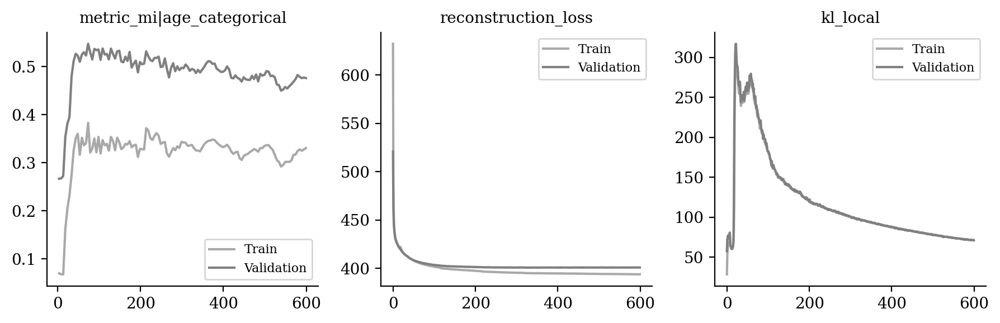

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

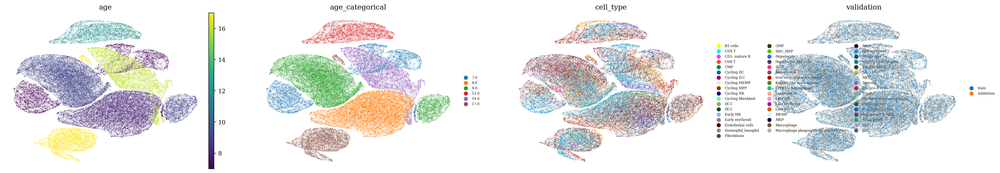

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

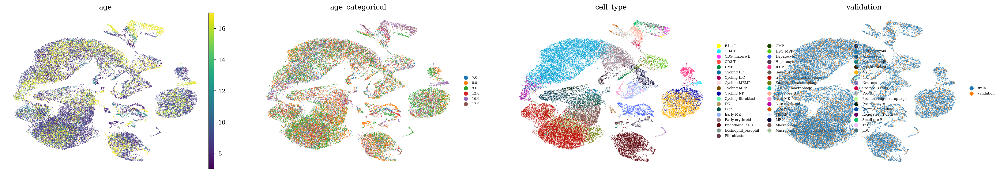

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

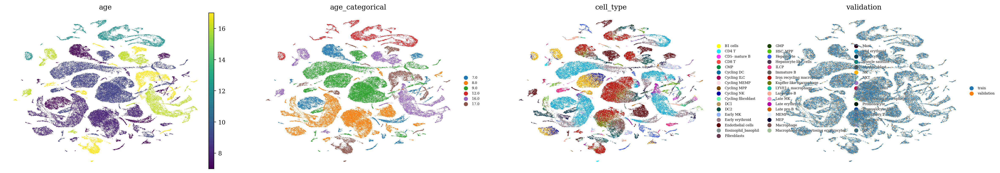

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )